# House Prices Prediction

# <u>Research Question</u> -> How does Neighborhood influence House Prices?
- In the Report the Research Question is framed as **"Evaluating the Influence of Neighborhood on House
Price Prediction Using Machine Learning"**

## <u> Contribution</u> [Group 75] ->

### <u> Code </u> ->
- **Arvind** -> EDA of Numerical Featuers and Outlier Removal 
- **Ayush** -> EDA of Categorical Features, Full Pipeline of Splitting Datasets and Label, One-Hot and Target Encoding 
- **Henry** -> PCA and Training Models (Both XGBoost and LASSO)


### <u> Report </u> ->
- **Arvind** -> Introduction, Literature Review and Dataset Overview
- **Ayush** -> EDA and Methodology
- **Henry** -> Results, Discussion and Conclusion



### <u> CRediT Author Statement </u> ->
- **Arvind** -> Data Curation, Formal Analysis, Software, Visualization, Writing – Original Draft, Writing – Review \& Editing
- **Ayush** -> Conceptualization, Data Curation, Formal Analysis, Software, Methodology,  Visualization, Validation, Investigation, Project Administration, Writing – Original Draft, Writing – Review \& Editing
- **Henry** -> Formal Analysis, Software, Methodology, Visualization, Validation, Investigation, Writing – Original Draft, Writing – Review \& Editing 

In [1]:
import sys
sys.version

'3.12.4 | packaged by Anaconda, Inc. | (main, Jun 18 2024, 15:03:56) [MSC v.1929 64 bit (AMD64)]'

## Importing All the Necessary Libraries

In [2]:
# !pip install category_encoders

In [3]:
# !pip install --upgrade xgboost scikit-learn
# !pip install --upgrade xgboost==1.7.6

In [4]:
# !pip uninstall xgboost -y
# !pip install xgboost==1.6.2

In [5]:
import math
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt

from sklearn.preprocessing import LabelEncoder
from category_encoders import TargetEncoder
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import f_classif
import category_encoders as ce

from sklearn.decomposition import PCA
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler

import xgboost as xgb
from xgboost import plot_importance
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.linear_model import LassoCV
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score

## Loading the Dataset

### Dataset Link
#### https://www.kaggle.com/competitions/house-prices-advanced-regression-techniques/overview
- Both the Dataset and the Data Description for this Dataset can be found at this link

In [6]:
df = pd.read_csv("train.csv")
df.head()

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,...,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2008,WD,Normal,208500
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,...,0,NaN,NaN,NaN,0,5,2007,WD,Normal,181500
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,9,2008,WD,Normal,223500
3,4,70,RL,60.0,9550,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,2,2006,WD,Abnorml,140000
4,5,60,RL,84.0,14260,Pave,NaN,IR1,Lvl,AllPub,...,0,NaN,NaN,NaN,0,12,2008,WD,Normal,250000


In [7]:
df.shape

(1460, 81)

In [8]:
df.describe()

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
count,1460.000000,1460.000000,1201.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1452.000000,1460.000000,...,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000,1460.000000
mean,730.500000,56.897260,70.049958,10516.828082,6.099315,5.575342,1971.267808,1984.865753,103.685262,443.639726,...,94.244521,46.660274,21.954110,3.409589,15.060959,2.758904,43.489041,6.321918,2007.815753,180921.195890
std,421.610009,42.300571,24.284752,9981.264932,1.382997,1.112799,30.202904,20.645407,181.066207,456.098091,...,125.338794,66.256028,61.119149,29.317331,55.757415,40.177307,496.123024,2.703626,1.328095,79442.502883
min,1.000000,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,2006.000000,34900.000000
25%,365.750000,20.000000,59.000000,7553.500000,5.000000,5.000000,1954.000000,1967.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,5.000000,2007.000000,129975.000000
50%,730.500000,50.000000,69.000000,9478.500000,6.000000,5.000000,1973.000000,1994.000000,0.000000,383.500000,...,0.000000,25.000000,0.000000,0.000000,0.000000,0.000000,0.000000,6.000000,2008.000000,163000.000000
75%,1095.250000,70.000000,80.000000,11601.500000,7.000000,6.000000,2000.000000,2004.000000,166.000000,712.250000,...,168.000000,68.000000,0.000000,0.000000,0.000000,0.000000,0.000000,8.000000,2009.000000,214000.000000
max,1460.000000,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000,1600.000000,5644.000000,...,857.000000,547.000000,552.000000,508.000000,480.000000,738.000000,15500.000000,12.000000,2010.000000,755000.000000


In [9]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1460 entries, 0 to 1459
Data columns (total 81 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   Id             1460 non-null   int64  
 1   MSSubClass     1460 non-null   int64  
 2   MSZoning       1460 non-null   object 
 3   LotFrontage    1201 non-null   float64
 4   LotArea        1460 non-null   int64  
 5   Street         1460 non-null   object 
 6   Alley          91 non-null     object 
 7   LotShape       1460 non-null   object 
 8   LandContour    1460 non-null   object 
 9   Utilities      1460 non-null   object 
 10  LotConfig      1460 non-null   object 
 11  LandSlope      1460 non-null   object 
 12  Neighborhood   1460 non-null   object 
 13  Condition1     1460 non-null   object 
 14  Condition2     1460 non-null   object 
 15  BldgType       1460 non-null   object 
 16  HouseStyle     1460 non-null   object 
 17  OverallQual    1460 non-null   int64  
 18  OverallC

In [10]:
df.iloc[:3, :15]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2
0,1,60,RL,65.0,8450,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm
1,2,20,RL,80.0,9600,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Veenker,Feedr,Norm
2,3,60,RL,68.0,11250,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm


# Exploratory Data Analysis (EDA)

### Number of Null Values in All Features

In [11]:
# Check for missing values
missing_values = df.isnull().sum()

# Display only columns with missing values
missing_values = missing_values[missing_values > 0]

print(f"Total Features = {len(missing_values)}\n")
print(missing_values)

Total Features = 19

LotFrontage      259
Alley           1369
MasVnrType       872
MasVnrArea         8
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageYrBlt       81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


### Separating Categorical Features, Numerical Features and Target Variable

In [12]:
# Identify target variable
target_column = "SalePrice"  # Replace with your actual target column

# Segregate categorical and numerical features
df_numerical = df.select_dtypes(include = ["int64", "float64"]).drop(columns = [target_column], errors = "ignore")
df_categorical = df.select_dtypes(include = ["object"])

# Separate the target variable
df_target = df[[target_column]]

# Display the shape of each dataframe
print(f"Numerical Features: {df_numerical.shape}")
print(f"Categorical Features: {df_categorical.shape}")
print(f"Target Variable: {df_target.shape}")

Numerical Features: (1460, 37)
Categorical Features: (1460, 43)
Target Variable: (1460, 1)


## EDA of Categorical Features

### Number of Unique Values for all Categorical Features

In [13]:
# Number of Unique Values of all Categorical Features
for i in df_categorical:
    print(f"{i} = {len(df_categorical[i].unique())}")

MSZoning = 5
Street = 2
Alley = 3
LotShape = 4
LandContour = 4
Utilities = 2
LotConfig = 5
LandSlope = 3
Neighborhood = 25
Condition1 = 9
Condition2 = 8
BldgType = 5
HouseStyle = 8
RoofStyle = 6
RoofMatl = 8
Exterior1st = 15
Exterior2nd = 16
MasVnrType = 4
ExterQual = 4
ExterCond = 5
Foundation = 6
BsmtQual = 5
BsmtCond = 5
BsmtExposure = 5
BsmtFinType1 = 7
BsmtFinType2 = 7
Heating = 6
HeatingQC = 5
CentralAir = 2
Electrical = 6
KitchenQual = 4
Functional = 7
FireplaceQu = 6
GarageType = 7
GarageFinish = 4
GarageQual = 6
GarageCond = 6
PavedDrive = 3
PoolQC = 4
Fence = 5
MiscFeature = 5
SaleType = 9
SaleCondition = 6


## Handling Missing or Null Values

### Number of Null Values in Categorical Features

In [14]:
# Check for missing values
missing_values = df_categorical.isnull().sum()

# Display only columns with missing values
missing_values = missing_values[missing_values > 0]

print(f"Total Features = {len(missing_values)}\n")
print(missing_values)

Total Features = 16

Alley           1369
MasVnrType       872
BsmtQual          37
BsmtCond          37
BsmtExposure      38
BsmtFinType1      37
BsmtFinType2      38
Electrical         1
FireplaceQu      690
GarageType        81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


In [15]:
# Unique Values of Categorical Features with Null Values
for i in df_categorical:
    if(i in missing_values.keys()):
        print(f"{i} = {df_categorical[i].unique()}")

Alley = [nan 'Grvl' 'Pave']
MasVnrType = ['BrkFace' nan 'Stone' 'BrkCmn']
BsmtQual = ['Gd' 'TA' 'Ex' nan 'Fa']
BsmtCond = ['TA' 'Gd' nan 'Fa' 'Po']
BsmtExposure = ['No' 'Gd' 'Mn' 'Av' nan]
BsmtFinType1 = ['GLQ' 'ALQ' 'Unf' 'Rec' 'BLQ' nan 'LwQ']
BsmtFinType2 = ['Unf' 'BLQ' nan 'ALQ' 'Rec' 'LwQ' 'GLQ']
Electrical = ['SBrkr' 'FuseF' 'FuseA' 'FuseP' 'Mix' nan]
FireplaceQu = [nan 'TA' 'Gd' 'Fa' 'Ex' 'Po']
GarageType = ['Attchd' 'Detchd' 'BuiltIn' 'CarPort' nan 'Basment' '2Types']
GarageFinish = ['RFn' 'Unf' 'Fin' nan]
GarageQual = ['TA' 'Fa' 'Gd' nan 'Ex' 'Po']
GarageCond = ['TA' 'Fa' nan 'Gd' 'Po' 'Ex']
PoolQC = [nan 'Ex' 'Fa' 'Gd']
Fence = [nan 'MnPrv' 'GdWo' 'GdPrv' 'MnWw']
MiscFeature = [nan 'Shed' 'Gar2' 'Othr' 'TenC']


#### BsmtExposure and BsmtFinType2 have 1 Extra Row with Null values which cannot be Impute with No Basement since that Row has a Basement

In [16]:
df_null_1 = df_categorical[df_categorical['BsmtQual'].isnull()]

In [17]:
df_null_2 = df_categorical[df_categorical['BsmtExposure'].isnull()]

In [18]:
df_null_3 = df_categorical[df_categorical['BsmtFinType2'].isnull()]

In [19]:
# Find rows that are in df_null_1 but not in df_null_2
uncommon_1 = df_null_1[~df_null_1.apply(tuple, axis=1).isin(df_null_2.apply(tuple, axis=1))]

# Find rows that are in df_null_2 but not in df_null_1
uncommon_2 = df_null_2[~df_null_2.apply(tuple, axis=1).isin(df_null_1.apply(tuple, axis=1))]

# Find rows that are in df_null_1 but not in df_null_3
uncommon_3 = df_null_1[~df_null_1.apply(tuple, axis=1).isin(df_null_3.apply(tuple, axis=1))]

# Find rows that are in df_null_3 but not in df_null_1
uncommon_4 = df_null_3[~df_null_3.apply(tuple, axis=1).isin(df_null_1.apply(tuple, axis=1))]

# Combine both to get all uncommon rows
uncommon_rows_1 = pd.concat([uncommon_1, uncommon_2])

# Combine both to get all uncommon rows
uncommon_rows_2 = pd.concat([uncommon_3, uncommon_4])

In [20]:
uncommon_rows_1

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
948,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal


In [21]:
uncommon_rows_2

,MSZoning,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,...,GarageType,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MiscFeature,SaleType,SaleCondition
332,RL,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,NridgHt,Norm,...,Attchd,RFn,TA,TA,Y,NaN,NaN,NaN,WD,Normal


In [22]:
# df_categorical.loc[[100, 105], ['Alley', 'Fence']]
# df_categorical.loc[948, ['BsmtQual', 'BsmtExposure']]

print(df_categorical.loc[947, ["BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2"]])
print(df_categorical.loc[949, ["BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2"]])
print(uncommon_rows_1.loc[948, ["BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2"]])

BsmtQual         Gd
BsmtCond         TA
BsmtExposure     Av
BsmtFinType1    GLQ
BsmtFinType2    Unf
Name: 947, dtype: object
BsmtQual         TA
BsmtCond         TA
BsmtExposure     No
BsmtFinType1    ALQ
BsmtFinType2    Unf
Name: 949, dtype: object
BsmtQual         Gd
BsmtCond         TA
BsmtExposure    NaN
BsmtFinType1    Unf
BsmtFinType2    Unf
Name: 948, dtype: object


#### Index 948 is imputed with Average (Av) since 947 has the same combination of values as 948 for the First 2 rows

In [23]:
print(df_categorical.loc[331, ["BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2"]])
print(df_categorical.loc[333, ["BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2"]])
print(uncommon_rows_2.loc[332, ["BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2"]])

BsmtQual         TA
BsmtCond         TA
BsmtExposure     No
BsmtFinType1    Rec
BsmtFinType2    Unf
Name: 331, dtype: object
BsmtQual         Gd
BsmtCond         TA
BsmtExposure     Av
BsmtFinType1    GLQ
BsmtFinType2    Unf
Name: 333, dtype: object
BsmtQual         Gd
BsmtCond         TA
BsmtExposure     No
BsmtFinType1    GLQ
BsmtFinType2    NaN
Name: 332, dtype: object


#### Index 332 is imputed with Unfinished (Unf) since 333 has the same combination of values as 332 for 3 rows

In [24]:
df_categorical.loc[948, "BsmtExposure"] = "Av"
df_categorical.loc[332, "BsmtFinType2"] = "Unf"

In [25]:
print(df_categorical.loc[948, ["BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2"]])
print(df_categorical.loc[332, ["BsmtQual", "BsmtCond", "BsmtExposure", "BsmtFinType1", "BsmtFinType2"]])

BsmtQual         Gd
BsmtCond         TA
BsmtExposure     Av
BsmtFinType1    Unf
BsmtFinType2    Unf
Name: 948, dtype: object
BsmtQual         Gd
BsmtCond         TA
BsmtExposure     No
BsmtFinType1    GLQ
BsmtFinType2    Unf
Name: 332, dtype: object


In [26]:
# Check for missing values
missing_values = df_categorical.isnull().sum()

# Display only columns with missing values
missing_values = missing_values[missing_values > 0]

print(f"Total Features = {len(missing_values)}\n")
print(missing_values)

Total Features = 16

Alley           1369
MasVnrType       872
BsmtQual          37
BsmtCond          37
BsmtExposure      37
BsmtFinType1      37
BsmtFinType2      37
Electrical         1
FireplaceQu      690
GarageType        81
GarageFinish      81
GarageQual        81
GarageCond        81
PoolQC          1453
Fence           1179
MiscFeature     1406
dtype: int64


### Electrical Feature has a genuine Null value and since it is only 1, it is Imputed with Mode

In [27]:
# Electrical (only 1 missing value) - Replace with mode
df_categorical["Electrical"] = df_categorical["Electrical"].fillna(df_categorical["Electrical"].mode()[0])

### The Null values are Replaced based on Data Description given for this Dataset

In [28]:
df_categorical["Alley"] = df_categorical["Alley"].fillna("No alley access")
df_categorical["MasVnrType"] = df_categorical["MasVnrType"].fillna("None")

df_categorical["BsmtQual"] = df_categorical["BsmtQual"].fillna("No Basement")
df_categorical["BsmtCond"] = df_categorical["BsmtCond"].fillna("No Basement")
df_categorical["BsmtExposure"] = df_categorical["BsmtExposure"].fillna("No Basement")
df_categorical["BsmtFinType1"] = df_categorical["BsmtFinType1"].fillna("No Basement")
df_categorical["BsmtFinType2"] = df_categorical["BsmtFinType2"].fillna("No Basement")

df_categorical["FireplaceQu"] = df_categorical["FireplaceQu"].fillna("No Fireplace")
df_categorical["PoolQC"] = df_categorical["PoolQC"].fillna("No Pool")
df_categorical["Fence"] = df_categorical["Fence"].fillna("No Fence")
df_categorical["MiscFeature"] = df_categorical["MiscFeature"].fillna("None")

df_categorical["GarageType"] = df_categorical["GarageType"].fillna("No Garage")
df_categorical["GarageFinish"] = df_categorical["GarageFinish"].fillna("No Garage")
df_categorical["GarageQual"] = df_categorical["GarageQual"].fillna("No Garage")
df_categorical["GarageCond"] = df_categorical["GarageCond"].fillna("No Garage")

In [29]:
# Check for missing values
missing_values = df_categorical.isnull().sum()

# Display only columns with missing values
missing_values = missing_values[missing_values > 0]

print(f"Total Features = {len(missing_values)}\n")
print(missing_values)

Total Features = 0

Series([], dtype: int64)


# Plotting Graphs

## Visualizing the Distribution of Categorical Features using Bar Plots

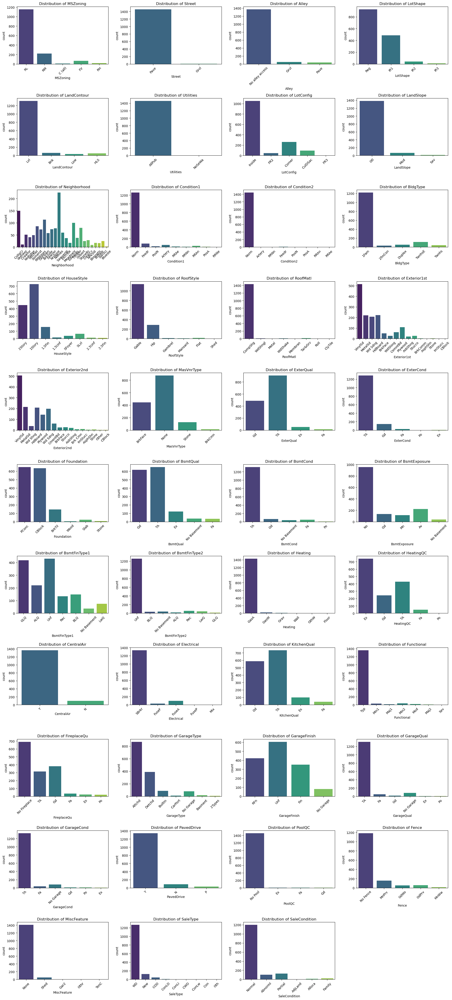

In [30]:
# Calculate required rows dynamically
num_cols = 4  # Number of columns in the grid
num_features = len(df_categorical.columns)
num_rows = math.ceil(num_features / num_cols)  # Adjust rows based on features

# Create subplots
fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, num_rows * 4))

# Flatten axes array for easy indexing
axes = axes.flatten()

# Plot bar charts
for i, col in enumerate(df_categorical.columns):
    sns.countplot(x=df_categorical[col], ax=axes[i], hue=df_categorical[col], palette="viridis", legend=False)
    axes[i].set_title(f"Distribution of {col}")
    axes[i].tick_params(axis='x', rotation=45)

# Hide any unused subplots
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])  # Remove extra empty plots

plt.tight_layout()
plt.show()

### Individual Bar Plot of some Selected Features

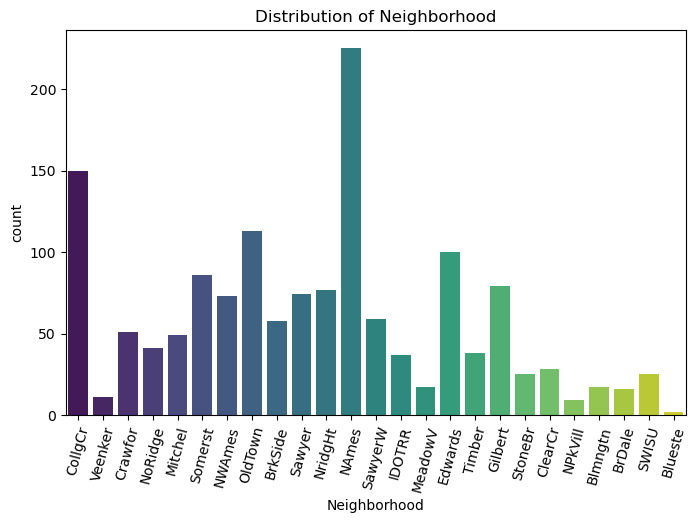

In [31]:
feature = "Neighborhood"  # Change this to any feature you want

plt.figure(figsize = (8, 5))
sns.countplot(x = df_categorical[feature], hue = df_categorical[feature], palette = "viridis", legend = False)
plt.title(f"Distribution of {feature}")
plt.xticks(rotation = 75)  # Rotate labels for better readability
plt.show()

## Box Plot to Visualise Relationship with Target Variable Before Encoding

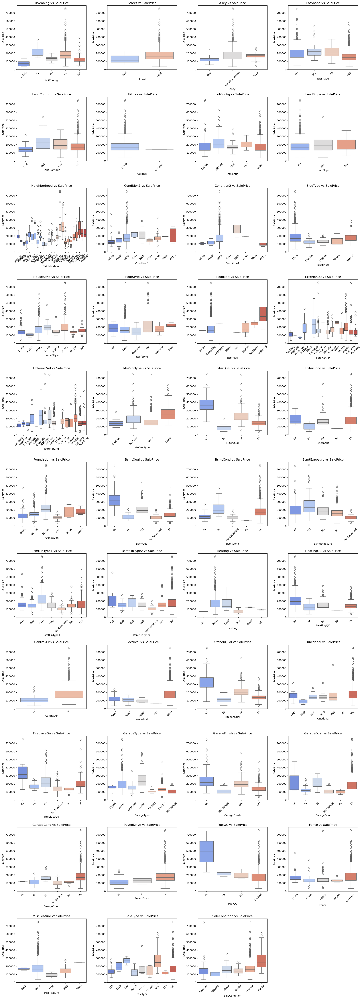

In [32]:
# Ensure categorical columns are treated as strings
df_categorical = df_categorical.astype(str)

# Define number of categorical columns
num_cats = len(df_categorical.columns)

# Create appropriate grid size
num_rows = int(np.ceil(num_cats / 4))  # Adjust rows dynamically
num_cols = min(4, num_cats)  # Ensure no more than 4 cols

fig, axes = plt.subplots(nrows=num_rows, ncols=num_cols, figsize=(20, 5 * num_rows))

# Flatten axes for easy indexing if there's only one row
axes = np.array(axes).flatten()

for i, col in enumerate(df_categorical.columns):
    # Drop NaN values
    data = df_categorical[[col]].join(df_target["SalePrice"]).dropna()

    # Convert column explicitly to category dtype
    data[col] = data[col].astype("category")
    
    sns.boxplot(x=data[col], y=data["SalePrice"], ax=axes[i], hue=data[col], palette="coolwarm", legend=False)
    axes[i].set_title(f"{col} vs SalePrice")
    axes[i].tick_params(axis='x', rotation=45)

# Hide unused subplots (if any)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])  

plt.tight_layout()
plt.show()

### Individual Box Plot of some selected Features

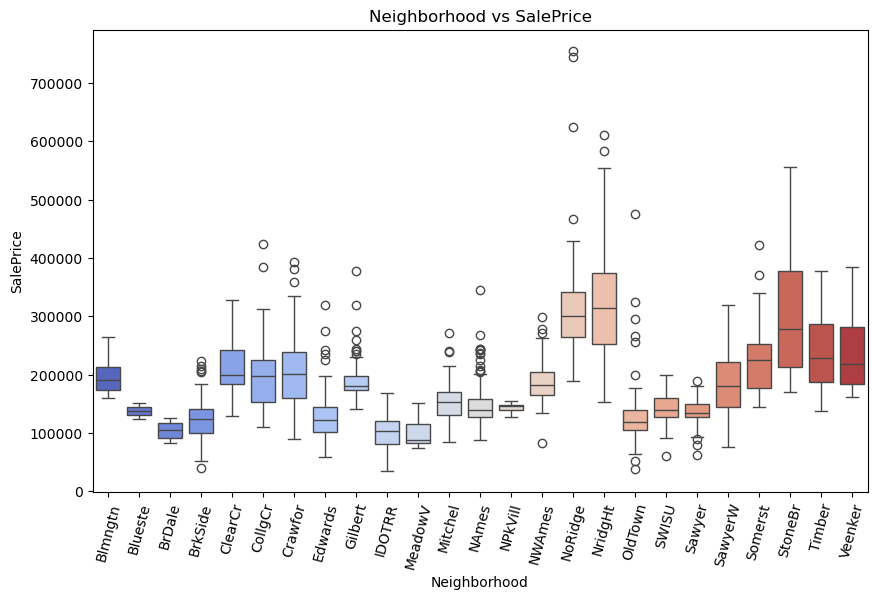

In [33]:
feature = "Neighborhood"  # Replace with actual feature name

# Drop NaN values to avoid errors
data = df_categorical[[feature]].join(df_target["SalePrice"]).dropna()

# Convert to categorical dtype (optional)
data[feature] = data[feature].astype("category")

plt.figure(figsize=(10, 6))
sns.boxplot(x=data[feature], y=data["SalePrice"], hue=data[feature], palette="coolwarm", legend=False)

plt.title(f"{feature} vs SalePrice")
plt.xticks(rotation = 75)
plt.show()

### Its Difficult to Analyse or Draw any Insights from all plots like this. We will later Plot Individual Bar & Box Plot of all Features side by side for better Visualisation and Understanding

# Encoding Categorical Features

### Encoding Ordinal Features

In [34]:
# Unique Values of Categorical Features with Null Values
for i in df_categorical:
    print(f"{i} = {df_categorical[i].unique()}")

MSZoning = ['RL' 'RM' 'C (all)' 'FV' 'RH']
Street = ['Pave' 'Grvl']
Alley = ['No alley access' 'Grvl' 'Pave']
LotShape = ['Reg' 'IR1' 'IR2' 'IR3']
LandContour = ['Lvl' 'Bnk' 'Low' 'HLS']
Utilities = ['AllPub' 'NoSeWa']
LotConfig = ['Inside' 'FR2' 'Corner' 'CulDSac' 'FR3']
LandSlope = ['Gtl' 'Mod' 'Sev']
Neighborhood = ['CollgCr' 'Veenker' 'Crawfor' 'NoRidge' 'Mitchel' 'Somerst' 'NWAmes'
 'OldTown' 'BrkSide' 'Sawyer' 'NridgHt' 'NAmes' 'SawyerW' 'IDOTRR'
 'MeadowV' 'Edwards' 'Timber' 'Gilbert' 'StoneBr' 'ClearCr' 'NPkVill'
 'Blmngtn' 'BrDale' 'SWISU' 'Blueste']
Condition1 = ['Norm' 'Feedr' 'PosN' 'Artery' 'RRAe' 'RRNn' 'RRAn' 'PosA' 'RRNe']
Condition2 = ['Norm' 'Artery' 'RRNn' 'Feedr' 'PosN' 'PosA' 'RRAn' 'RRAe']
BldgType = ['1Fam' '2fmCon' 'Duplex' 'TwnhsE' 'Twnhs']
HouseStyle = ['2Story' '1Story' '1.5Fin' '1.5Unf' 'SFoyer' 'SLvl' '2.5Unf' '2.5Fin']
RoofStyle = ['Gable' 'Hip' 'Gambrel' 'Mansard' 'Flat' 'Shed']
RoofMatl = ['CompShg' 'WdShngl' 'Metal' 'WdShake' 'Membran' 'Tar&Grv' 'Roll'


### There are 21 Ordinal Features based on Unique Values and Data Description

### Applying Label Encoding for Ordinal Features

In [35]:
# Define ordinal features and their order
ordinal_features = {
    'ExterQual': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'ExterCond': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'BsmtQual': ['No Basement', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'BsmtCond': ['No Basement', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'BsmtExposure': ['No Basement', 'No', 'Mn', 'Av', 'Gd'],
    'BsmtFinType1': ['No Basement', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ'],
    'BsmtFinType2': ['No Basement', 'Unf', 'LwQ', 'Rec', 'BLQ', 'ALQ', 'GLQ'],
    'HeatingQC': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'KitchenQual': ['Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'FireplaceQu': ['No Fireplace', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'GarageFinish': ['No Garage', 'Unf', 'RFn', 'Fin'],
    'GarageQual': ['No Garage', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'GarageCond': ['No Garage', 'Po', 'Fa', 'TA', 'Gd', 'Ex'],
    'PavedDrive': ['N', 'P', 'Y'],
    'PoolQC': ['No Pool', 'Fa', 'Gd', 'Ex'],
    'Fence': ['No Fence', 'MnWw', 'MnPrv', 'GdWo', 'GdPrv'],
    'Functional': ['Sev', 'Maj2', 'Maj1', 'Mod', 'Min2', 'Min1', 'Typ'],
    'LotShape' : ['IR3', 'IR2', 'IR1', 'Reg'],
    'LandSlope' : ['Sev', 'Mod', 'Gtl'],
    'LandContour' : ['HLS', 'Low', 'Bnk', 'Lvl'],
    'Utilities' : ['ELO', 'NoSeWa', 'NoSewr', 'AllPub']
}

# Apply label encoding based on defined order
for feature, order in ordinal_features.items():
    label_map = {category: idx for idx, category in enumerate(order)}
    df_categorical[feature] = df_categorical[feature].map(label_map)

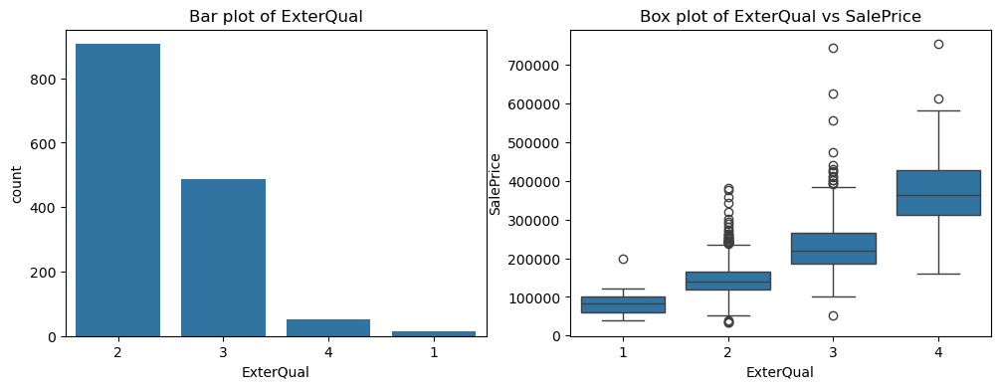

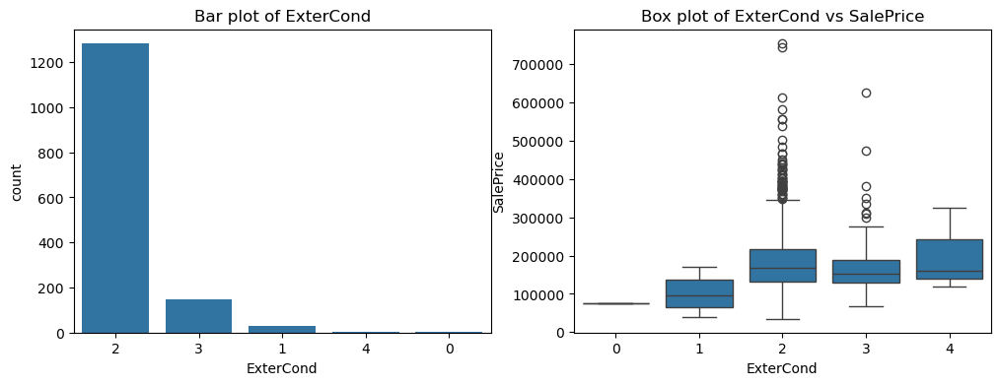

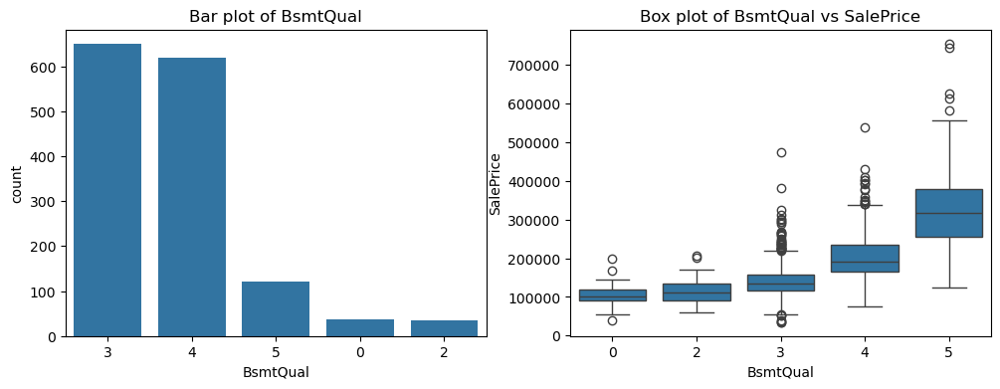

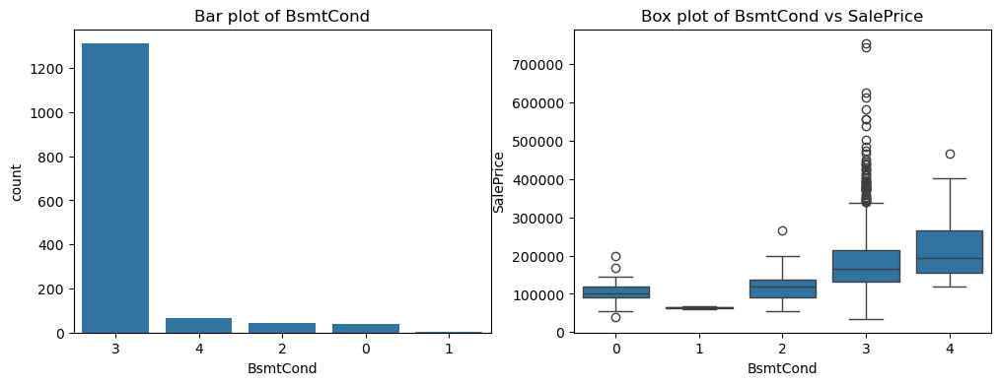

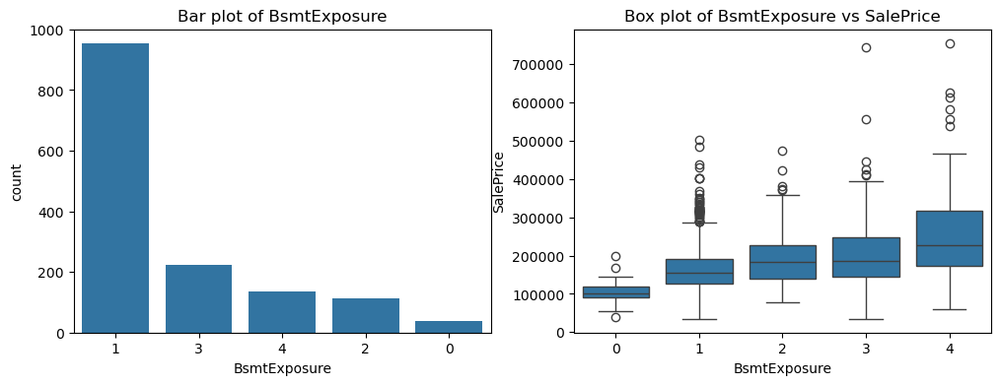

...

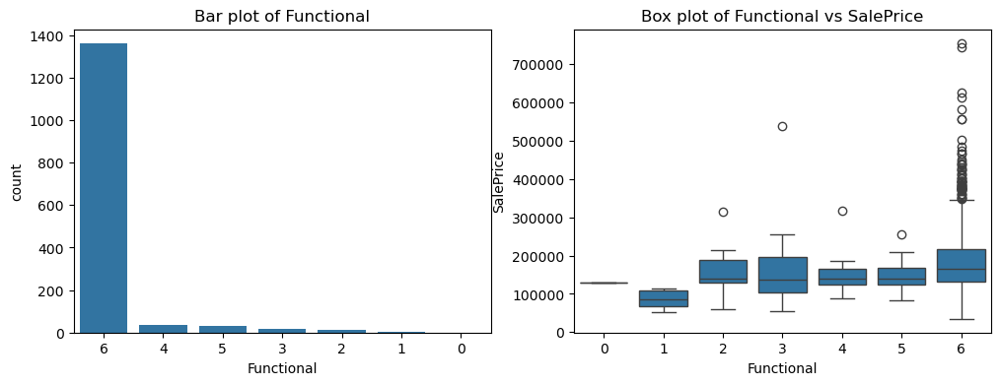

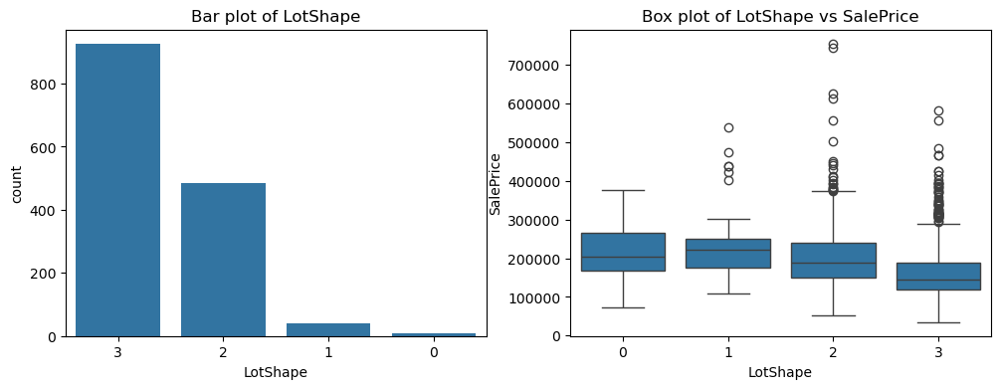

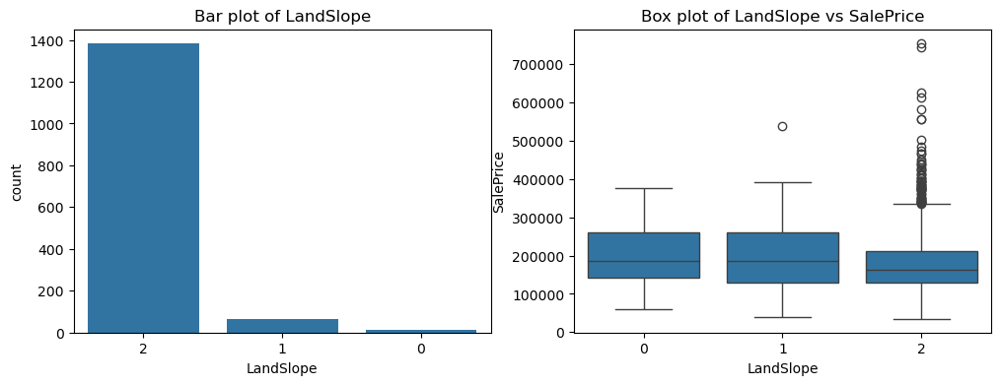

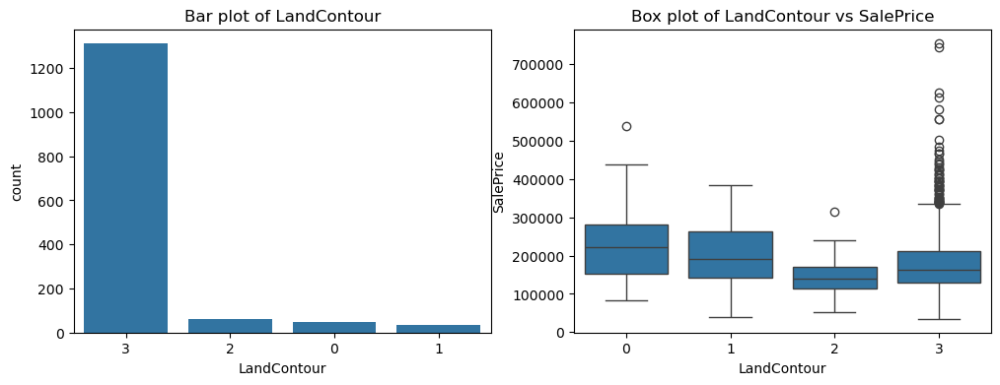

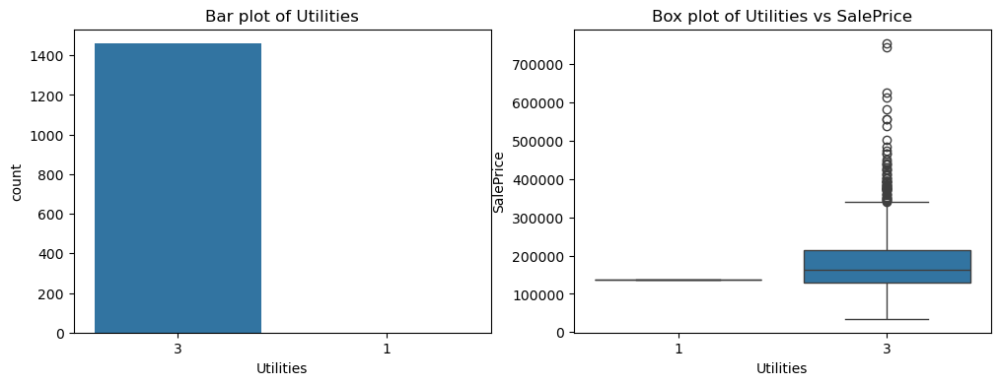

In [36]:
# Plot bar and box plots to check for rare categories
for feature in ordinal_features.keys():
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    sns.countplot(x=df_categorical[feature], order=df_categorical[feature].value_counts().index)
    plt.xticks(rotation=0)
    plt.title(f"Bar plot of {feature}")
    
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_categorical[feature], y=df_target['SalePrice'])
    plt.xticks(rotation=0)
    plt.title(f"Box plot of {feature} vs SalePrice")
    
    plt.show()

### Merging Rare Categories (Categories with very Less Frequency) or Indistinguishable Categories

In [37]:
# Feature Distribution before Merging
print(df_categorical['LandContour'].value_counts())

LandContour
3    1311
2      63
0      50
1      36
Name: count, dtype: int64


In [38]:
def merge_selected_categories(df, feature, merge_map):
    for new_category, old_categories in merge_map.items():
        df[feature] = df[feature].replace(old_categories, new_category)
    return df

In [39]:
# Define merging strategy: Merge 0, 1, 2, and 3 into category 'Merged'
merge_map_ExterQual = {2: [1, 2]}
merge_map_ExterCond_1 = {1: [0, 1]}
merge_map_ExterCond_2 = {2: [2, 3, 4]}
merge_map_BsmtQual = {3: [0, 1, 2, 3]} # See how to Deal with Category 1 later
merge_map_BsmtCond_1 = {2: [0, 1, 2]}
merge_map_BsmtCond_2 = {3: [3, 4]}
merge_map_BsmtExposure = {1: [1, 2, 3]}
merge_map_BsmtFinType1 = {1: [1, 2, 3, 4, 5]}
merge_map_BsmtFinType2 = {1: [1, 2, 3, 4, 5, 6]}
merge_map_HeatingQC = {3: [0, 1, 2, 3]}
merge_map_KitchenQual = {2: [0, 1, 2]}
merge_map_FireplaceQu_1 = {0: [0, 1, 2]}
merge_map_FireplaceQu_2 = {3: [3, 4, 5]}
merge_map_GarageFinish_1 = {2: [2, 3]}
merge_map_GarageFinish_2 = {0: [0, 1]}
merge_map_GarageQual_1 = {0: [0, 1, 2]}
merge_map_GarageQual_2 = {3: [3, 4, 5]}
merge_map_GarageCond_1 = {0: [0, 1, 2]}
merge_map_GarageCond_2 = {3: [3, 4, 5]}
merge_map_PavedDrive = {0: [0, 1]}
merge_map_PoolQC = {1: [1, 2, 3]}
merge_map_Fence_1 = {1: [1, 2, 3]}
merge_map_Fence_2 = {0: [0, 4]}
merge_map_Functional = {0: [0, 1, 2, 3, 4, 5]}
merge_map_LotShape = {0: [0, 1, 2]}
merge_map_LandSlope = {0: [0, 1]}
merge_map_LandContour_1 = {0: [0, 1]}
merge_map_LandContour_2 = {3: [2, 3]}

df_categorical = merge_selected_categories(df_categorical, 'ExterQual', merge_map_ExterQual)
df_categorical = merge_selected_categories(df_categorical, 'ExterCond', merge_map_ExterCond_1)
df_categorical = merge_selected_categories(df_categorical, 'ExterCond', merge_map_ExterCond_2)
df_categorical = merge_selected_categories(df_categorical, 'BsmtQual', merge_map_BsmtQual)
df_categorical = merge_selected_categories(df_categorical, 'BsmtCond', merge_map_BsmtCond_1)
df_categorical = merge_selected_categories(df_categorical, 'BsmtCond', merge_map_BsmtCond_2)
df_categorical = merge_selected_categories(df_categorical, 'BsmtExposure', merge_map_BsmtExposure)
df_categorical = merge_selected_categories(df_categorical, 'BsmtFinType1', merge_map_BsmtFinType1)
df_categorical = merge_selected_categories(df_categorical, 'BsmtFinType2', merge_map_BsmtFinType2)
df_categorical = merge_selected_categories(df_categorical, 'HeatingQC', merge_map_HeatingQC)
df_categorical = merge_selected_categories(df_categorical, 'KitchenQual', merge_map_KitchenQual)
df_categorical = merge_selected_categories(df_categorical, 'FireplaceQu', merge_map_FireplaceQu_1)
df_categorical = merge_selected_categories(df_categorical, 'FireplaceQu', merge_map_FireplaceQu_2)
df_categorical = merge_selected_categories(df_categorical, 'GarageFinish', merge_map_GarageFinish_1)
df_categorical = merge_selected_categories(df_categorical, 'GarageFinish', merge_map_GarageFinish_2)
df_categorical = merge_selected_categories(df_categorical, 'GarageQual', merge_map_GarageQual_1)
df_categorical = merge_selected_categories(df_categorical, 'GarageQual', merge_map_GarageQual_2)
df_categorical = merge_selected_categories(df_categorical, 'GarageCond', merge_map_GarageCond_1)
df_categorical = merge_selected_categories(df_categorical, 'GarageCond', merge_map_GarageCond_2)
df_categorical = merge_selected_categories(df_categorical, 'PavedDrive', merge_map_PavedDrive)
df_categorical = merge_selected_categories(df_categorical, 'PoolQC', merge_map_PoolQC)
df_categorical = merge_selected_categories(df_categorical, 'Fence', merge_map_Fence_1)
df_categorical = merge_selected_categories(df_categorical, 'Fence', merge_map_Fence_2)
df_categorical = merge_selected_categories(df_categorical, 'Functional', merge_map_Functional)
df_categorical = merge_selected_categories(df_categorical, 'LotShape', merge_map_LotShape)
df_categorical = merge_selected_categories(df_categorical, 'LandSlope', merge_map_LandSlope)
df_categorical = merge_selected_categories(df_categorical, 'LandContour', merge_map_LandContour_1)
df_categorical = merge_selected_categories(df_categorical, 'LandContour', merge_map_LandContour_2)

# Print the transformed feature distribution
print(df_categorical['LandContour'].value_counts())

LandContour
3    1374
0      86
Name: count, dtype: int64


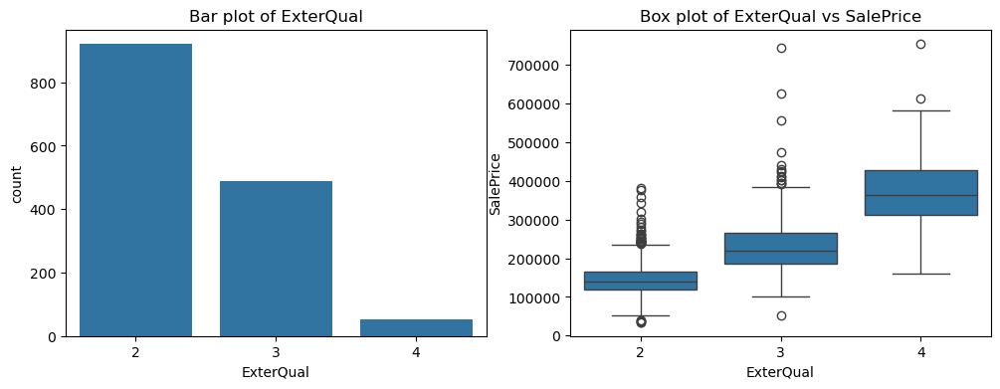

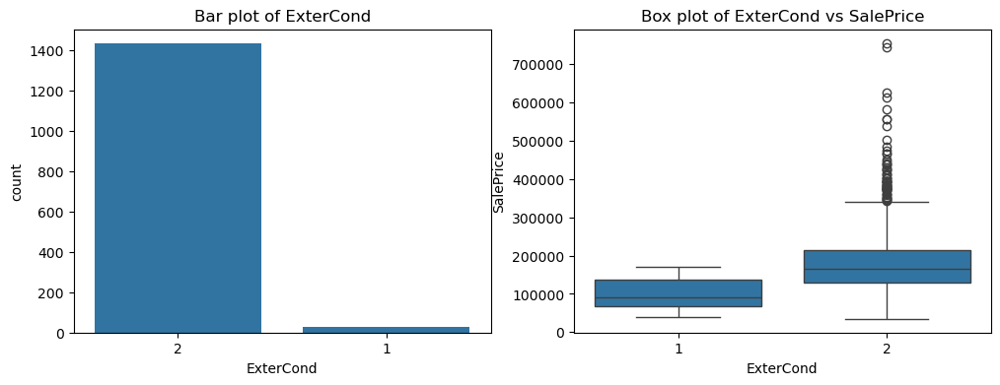

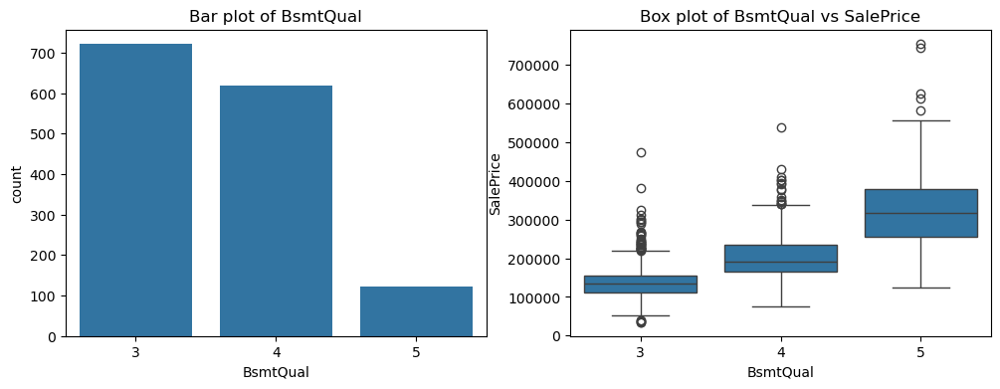

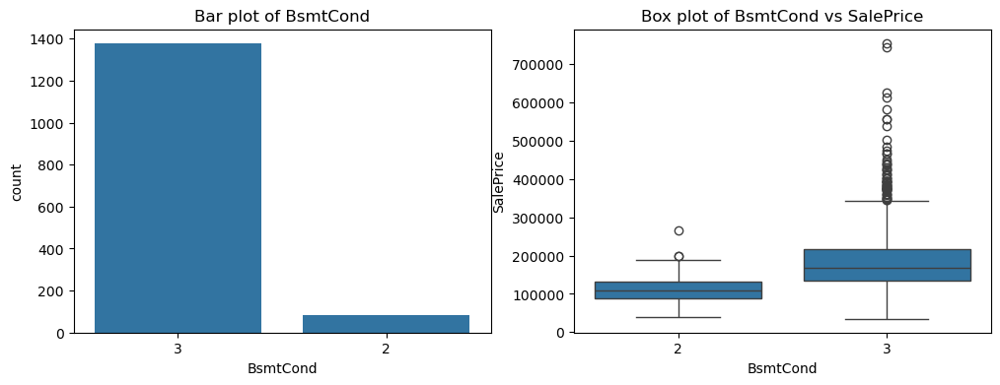

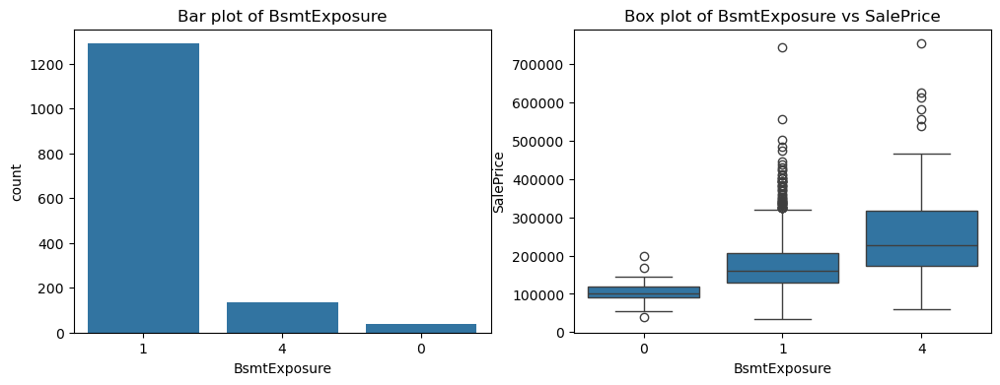

...

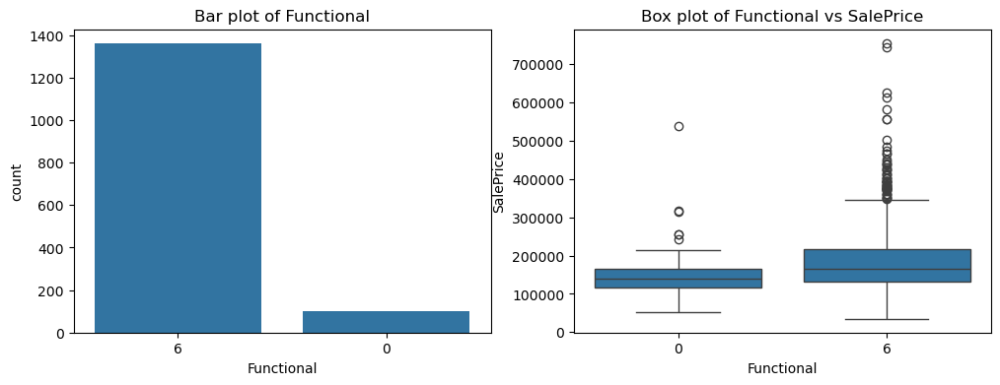

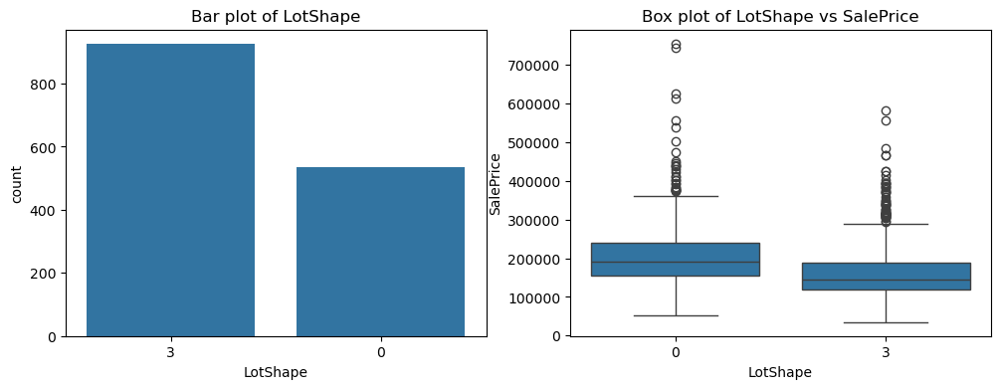

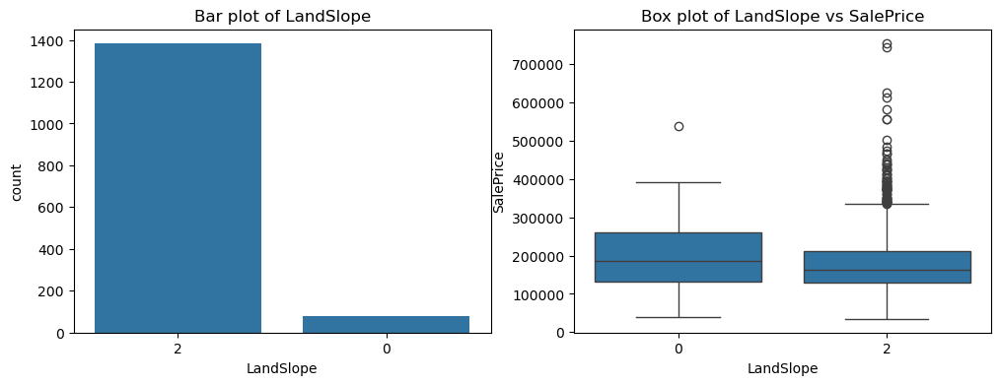

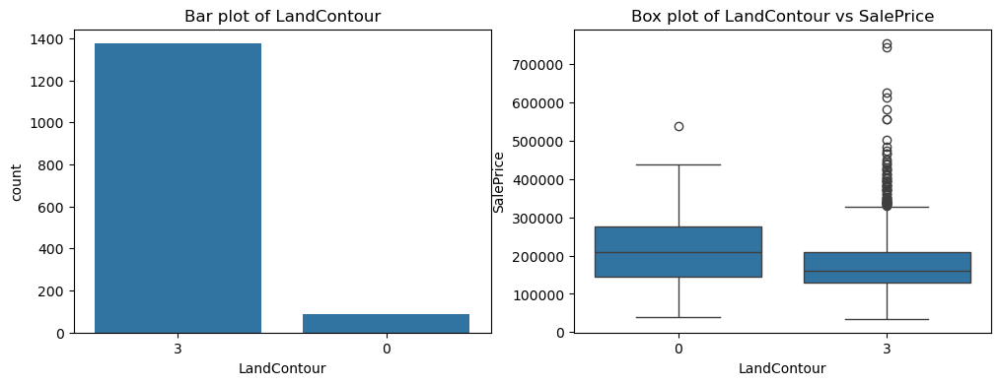

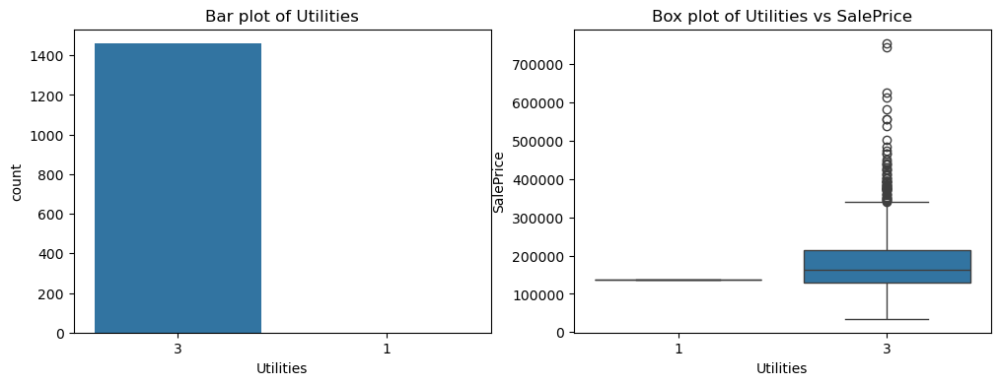

In [40]:
# Plot bar and box plots to check for rare categories
for feature in ordinal_features.keys():
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    sns.countplot(x=df_categorical[feature], order=df_categorical[feature].value_counts().index)
    plt.xticks(rotation=0)
    plt.title(f"Bar plot of {feature}")
    
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_categorical[feature], y=df_target['SalePrice'])
    plt.xticks(rotation=0)
    plt.title(f"Box plot of {feature} vs SalePrice")
    
    plt.show()

### PoolQC, Utilities and LandSlope are looking like Bad Features after analysing the Box Plots so they are Dropped

In [41]:
# Dropping the above mentioned columns
df_categorical = df_categorical.drop(columns=['PoolQC', 'Utilities', 'LandSlope'])

# Display the cleaned DataFrame
print(df_categorical.shape)

(1460, 40)


In [42]:
del ordinal_features['PoolQC']
del ordinal_features['Utilities']
del ordinal_features['LandSlope']
print(len(ordinal_features.keys()))

18


### Values after Merging Categories are Distorted so we will Remap them

In [43]:
print(df_categorical['LandContour'].value_counts())

LandContour
3    1374
0      86
Name: count, dtype: int64


In [44]:
# Manually remapping categories
df_categorical['ExterQual'] = df_categorical['ExterQual'].replace({2: 0, 3: 1, 4: 2})
df_categorical['ExterCond'] = df_categorical['ExterCond'].replace({1: 0, 2: 1})
df_categorical['BsmtQual'] = df_categorical['BsmtQual'].replace({3: 0, 4: 1, 5: 2})
df_categorical['BsmtCond'] = df_categorical['BsmtCond'].replace({2: 0, 3: 1})
df_categorical['BsmtExposure'] = df_categorical['BsmtExposure'].replace({4: 2})
df_categorical['BsmtFinType1'] = df_categorical['BsmtFinType1'].replace({6: 2})
# "BsmtFinType2" is Already in Correct Order
df_categorical['HeatingQC'] = df_categorical['HeatingQC'].replace({3: 0, 4: 1})
df_categorical['KitchenQual'] = df_categorical['KitchenQual'].replace({2: 0, 3: 1, 4: 2})
df_categorical['FireplaceQu'] = df_categorical['FireplaceQu'].replace({3: 1})
df_categorical['GarageFinish'] = df_categorical['GarageFinish'].replace({2: 1})
df_categorical['GarageQual'] = df_categorical['GarageQual'].replace({3: 1})
df_categorical['GarageCond'] = df_categorical['GarageCond'].replace({3: 1})
df_categorical['PavedDrive'] = df_categorical['PavedDrive'].replace({2: 1})
# "Fence" is Already in Correct Order
df_categorical['LotShape'] = df_categorical['LotShape'].replace({3: 1})
# "Utilities" will be Dropped
df_categorical['LandContour'] = df_categorical['LandContour'].replace({3: 1})
df_categorical['Functional'] = df_categorical['Functional'].replace({6: 1})

# Display updated DataFrame
print(df_categorical['LandContour'].value_counts())

LandContour
1    1374
0      86
Name: count, dtype: int64


#### Plotting Bar & Box Plot Again to see the Changes

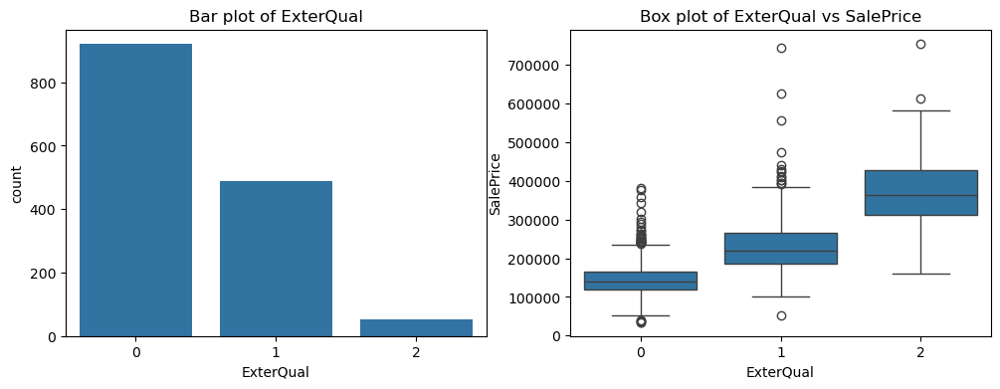

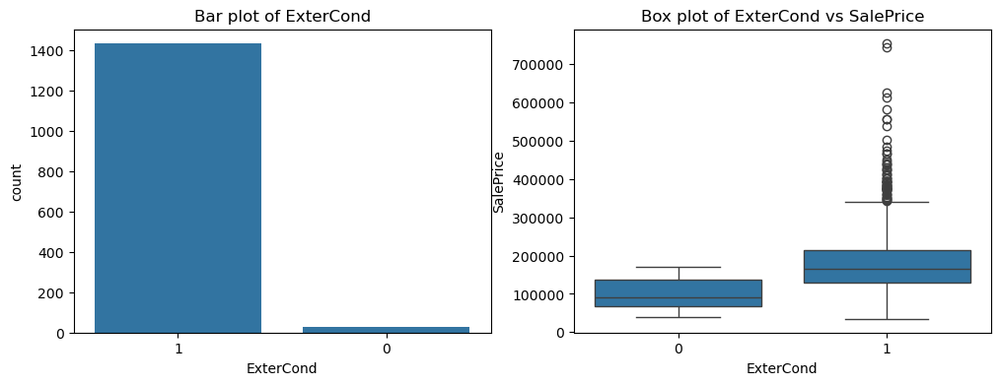

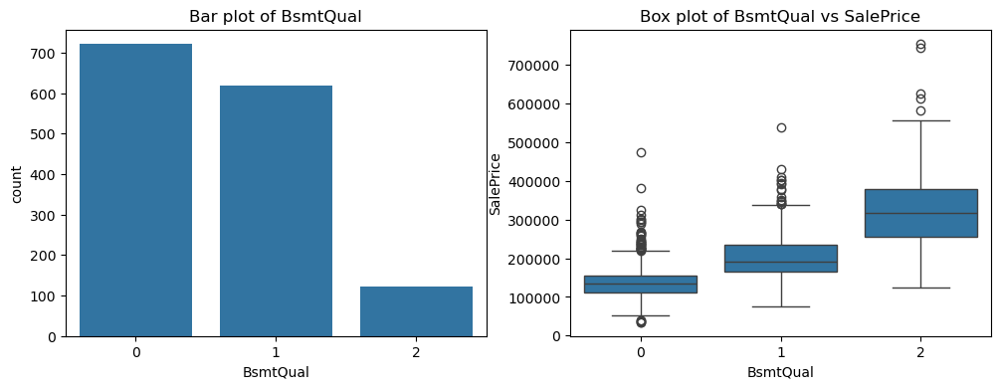

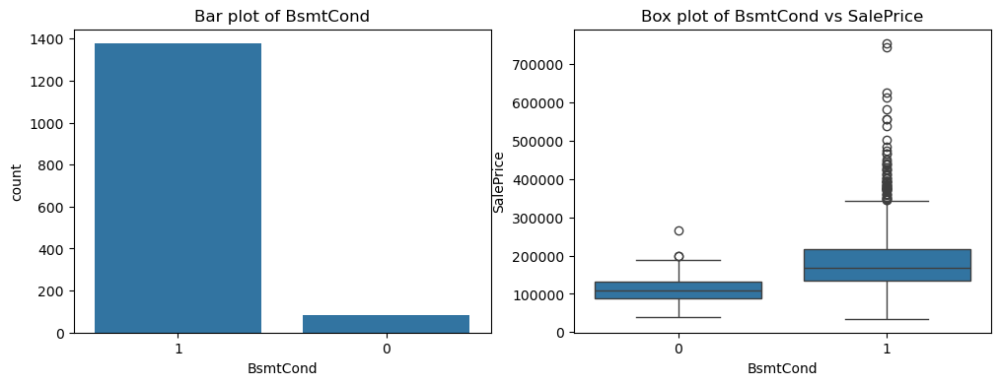

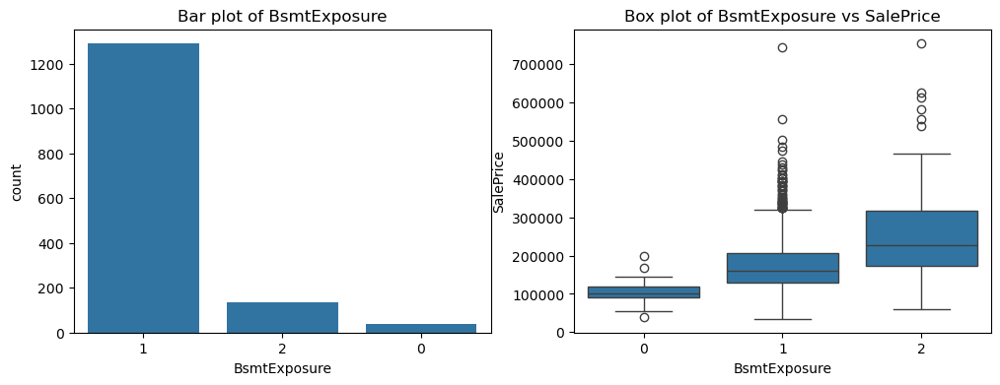

...

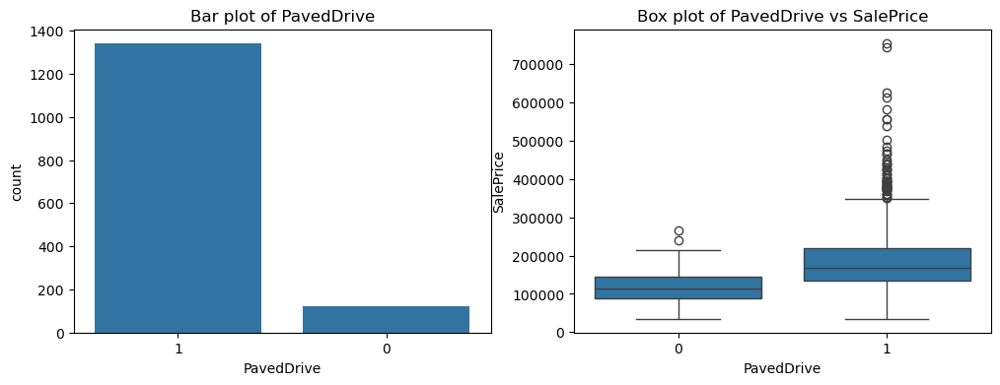

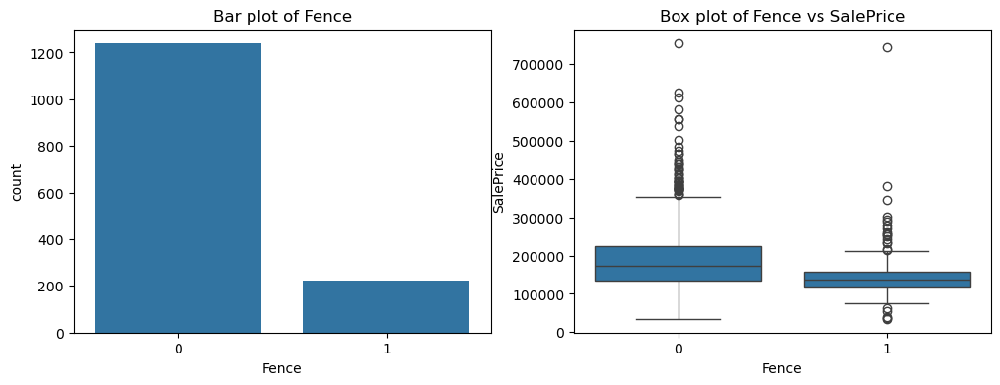

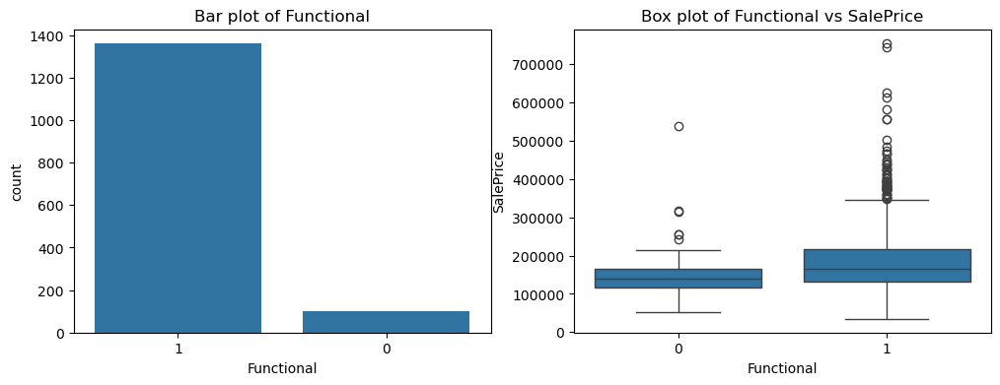

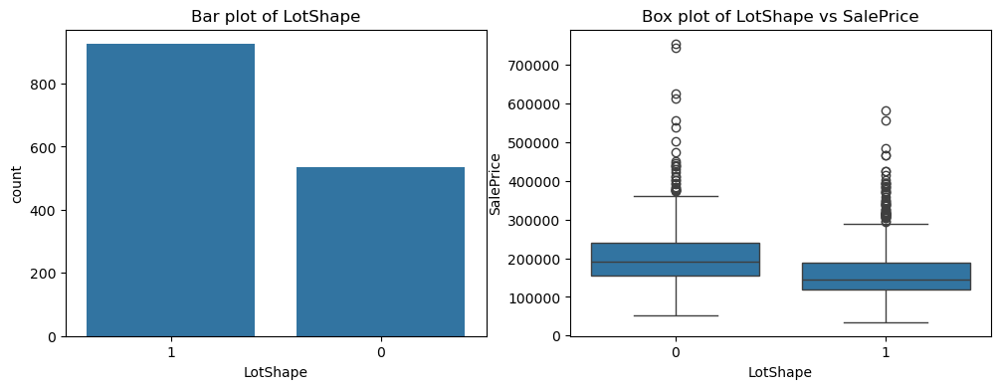

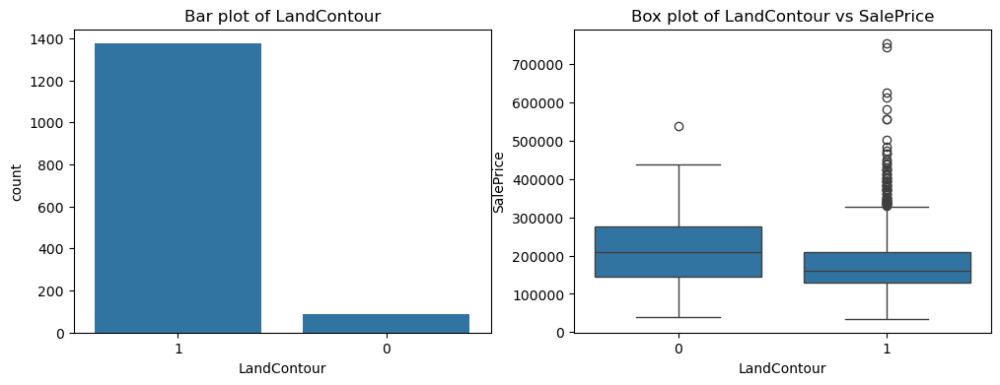

In [45]:
# Plot bar and box plots to check for rare categories
for feature in ordinal_features.keys():
    plt.figure(figsize=(12, 4))
    
    plt.subplot(1, 2, 1)
    sns.countplot(x=df_categorical[feature], order=df_categorical[feature].value_counts().index)
    plt.xticks(rotation=0)
    plt.title(f"Bar plot of {feature}")
    
    plt.subplot(1, 2, 2)
    sns.boxplot(x=df_categorical[feature], y=df_target['SalePrice'])
    plt.xticks(rotation=0)
    plt.title(f"Box plot of {feature} vs SalePrice")
    
    plt.show()

In [46]:
df_categorical.shape

(1460, 40)

# EDA of Numerical Features

In [47]:
# Combining Numerical Features and Target Variable
df_numerical = pd.concat([df_numerical, df_target], axis=1)
df_numerical.head()  # Check the combined DataFrame

,Id,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,1,60,65.0,8450,7,5,2003,2003,196.0,706,...,0,61,0,0,0,0,0,2,2008,208500
1,2,20,80.0,9600,6,8,1976,1976,0.0,978,...,298,0,0,0,0,0,0,5,2007,181500
2,3,60,68.0,11250,7,5,2001,2002,162.0,486,...,0,42,0,0,0,0,0,9,2008,223500
3,4,70,60.0,9550,7,5,1915,1970,0.0,216,...,0,35,272,0,0,0,0,2,2006,140000
4,5,60,84.0,14260,8,5,2000,2000,350.0,655,...,192,84,0,0,0,0,0,12,2008,250000


In [48]:
df_numerical.shape

(1460, 38)

## Plotting Pair Plot to see the Distribution of Each Feature

#### ID column is Excluded since it doesn't make sense to Include it

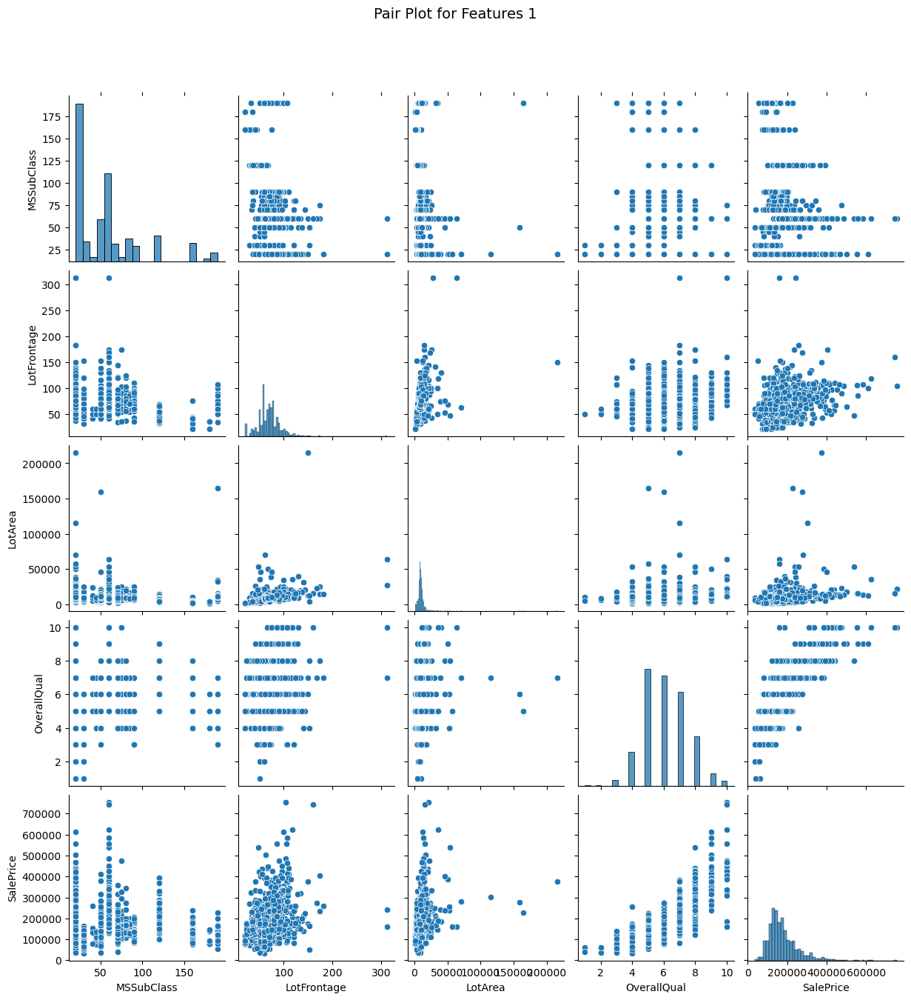

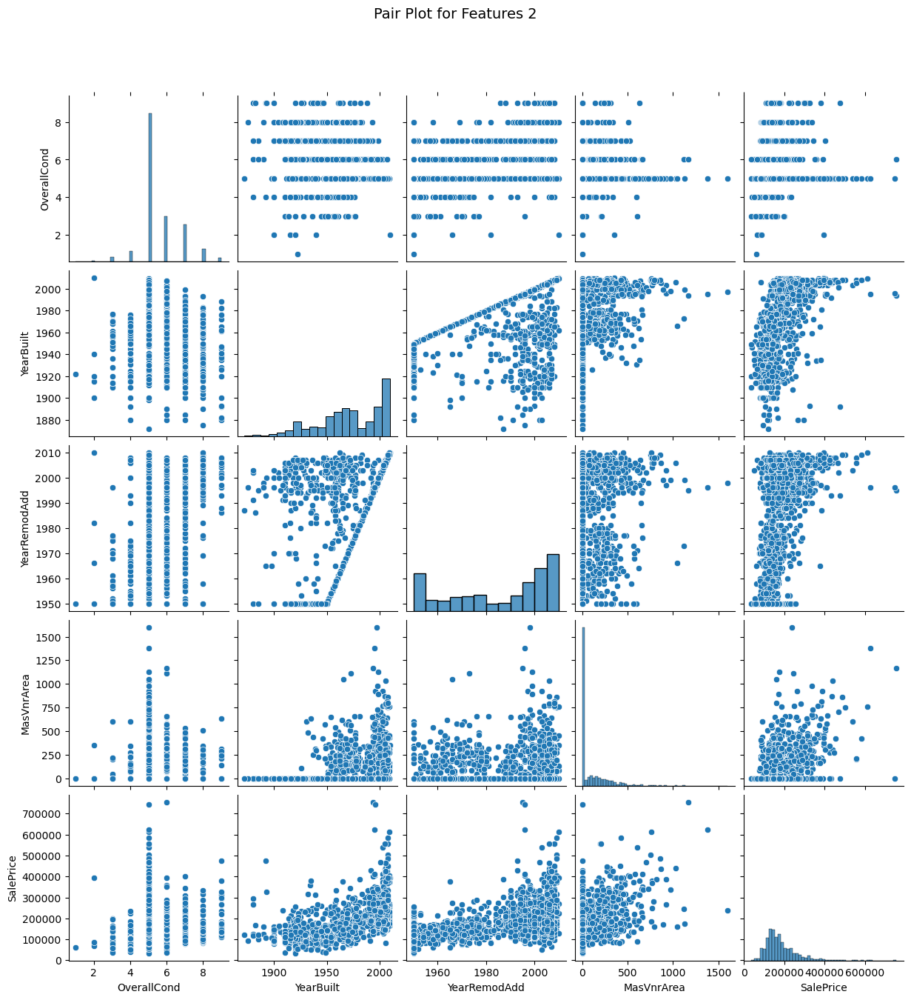

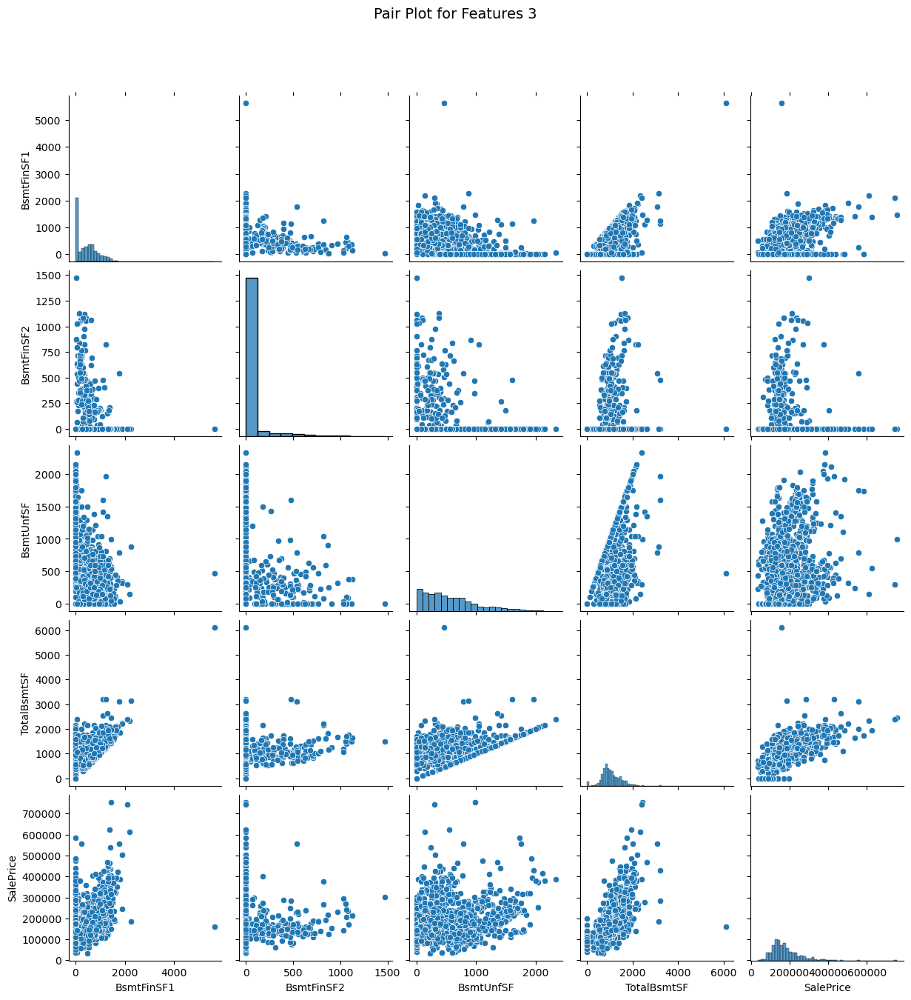

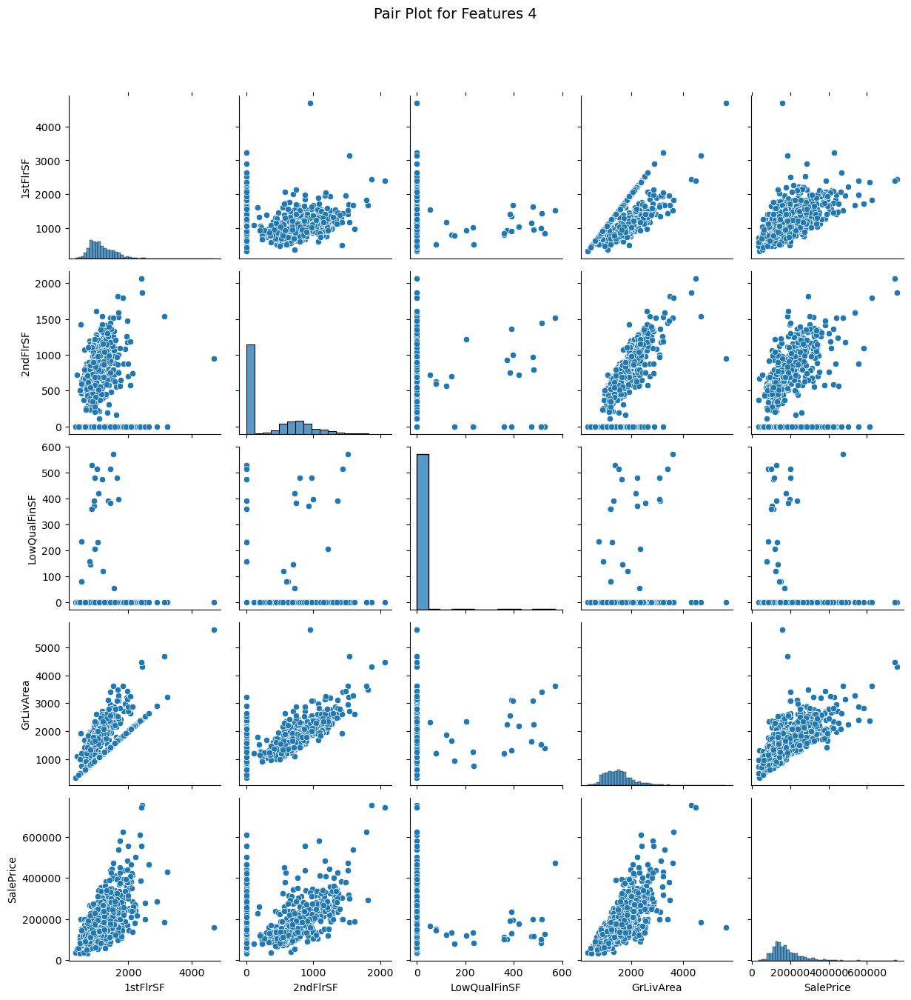

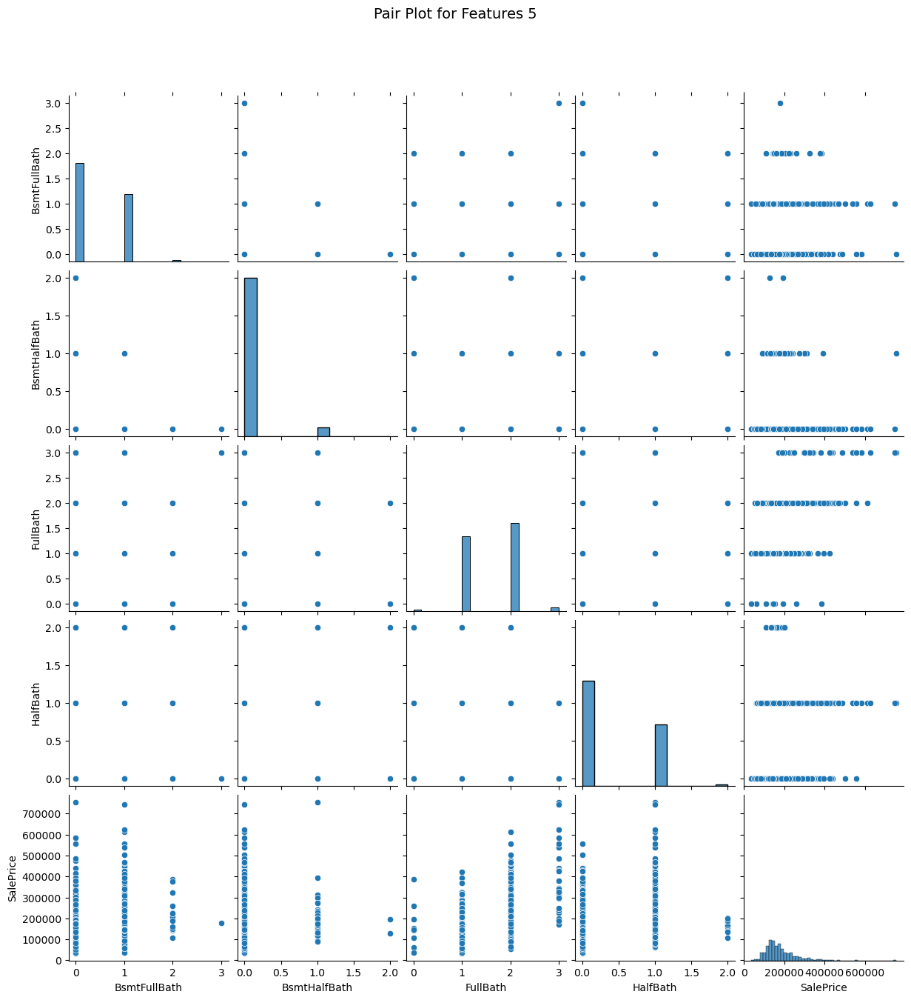

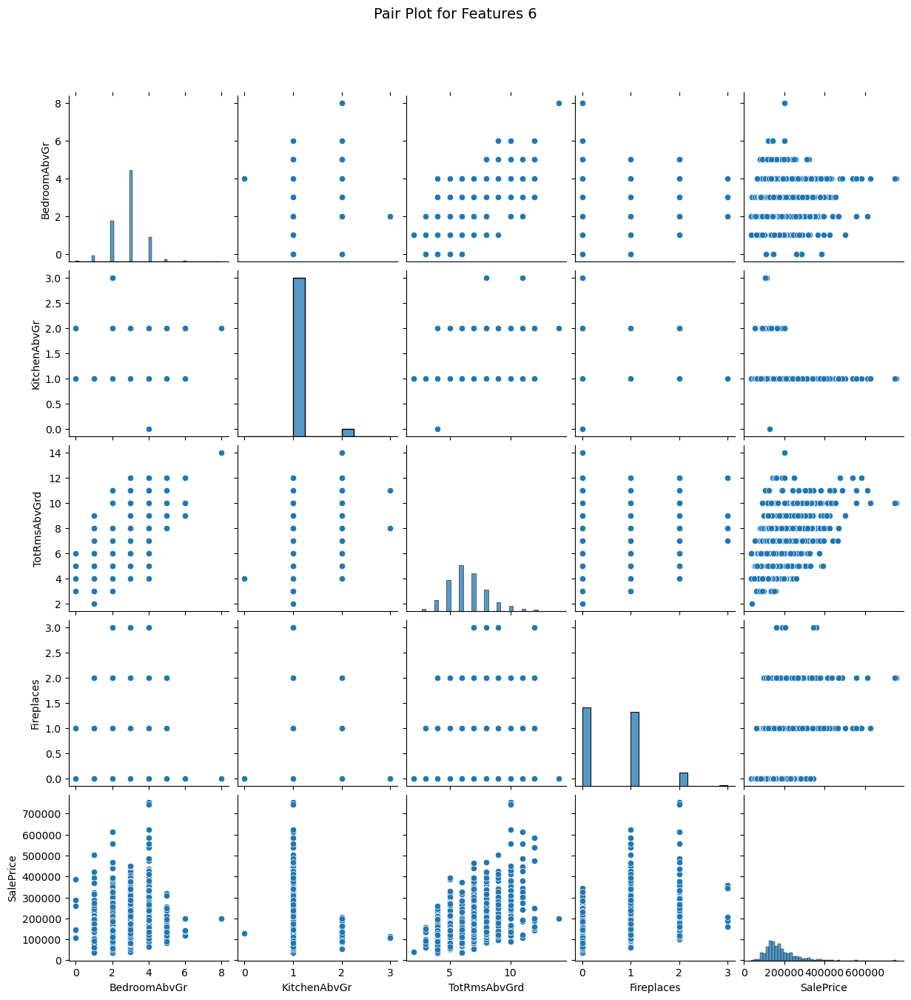

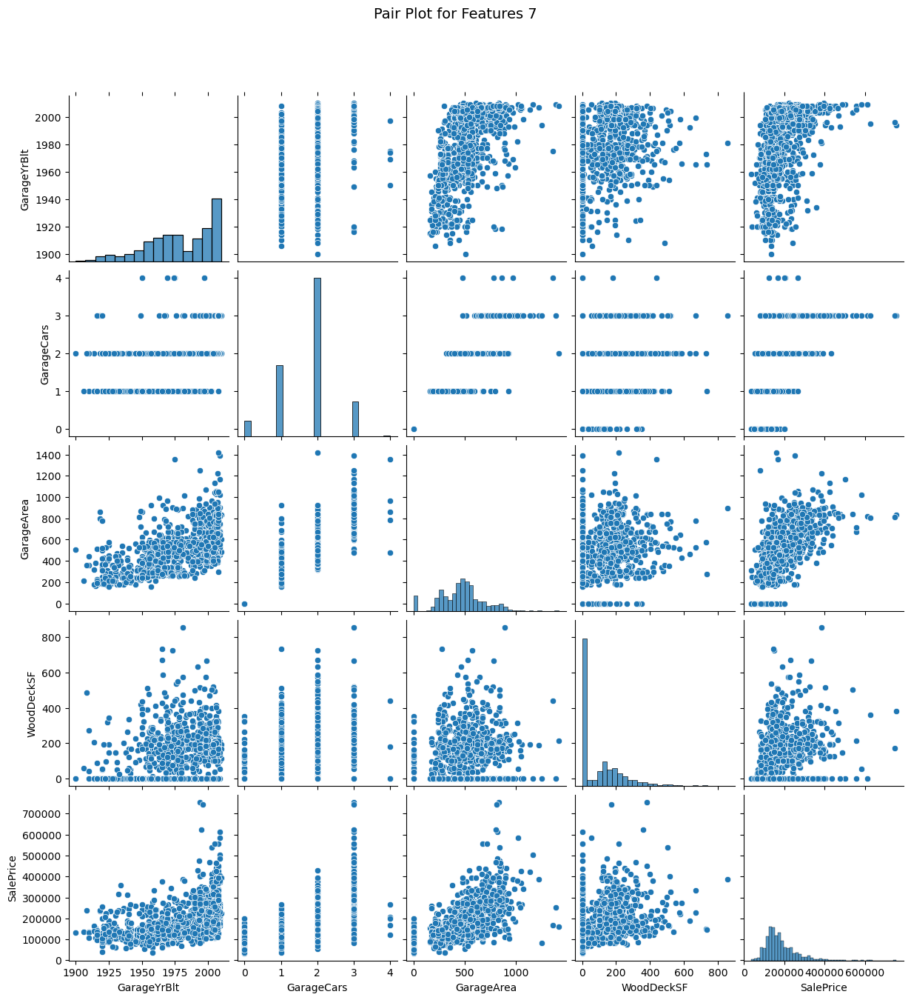

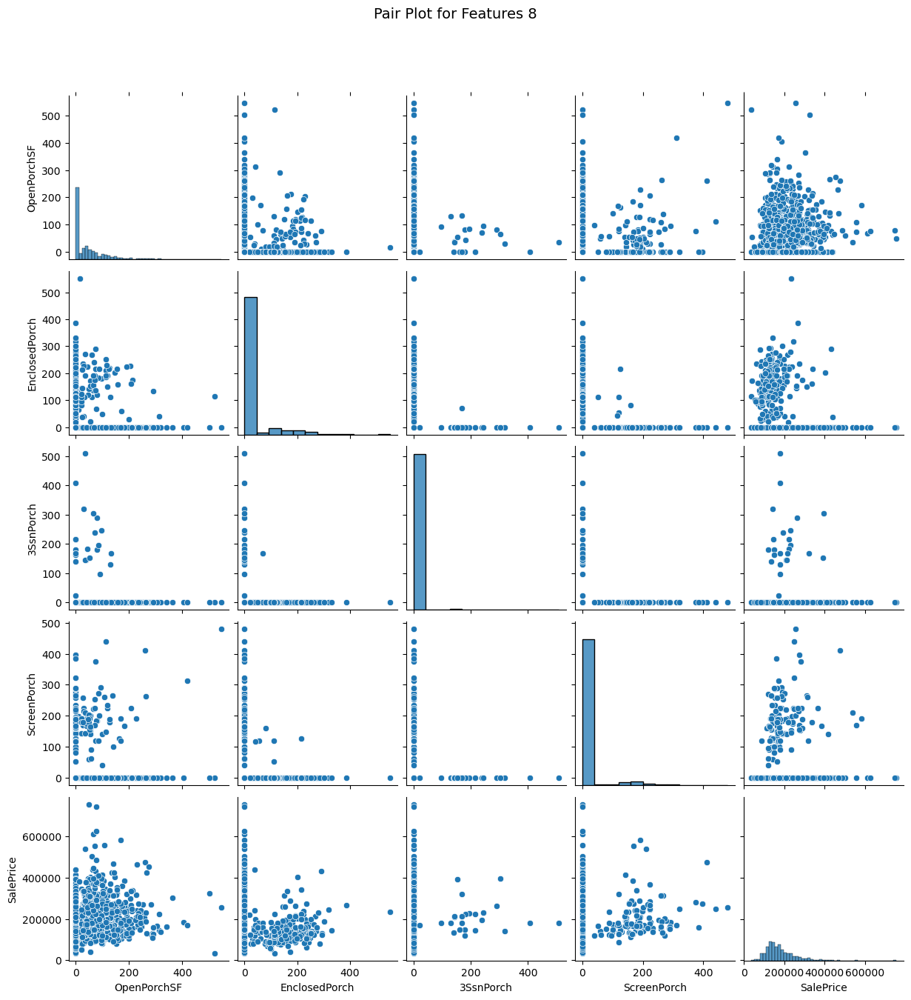

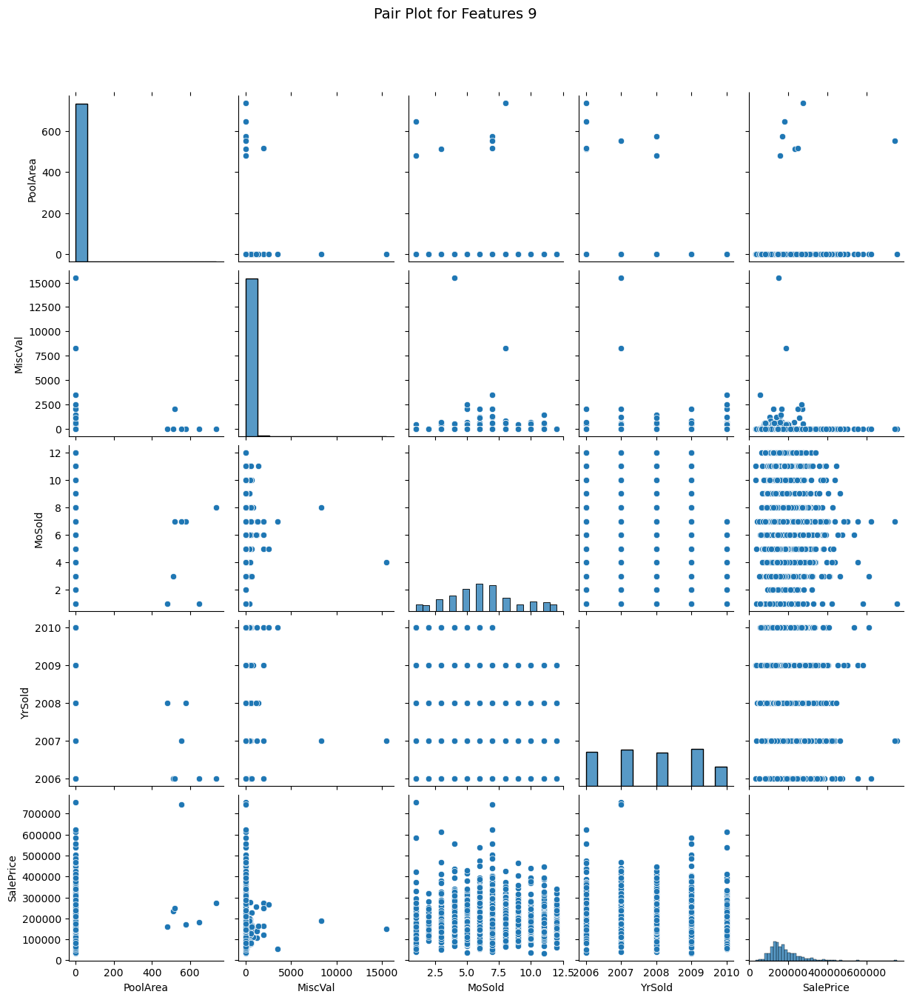

In [49]:
# Define batch size (4 features + target per plot)
batch_size = 4  
target_col = "SalePrice"
exclude_cols = ["Id"]  # Exclude ID column

# Create feature groups
features = [col for col in df_numerical.columns if col not in exclude_cols + [target_col]]
num_batches = len(features) // batch_size + (1 if len(features) % batch_size else 0)

# Plot pairplots in groups of 4 features + target
for i in range(num_batches):
    selected_features = features[i * batch_size : (i + 1) * batch_size] + [target_col]
    
    # Create pairplot
    pairplot = sns.pairplot(df_numerical[selected_features], height=2.5)

    # Move x-axis labels to the top
    for j, ax in enumerate(pairplot.axes[0]):  # First row of plots
        ax.set_xlabel(ax.get_xlabel(), fontsize=10, labelpad=10)
        ax.xaxis.set_label_coords(0.5, 1.2)  # Move label higher
        ax.xaxis.tick_top()  # Show ticks on top

    plt.suptitle(f"Pair Plot for Features {i+1}", y=1.08, fontsize=14)
    plt.show()

### ID column doesn't seem to be useful so it is Dropped

In [50]:
df_numerical = df_numerical.drop(columns=["Id"])  # Drop the column permanently
df_numerical.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold,SalePrice
0,60,65.0,8450,7,5,2003,2003,196.0,706,0,...,0,61,0,0,0,0,0,2,2008,208500
1,20,80.0,9600,6,8,1976,1976,0.0,978,0,...,298,0,0,0,0,0,0,5,2007,181500
2,60,68.0,11250,7,5,2001,2002,162.0,486,0,...,0,42,0,0,0,0,0,9,2008,223500
3,70,60.0,9550,7,5,1915,1970,0.0,216,0,...,0,35,272,0,0,0,0,2,2006,140000
4,60,84.0,14260,8,5,2000,2000,350.0,655,0,...,192,84,0,0,0,0,0,12,2008,250000


In [51]:
df_numerical.shape

(1460, 37)

## Plotting Scatter Plot

<Figure size 1200x500 with 0 Axes>

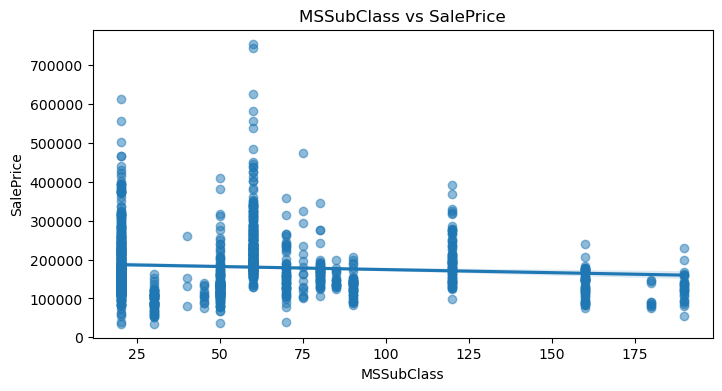

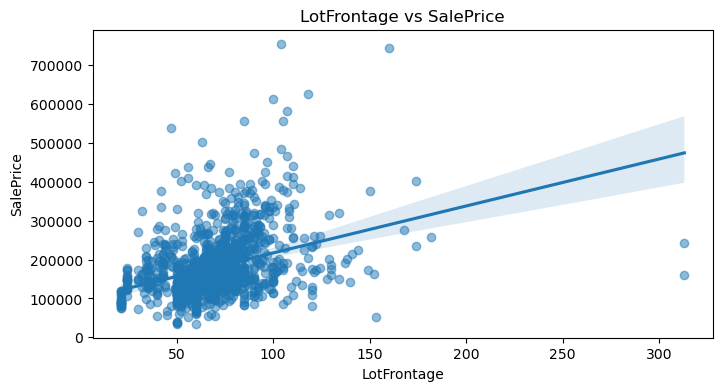

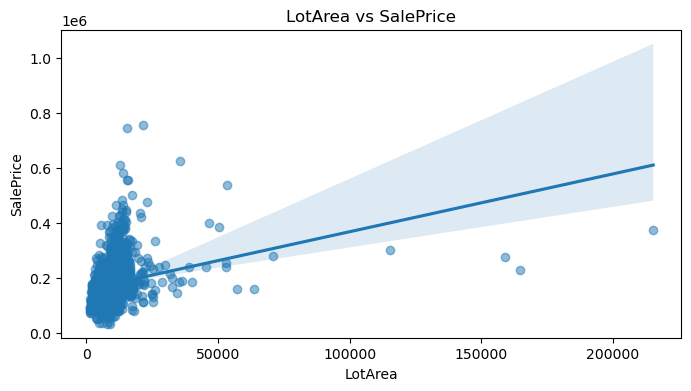

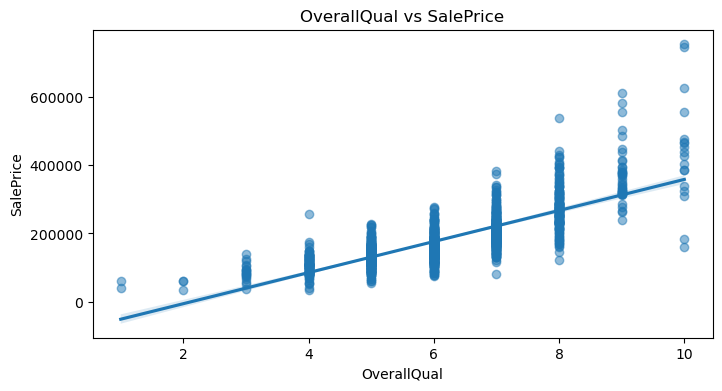

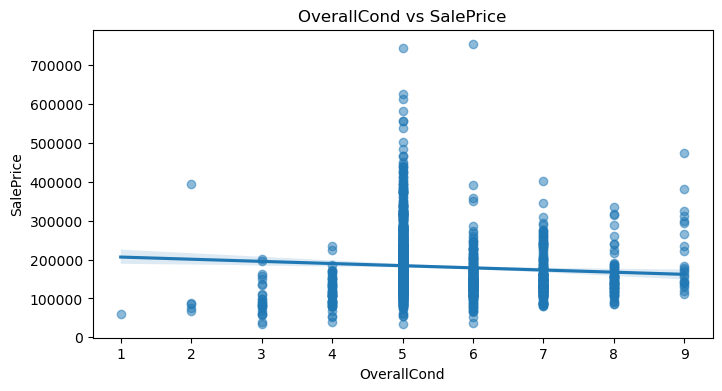

...

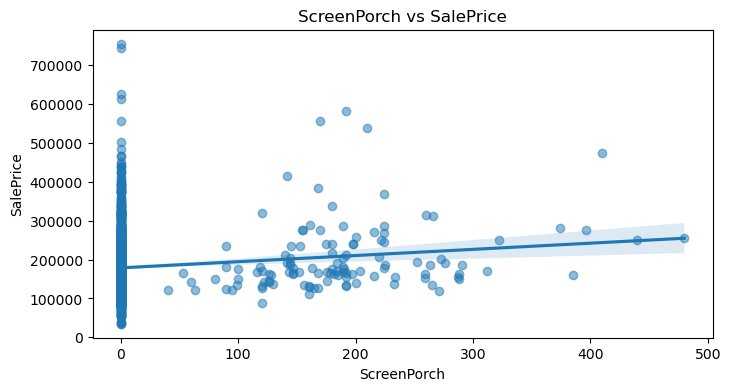

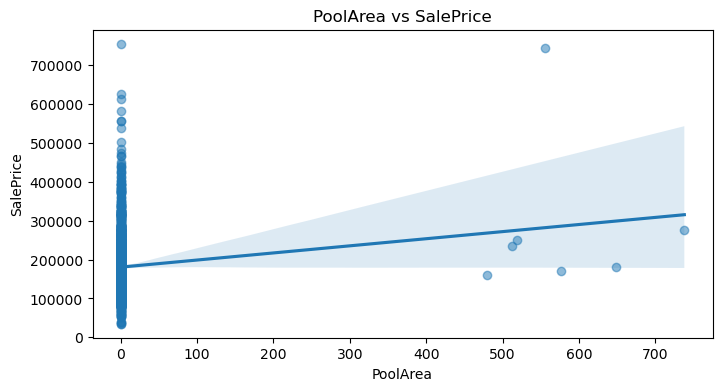

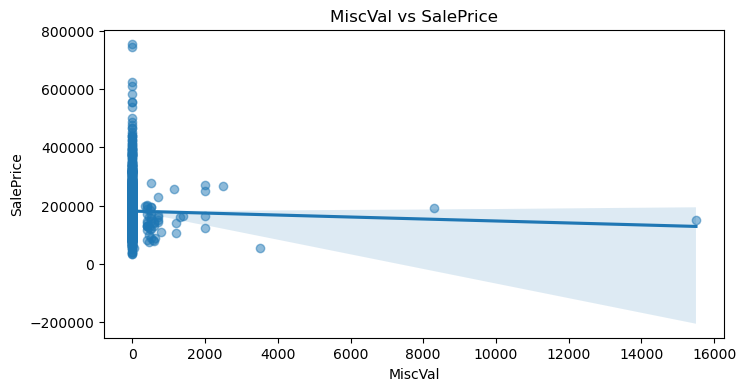

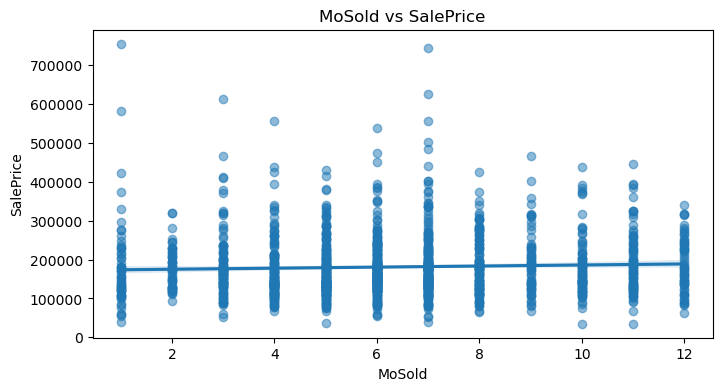

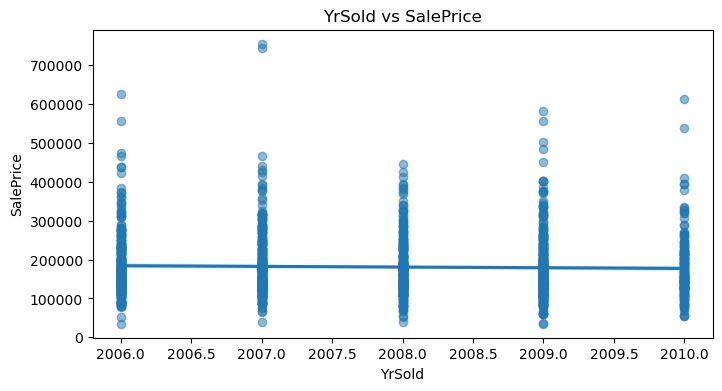

In [52]:
target_col = "SalePrice"
features = list(df_numerical.columns)
features.remove(target_col)  # Remove target from feature list

# Plot scatter plots with regression line
plt.figure(figsize=(12, 5))

for feature in features:
    plt.figure(figsize=(8, 4))
    sns.regplot(x = df_numerical[feature], y = df_numerical[target_col], scatter_kws={'alpha': 0.5})
    plt.xlabel(feature)
    plt.ylabel(target_col)
    plt.title(f"{feature} vs {target_col}")
    plt.show()

## Plotting Distribution of Target Variable

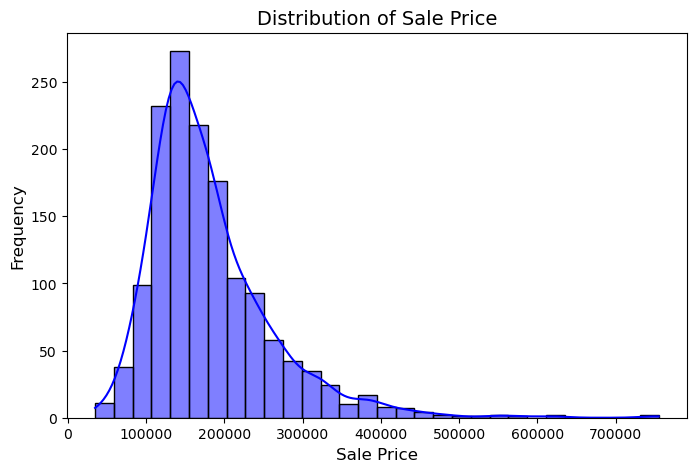

In [53]:
# Set plot size
plt.figure(figsize=(8, 5))

# Plot distribution
sns.histplot(df_numerical["SalePrice"], bins=30, kde=True, color="blue")

# Labels and title
plt.xlabel("Sale Price", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of Sale Price", fontsize=14)

# Show plot
plt.show()

### The Distribution of the Target Variable is Right-Skewed according to the Plot

### Moreover, there are No Negative values which shows that all values are Genuine since Price can't be Negative

## Plotting a Heat Map

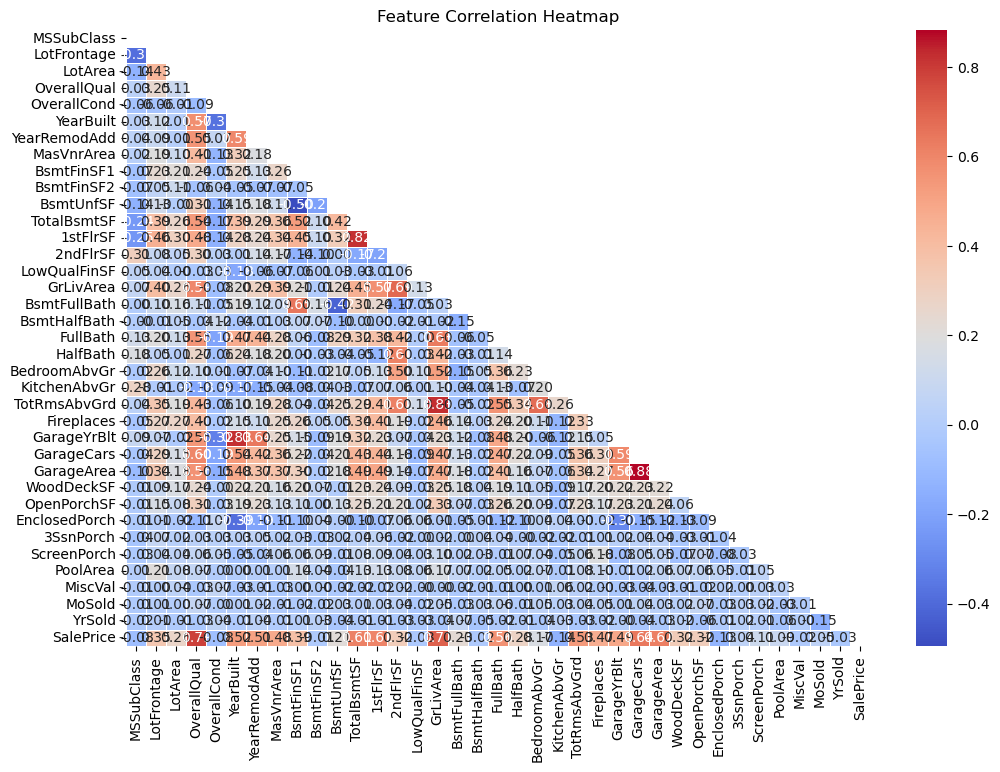

In [54]:
plt.figure(figsize=(12, 8))

# Create a mask to hide the upper triangle
mask = np.triu(np.ones_like(df_numerical.corr(), dtype=bool))

# Plot heatmap
sns.heatmap(df_numerical.corr(), cmap="coolwarm", annot=True, fmt=".2f", linewidths=0.5, mask=mask)

plt.title("Feature Correlation Heatmap")
plt.show()

#### Its too Congested to Analyse Anything

#### We will Analyse the Individual Correlation Value instead

## Correlation value with Target Variable

In [55]:
correlation_matrix = df_numerical.corr()
target_corr = correlation_matrix["SalePrice"].sort_values(ascending=False)  # Sort by highest correlation

print(target_corr)

SalePrice        1.000000
OverallQual      0.790982
GrLivArea        0.708624
GarageCars       0.640409
GarageArea       0.623431
TotalBsmtSF      0.613581
1stFlrSF         0.605852
FullBath         0.560664
TotRmsAbvGrd     0.533723
YearBuilt        0.522897
YearRemodAdd     0.507101
GarageYrBlt      0.486362
MasVnrArea       0.477493
Fireplaces       0.466929
BsmtFinSF1       0.386420
LotFrontage      0.351799
WoodDeckSF       0.324413
2ndFlrSF         0.319334
OpenPorchSF      0.315856
HalfBath         0.284108
LotArea          0.263843
BsmtFullBath     0.227122
BsmtUnfSF        0.214479
BedroomAbvGr     0.168213
ScreenPorch      0.111447
PoolArea         0.092404
MoSold           0.046432
3SsnPorch        0.044584
BsmtFinSF2      -0.011378
BsmtHalfBath    -0.016844
MiscVal         -0.021190
LowQualFinSF    -0.025606
YrSold          -0.028923
OverallCond     -0.077856
MSSubClass      -0.084284
EnclosedPorch   -0.128578
KitchenAbvGr    -0.135907
Name: SalePrice, dtype: float64


### Identifying Features with High Correlation value

In [56]:
high_corr_features = correlation_matrix[(correlation_matrix["SalePrice"] >= 0.5) | (correlation_matrix["SalePrice"] <= -0.5)]["SalePrice"]
print(f"Total = {len(high_corr_features)-1}\n")
print(high_corr_features)

Total = 10

OverallQual     0.790982
YearBuilt       0.522897
YearRemodAdd    0.507101
TotalBsmtSF     0.613581
1stFlrSF        0.605852
GrLivArea       0.708624
FullBath        0.560664
TotRmsAbvGrd    0.533723
GarageCars      0.640409
GarageArea      0.623431
SalePrice       1.000000
Name: SalePrice, dtype: float64


#### Our Previous Experience has shown us that Correlation alone doesn't Reflect the Predictive Power of a Feature

#### Some Features might not be Strong Stand Alone Features but still Contribute to the Model when combined with other Features 

#### This is because ML Models capture Interactions between variables that simple Correlation Analysis might miss

### Identifying Highly Correlated (Redundant) Features

In [57]:
# Set threshold for strong correlation
threshold = 0.8  

# Find pairs of highly correlated features
high_corr_pairs = []
for i in range(len(correlation_matrix.columns)):
    for j in range(i):  # Avoid duplicates by iterating over lower triangle only
        if abs(correlation_matrix.iloc[i, j]) > threshold:
            high_corr_pairs.append((correlation_matrix.columns[i], correlation_matrix.columns[j], correlation_matrix.iloc[i, j]))

# Print highly correlated feature pairs
for feat1, feat2, corr in high_corr_pairs:
    print(f"{feat1} - {feat2}: Correlation = {corr:.2f}")

1stFlrSF - TotalBsmtSF: Correlation = 0.82
TotRmsAbvGrd - GrLivArea: Correlation = 0.83
GarageYrBlt - YearBuilt: Correlation = 0.83
GarageArea - GarageCars: Correlation = 0.88


In [58]:
# Choosing the Feature with a Higher Correlation Value from Each Pair
selected_features = []

for feature1, feature2, value in high_corr_pairs:
    corr1 = target_corr[feature1]  # Correlation of feature1 with target
    corr2 = target_corr[feature2]  # Correlation of feature2 with target
    
    # Keep the feature with higher correlation with the target
    if abs(corr1) >= abs(corr2):
        selected_features.append(feature1)
    else:
        selected_features.append(feature2)

print("Selected Features to Retain:", selected_features)

Selected Features to Retain: ['TotalBsmtSF', 'GrLivArea', 'YearBuilt', 'GarageCars']


#### We will think about Dropping Redundant Features Later

## Handling Null Values

In [59]:
# Check for missing values
missing_values = df_numerical.isnull().sum()

# Display only columns with missing values
missing_values = missing_values[missing_values > 0]

print(f"Total Features = {len(missing_values)}\n")
print(missing_values)

Total Features = 3

LotFrontage    259
MasVnrArea       8
GarageYrBlt     81
dtype: int64


In [60]:
df[["LotFrontage", "MasVnrArea", "GarageYrBlt"]]

,LotFrontage,MasVnrArea,GarageYrBlt
0,65.0,196.0,2003.0
1,80.0,0.0,1976.0
2,68.0,162.0,2001.0
3,60.0,0.0,1998.0
4,84.0,350.0,2000.0
...,...,...,...
1455,62.0,0.0,1999.0
1456,85.0,119.0,1978.0
1457,66.0,0.0,1941.0
1458,68.0,0.0,1950.0


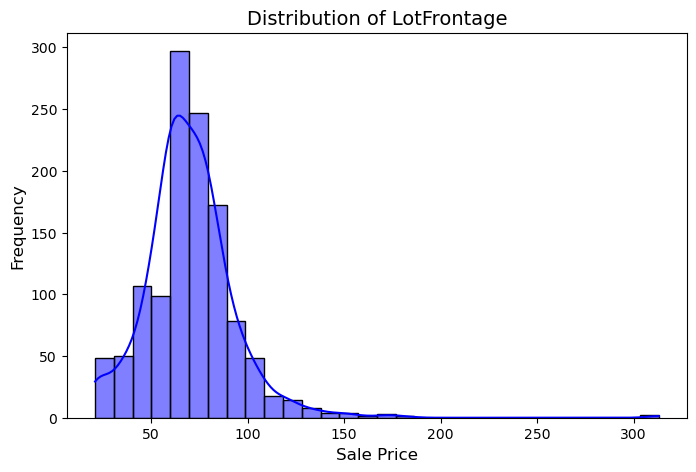

In [61]:
# Set plot size
plt.figure(figsize=(8, 5))

# Plot distribution
sns.histplot(df_numerical["LotFrontage"], bins=30, kde=True, color="blue")

# Labels and title
plt.xlabel("Sale Price", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of LotFrontage", fontsize=14)

# Show plot
plt.show()

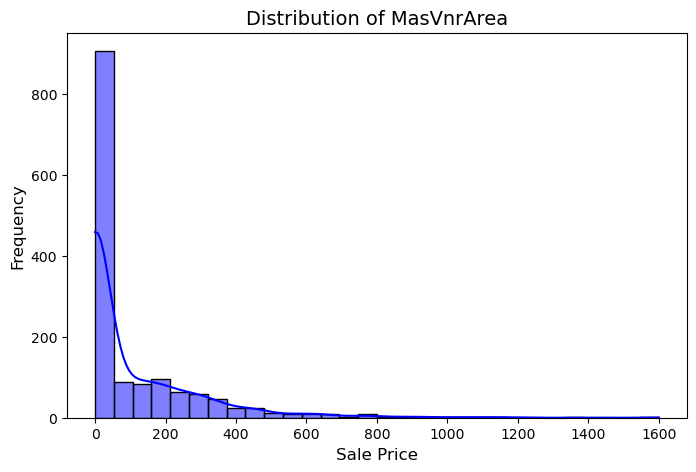

In [62]:
# Set plot size
plt.figure(figsize=(8, 5))

# Plot distribution
sns.histplot(df_numerical["MasVnrArea"], bins=30, kde=True, color="blue")

# Labels and title
plt.xlabel("Sale Price", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of MasVnrArea", fontsize=14)

# Show plot
plt.show()

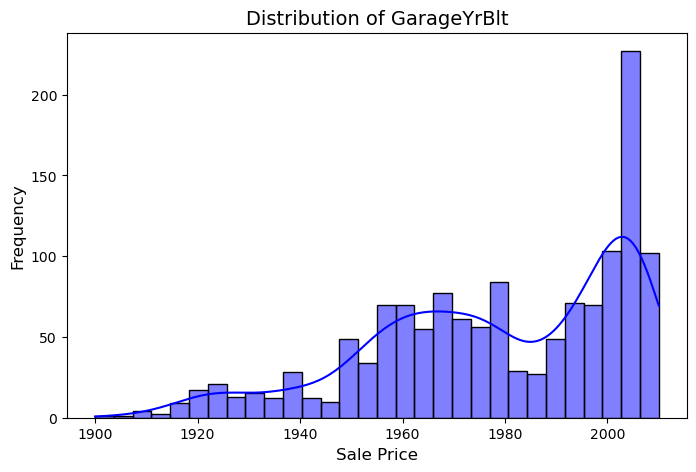

In [63]:
# Set plot size
plt.figure(figsize=(8, 5))

# Plot distribution
sns.histplot(df_numerical["GarageYrBlt"], bins=30, kde=True, color="blue")

# Labels and title
plt.xlabel("Sale Price", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of GarageYrBlt", fontsize=14)

# Show plot
plt.show()

### Based on the Plots and the Type of Values each Feature has, it is decided to Impute the Missing values with Median, 0 and Mode respectively
### This is done to preserve the Original Distribution of the Features

In [64]:
df_numerical["LotFrontage"] = df_numerical["LotFrontage"].fillna(df_numerical["LotFrontage"].median())
df_numerical["MasVnrArea"] = df_numerical["MasVnrArea"].fillna(0)
df_numerical["GarageYrBlt"] = df_numerical["GarageYrBlt"].fillna(df_numerical["GarageYrBlt"].mode()[0])

In [65]:
# Check for missing values
missing_values = df_numerical.isnull().sum()

# Display only columns with missing values
missing_values = missing_values[missing_values > 0]

print(f"Total Features = {len(missing_values)}\n")
print(missing_values)

Total Features = 0

Series([], dtype: int64)


#### Checking Distribution Again

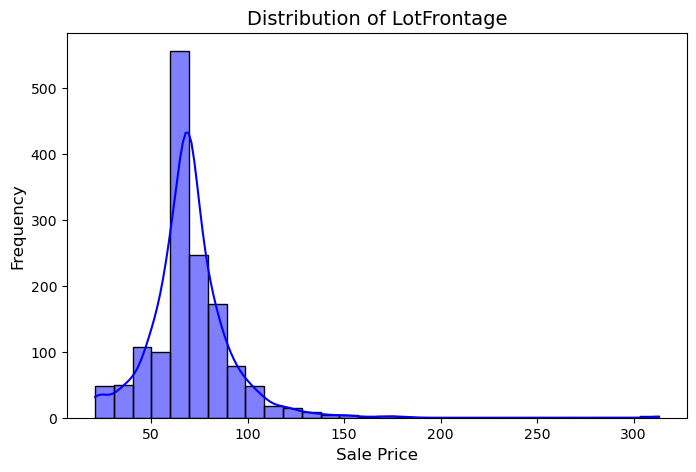

In [66]:
# Set plot size
plt.figure(figsize=(8, 5))

# Plot distribution
sns.histplot(df_numerical["LotFrontage"], bins=30, kde=True, color="blue")

# Labels and title
plt.xlabel("Sale Price", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of LotFrontage", fontsize=14)

# Show plot
plt.show()

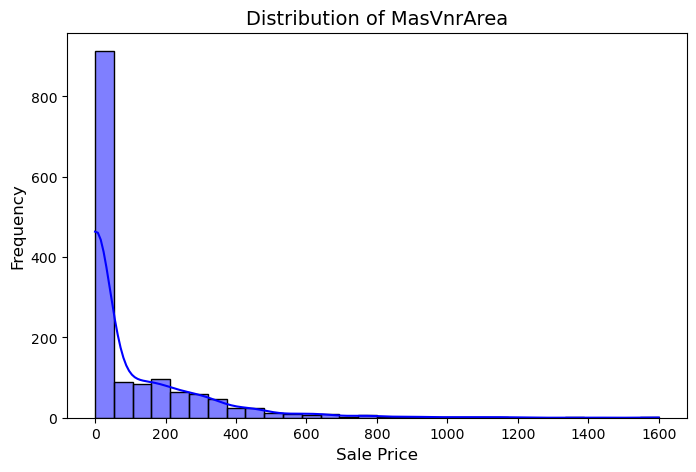

In [67]:
# Set plot size
plt.figure(figsize=(8, 5))

# Plot distribution
sns.histplot(df_numerical["MasVnrArea"], bins=30, kde=True, color="blue")

# Labels and title
plt.xlabel("Sale Price", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of MasVnrArea", fontsize=14)

# Show plot
plt.show()

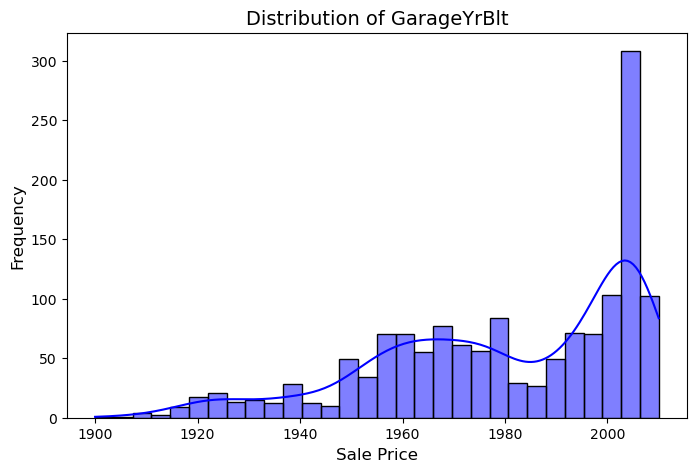

In [68]:
# Set plot size
plt.figure(figsize=(8, 5))

# Plot distribution
sns.histplot(df_numerical["GarageYrBlt"], bins=30, kde=True, color="blue")

# Labels and title
plt.xlabel("Sale Price", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of GarageYrBlt", fontsize=14)

# Show plot
plt.show()

## Plotting Box Plot

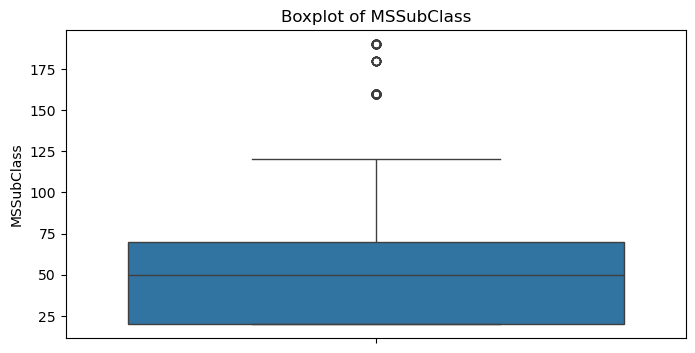

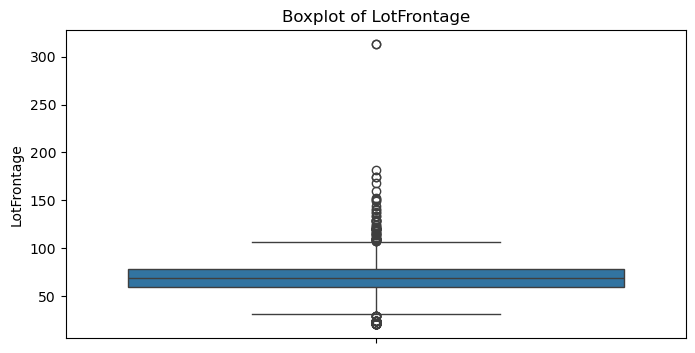

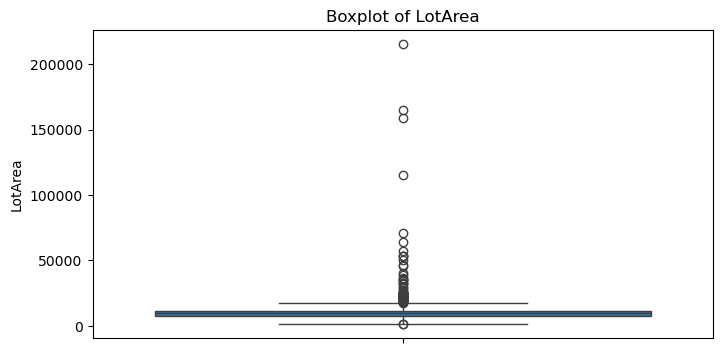

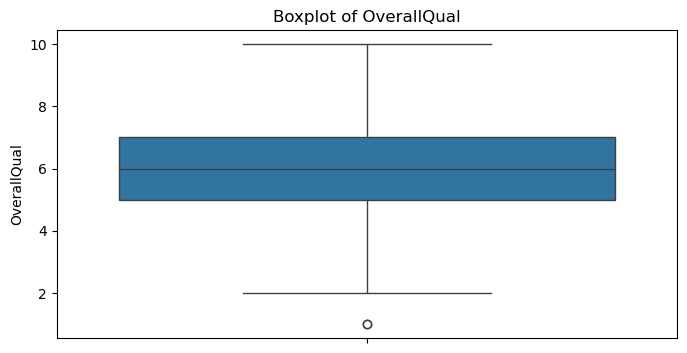

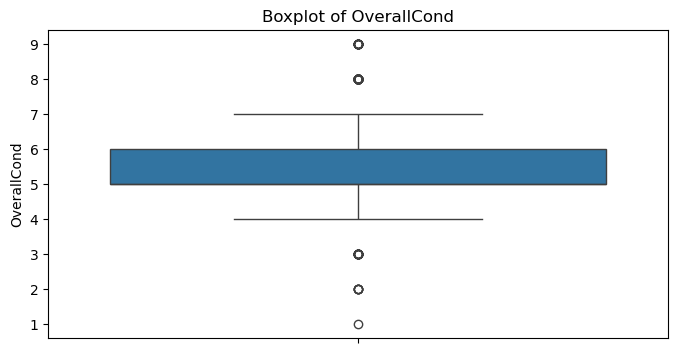

...

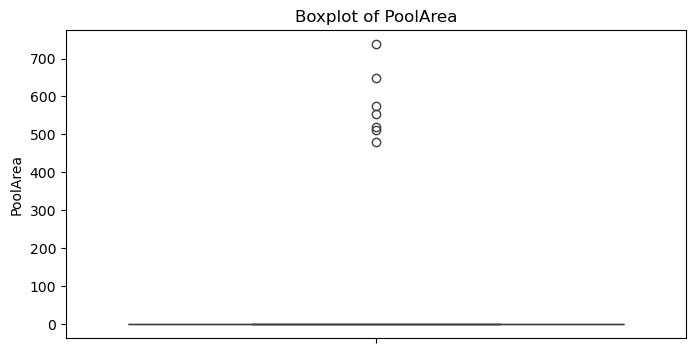

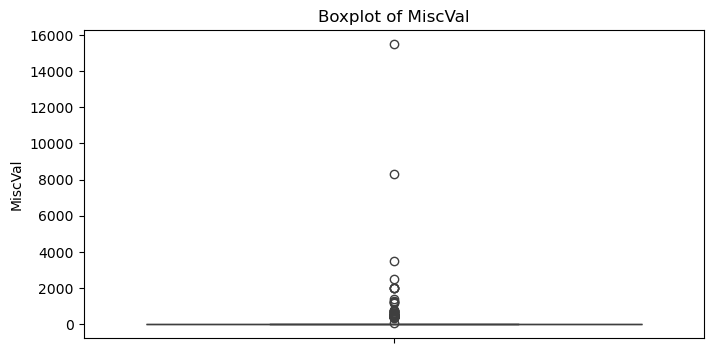

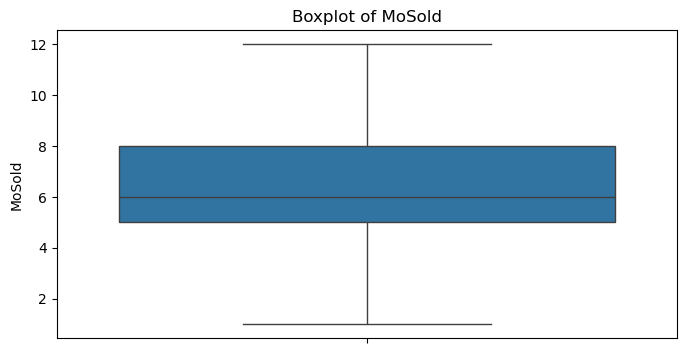

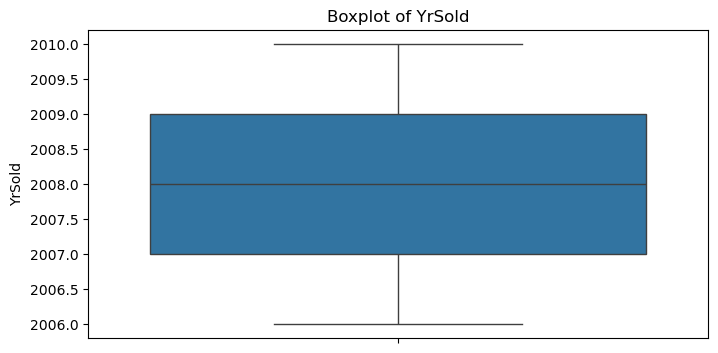

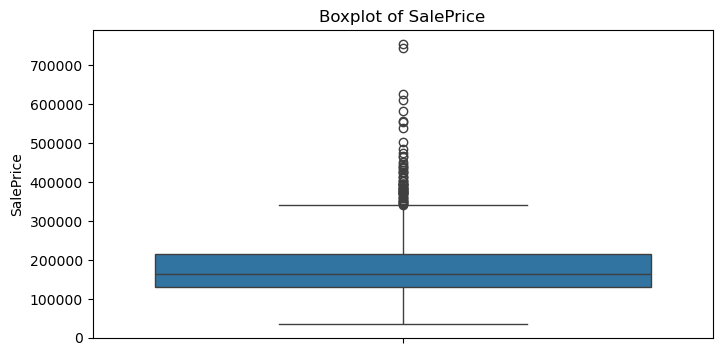

In [69]:
for col in df_numerical.columns:
    plt.figure(figsize=(8, 4))
    sns.boxplot(y=df_numerical[col])  # Use 'y' instead of 'x' for vertical boxplot
    plt.title(f'Boxplot of {col}')
    plt.show()

## Outlier Removal

### IQR method is chosen for Outlier Removal, since most of the Features have Skeweness in the Distribution

### Approach 1 -> Performing Row-wise Outlier Removal

In [70]:
# Set target variable name
target_col = "SalePrice"

# Create a copy to avoid modifying original
df_iqr_filtered = df_numerical.copy()

# Loop through all features except target
for col in df_numerical.columns:
    if col == target_col:
        continue  # Skip target variable

    Q1 = df_iqr_filtered[col].quantile(0.25)
    Q3 = df_iqr_filtered[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 2 * IQR
    upper_bound = Q3 + 2 * IQR

    # Filter rows within the IQR range
    df_iqr_filtered = df_iqr_filtered[(df_iqr_filtered[col] >= lower_bound) & (df_iqr_filtered[col] <= upper_bound)]

# Resulting DataFrame
print(f"Original shape: {df_numerical.shape}")
print(f"After IQR outlier removal: {df_iqr_filtered.shape}")

Original shape: (1460, 37)
After IQR outlier removal: (711, 37)


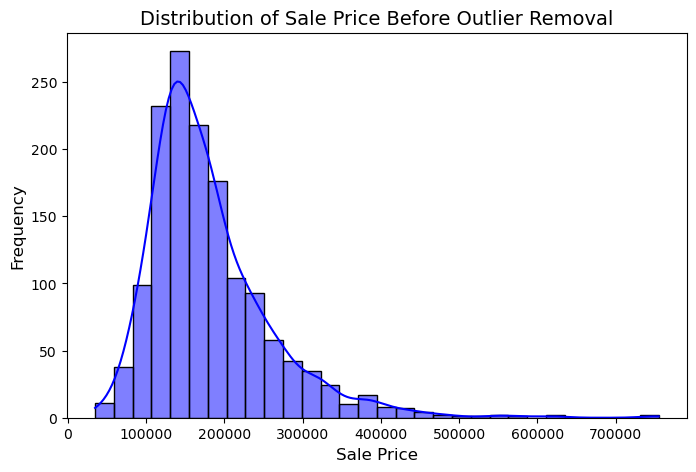

In [71]:
# Set plot size
plt.figure(figsize=(8, 5))

# Plot distribution
sns.histplot(df_numerical["SalePrice"], bins=30, kde=True, color="blue")

# Labels and title
plt.xlabel("Sale Price", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of Sale Price Before Outlier Removal", fontsize=14)

# Show plot
plt.show()

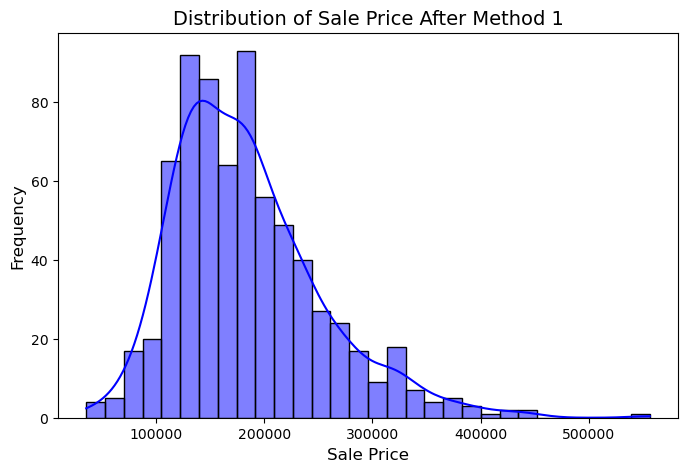

In [72]:
# Set plot size
plt.figure(figsize=(8, 5))

# Plot distribution
sns.histplot(df_iqr_filtered["SalePrice"], bins=30, kde=True, color="blue")

# Labels and title
plt.xlabel("Sale Price", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of Sale Price After Method 1", fontsize=14)

# Show plot
plt.show()

#### We have Previous Experience with working on a Challenge Related to Train Delays where the Tarfet Variable had the same Right-Skewed Distribution and we performed a Normal Outlier Removal with IQR Threshold of 2
#### But, we witnessed a Massive Spike in the value of MSE on the Test and at that point we realised that sometimes Outliers might be Actual Values or representation of the Test Set
#### Therefore, this time we will not be Performing the same type of Outlier Removal for this Dataset

### Approach 2 -> Performing Feature-Wise Outlier Removal

In [73]:
# Copy to avoid touching original data
df_outliers_handled = df_numerical.copy()

# Set target variable
target_col = "SalePrice"

for col in df_outliers_handled.columns:
    if col == target_col:
        continue

    Q1 = df_outliers_handled[col].quantile(0.25)
    Q3 = df_outliers_handled[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 2 * IQR
    upper_bound = Q3 + 2 * IQR

    # Replace outliers with NaN instead of dropping rows
    df_outliers_handled[col] = df_outliers_handled[col].where(
        (df_outliers_handled[col] >= lower_bound) & (df_outliers_handled[col] <= upper_bound),
        np.nan
    )

# Resulting DataFrame
print(f"Original shape: {df_numerical.shape}")
print(f"After IQR outlier removal: {df_outliers_handled.shape} \n")

# Check how many missing values were introduced
print(df_outliers_handled.isna().sum().sort_values(ascending=False))

Original shape: (1460, 37)
After IQR outlier removal: (1460, 37) 

EnclosedPorch    208
BsmtFinSF2       167
ScreenPorch      116
BsmtHalfBath      82
KitchenAbvGr      68
LotFrontage       62
MasVnrArea        58
LotArea           54
OpenPorchSF       52
MiscVal           52
MSSubClass        40
OverallCond       28
LowQualFinSF      26
3SsnPorch         24
GrLivArea         18
WoodDeckSF        15
TotRmsAbvGrd      12
TotalBsmtSF       11
1stFlrSF           9
GarageArea         8
BedroomAbvGr       8
PoolArea           7
BsmtUnfSF          6
BsmtFinSF1         3
MoSold             0
YrSold             0
FullBath           0
GarageCars         0
GarageYrBlt        0
Fireplaces         0
HalfBath           0
BsmtFullBath       0
2ndFlrSF           0
YearRemodAdd       0
YearBuilt          0
OverallQual        0
SalePrice          0
dtype: int64


In [74]:
df_numerical[["MSSubClass", "LotFrontage", "LotArea", "OverallCond", "MasVnrArea", "BsmtFinSF1", "BsmtFinSF2", "BsmtUnfSF", "TotalBsmtSF", "1stFlrSF", "LowQualFinSF", "GrLivArea", "BsmtHalfBath"]]

,MSSubClass,LotFrontage,LotArea,OverallCond,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,1stFlrSF,LowQualFinSF,GrLivArea,BsmtHalfBath
0,60,65.0,8450,5,196.0,706,0,150,856,856,0,1710,0
1,20,80.0,9600,8,0.0,978,0,284,1262,1262,0,1262,1
2,60,68.0,11250,5,162.0,486,0,434,920,920,0,1786,0
3,70,60.0,9550,5,0.0,216,0,540,756,961,0,1717,0
4,60,84.0,14260,5,350.0,655,0,490,1145,1145,0,2198,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
1455,60,62.0,7917,5,0.0,0,0,953,953,953,0,1647,0
1456,20,85.0,13175,6,119.0,790,163,589,1542,2073,0,2073,0
1457,70,66.0,9042,9,0.0,275,0,877,1152,1188,0,2340,0
1458,20,68.0,9717,6,0.0,49,1029,0,1078,1078,0,1078,0


In [75]:
df_numerical[["BedroomAbvGr", "KitchenAbvGr", "TotRmsAbvGrd", "GarageArea", "WoodDeckSF", "OpenPorchSF", "EnclosedPorch", "3SsnPorch", "ScreenPorch", "PoolArea", "MiscVal"]]

,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal
0,3,1,8,548,0,61,0,0,0,0,0
1,3,1,6,460,298,0,0,0,0,0,0
2,3,1,6,608,0,42,0,0,0,0,0
3,3,1,7,642,0,35,272,0,0,0,0
4,4,1,9,836,192,84,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...
1455,3,1,7,460,0,40,0,0,0,0,0
1456,3,1,7,500,349,0,0,0,0,0,0
1457,4,1,9,252,0,60,0,0,0,0,2500
1458,2,1,5,240,366,0,112,0,0,0,0


#### There are Null Values in some Features
#### Specific Strategy has been taken to Impute those Null Values after observing there Original Values in the Dataset

In [76]:
# Impute using median for skewed or continuous columns
median_cols = ["LotFrontage", "LotArea", "MasVnrArea", "BsmtFinSF1", "BsmtFinSF2", 
               "BsmtUnfSF", "TotalBsmtSF", "1stFlrSF", "GrLivArea",
               "GarageArea", "WoodDeckSF", "OpenPorchSF", "EnclosedPorch"]

df_outliers_handled[median_cols] = df_outliers_handled[median_cols].fillna(df_outliers_handled[median_cols].median())

# Impute using mode for discrete features
mode_cols = ["MSSubClass", "OverallCond", "BedroomAbvGr", "KitchenAbvGr", "TotRmsAbvGrd"]

df_outliers_handled[mode_cols] = df_outliers_handled[mode_cols].fillna(df_outliers_handled[mode_cols].mode().iloc[0])

# Impute using 0 for features where 0 means "None"/no feature
zero_cols = ["LowQualFinSF", "BsmtHalfBath", "3SsnPorch", "ScreenPorch", "PoolArea", "MiscVal"]

df_outliers_handled[zero_cols] = df_outliers_handled[zero_cols].fillna(0)

In [77]:
# Resulting DataFrame
print(f"Original shape: {df_numerical.shape}")
print(f"After IQR outlier removal: {df_outliers_handled.shape} \n")

# Check how many missing values were introduced
print(df_outliers_handled.isna().sum().sort_values(ascending=False))

Original shape: (1460, 37)
After IQR outlier removal: (1460, 37) 

MSSubClass       0
HalfBath         0
KitchenAbvGr     0
TotRmsAbvGrd     0
Fireplaces       0
GarageYrBlt      0
GarageCars       0
GarageArea       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
MiscVal          0
MoSold           0
YrSold           0
BedroomAbvGr     0
FullBath         0
LotFrontage      0
BsmtHalfBath     0
LotArea          0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
MasVnrArea       0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
SalePrice        0
dtype: int64


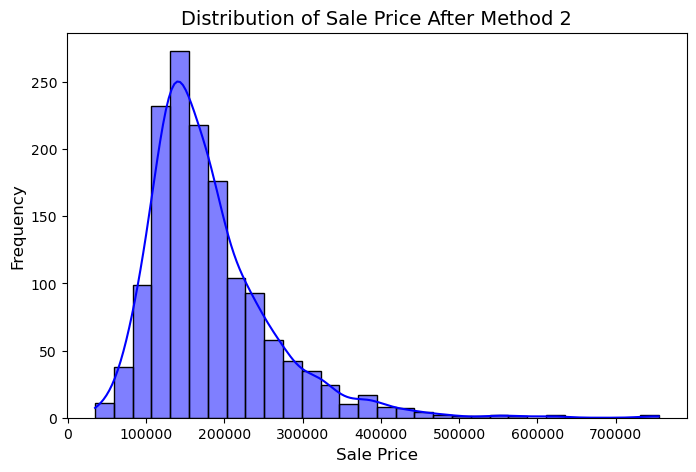

In [78]:
# Set plot size
plt.figure(figsize=(8, 5))

# Plot distribution
sns.histplot(df_outliers_handled["SalePrice"], bins=30, kde=True, color="blue")

# Labels and title
plt.xlabel("Sale Price", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of Sale Price After Method 2", fontsize=14)

# Show plot
plt.show()

### Approach 3 -> Performing Outlier Removal on Selected Methods

In [79]:
outlier_stats = []

for col in df_numerical.columns:
    Q1 = df_numerical[col].quantile(0.25)
    Q3 = df_numerical[col].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 2 * IQR
    upper = Q3 + 2 * IQR
    outliers = ((df_numerical[col] < lower) | (df_numerical[col] > upper)).sum()
    percentage = outliers / len(df_numerical) * 100
    outlier_stats.append({"Feature": col, "Outliers": outliers, "Percentage": percentage})

# Convert to DataFrame
outlier_df = pd.DataFrame(outlier_stats)

# Sort by percentage in descending order
outlier_df = outlier_df.sort_values(by="Percentage", ascending=False).reset_index(drop=True)

# Display result
print(outlier_df)

          Feature  Outliers  Percentage
0   EnclosedPorch       208   14.246575
1      BsmtFinSF2       167   11.438356
2     ScreenPorch       116    7.945205
3    BsmtHalfBath        82    5.616438
4    KitchenAbvGr        68    4.657534
5     LotFrontage        62    4.246575
6      MasVnrArea        58    3.972603
7         LotArea        54    3.698630
8         MiscVal        52    3.561644
9     OpenPorchSF        52    3.561644
10     MSSubClass        40    2.739726
11      SalePrice        38    2.602740
12    OverallCond        28    1.917808
13   LowQualFinSF        26    1.780822
14      3SsnPorch        24    1.643836
15      GrLivArea        18    1.232877
16     WoodDeckSF        15    1.027397
17   TotRmsAbvGrd        12    0.821918
18    TotalBsmtSF        11    0.753425
19       1stFlrSF         9    0.616438
20     GarageArea         8    0.547945
21   BedroomAbvGr         8    0.547945
22       PoolArea         7    0.479452
23      BsmtUnfSF         6    0.410959


#### We decided to set a threshold of 50 (3%) After Analysing the Histogram in Pair Plot, Box Plot and Percentage of Outliers

In [80]:
# Copy to avoid touching original data
df_outliers_handled = df_numerical.copy()

# Selected 10 Feature bases on above mentioned Criterion
selected_cols = ["EnclosedPorch", "BsmtFinSF2", "ScreenPorch", "BsmtHalfBath", "KitchenAbvGr", "LotFrontage", "MasVnrArea", "LotArea", "MiscVal", "OpenPorchSF"]

for col in selected_cols:
    Q1 = df_outliers_handled[col].quantile(0.25)
    Q3 = df_outliers_handled[col].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 2 * IQR
    upper_bound = Q3 + 2 * IQR

    df_outliers_handled[col] = df_outliers_handled[col].where(
        (df_outliers_handled[col] >= lower_bound) & (df_outliers_handled[col] <= upper_bound),
        np.nan
    )

# Resulting DataFrame
print(f"Original shape: {df_numerical.shape}")
print(f"After IQR outlier removal: {df_outliers_handled.shape} \n")

# Check how many missing values were introduced
print(df_outliers_handled.isna().sum().sort_values(ascending=False))

Original shape: (1460, 37)
After IQR outlier removal: (1460, 37) 

EnclosedPorch    208
BsmtFinSF2       167
ScreenPorch      116
BsmtHalfBath      82
KitchenAbvGr      68
LotFrontage       62
MasVnrArea        58
LotArea           54
MiscVal           52
OpenPorchSF       52
MSSubClass         0
GarageCars         0
Fireplaces         0
GarageYrBlt        0
3SsnPorch          0
GarageArea         0
WoodDeckSF         0
PoolArea           0
MoSold             0
YrSold             0
TotRmsAbvGrd       0
FullBath           0
BedroomAbvGr       0
HalfBath           0
BsmtFullBath       0
GrLivArea          0
LowQualFinSF       0
2ndFlrSF           0
1stFlrSF           0
TotalBsmtSF        0
BsmtUnfSF          0
BsmtFinSF1         0
YearRemodAdd       0
YearBuilt          0
OverallCond        0
OverallQual        0
SalePrice          0
dtype: int64


#### Imputing Null Values Based on the Same Logic used in Approach 2

In [81]:
# Impute using median for skewed or continuous columns
median_cols = ["LotFrontage", "LotArea", "MasVnrArea", 
               "BsmtFinSF2", "OpenPorchSF", "EnclosedPorch"]

df_outliers_handled[median_cols] = df_outliers_handled[median_cols].fillna(df_outliers_handled[median_cols].median())

# Impute using mode for discrete features
mode_cols = ["KitchenAbvGr"]

df_outliers_handled[mode_cols] = df_outliers_handled[mode_cols].fillna(df_outliers_handled[mode_cols].mode().iloc[0])

# Impute using 0 for features where 0 means "None"/no feature
zero_cols = ["BsmtHalfBath", "ScreenPorch", "MiscVal"]

df_outliers_handled[zero_cols] = df_outliers_handled[zero_cols].fillna(0)

In [82]:
# Resulting DataFrame
print(f"Original shape: {df_numerical.shape}")
print(f"After IQR outlier removal: {df_outliers_handled.shape} \n")

# Check how many missing values were introduced
print(df_outliers_handled.isna().sum().sort_values(ascending=False))

Original shape: (1460, 37)
After IQR outlier removal: (1460, 37) 

MSSubClass       0
HalfBath         0
KitchenAbvGr     0
TotRmsAbvGrd     0
Fireplaces       0
GarageYrBlt      0
GarageCars       0
GarageArea       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
MiscVal          0
MoSold           0
YrSold           0
BedroomAbvGr     0
FullBath         0
LotFrontage      0
BsmtHalfBath     0
LotArea          0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
MasVnrArea       0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
SalePrice        0
dtype: int64


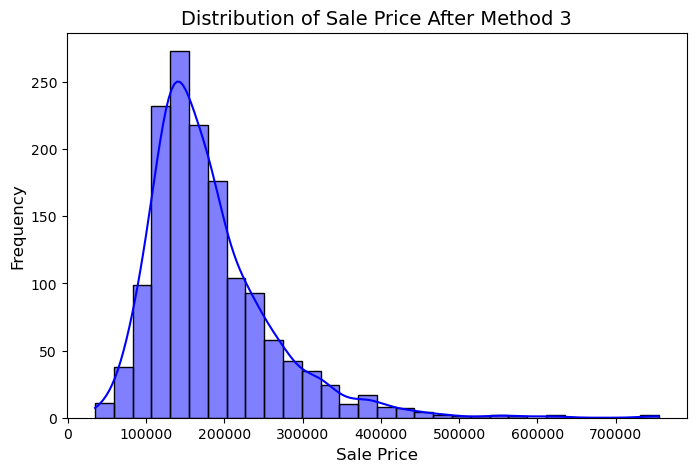

In [83]:
# Set plot size
plt.figure(figsize=(8, 5))

# Plot distribution
sns.histplot(df_outliers_handled["SalePrice"], bins=30, kde=True, color="blue")

# Labels and title
plt.xlabel("Sale Price", fontsize=12)
plt.ylabel("Frequency", fontsize=12)
plt.title("Distribution of Sale Price After Method 3", fontsize=14)

# Show plot
plt.show()

#### We chose to move on with Approach 3 since Approach 1 is ruled out already and we were removing Outliers from every Feature in Approach 2
#### Since we lacked Domain Knowledge for this Challenge, we deemed its better to remove Less Original Values
#### Moreover, we are preserving the Original Distribution of the Target Variable

In [84]:
# Reassigning the Cleaned Dataframe back to df_numerical
df_numerical = df_outliers_handled.copy()

# Resulting DataFrame
print(f"Original shape: {df_numerical.shape}\n")

# Check how many missing values were introduced
print(df_numerical.isna().sum().sort_values(ascending=False))

Original shape: (1460, 37)

MSSubClass       0
HalfBath         0
KitchenAbvGr     0
TotRmsAbvGrd     0
Fireplaces       0
GarageYrBlt      0
GarageCars       0
GarageArea       0
WoodDeckSF       0
OpenPorchSF      0
EnclosedPorch    0
3SsnPorch        0
ScreenPorch      0
PoolArea         0
MiscVal          0
MoSold           0
YrSold           0
BedroomAbvGr     0
FullBath         0
LotFrontage      0
BsmtHalfBath     0
LotArea          0
OverallQual      0
OverallCond      0
YearBuilt        0
YearRemodAdd     0
MasVnrArea       0
BsmtFinSF1       0
BsmtFinSF2       0
BsmtUnfSF        0
TotalBsmtSF      0
1stFlrSF         0
2ndFlrSF         0
LowQualFinSF     0
GrLivArea        0
BsmtFullBath     0
SalePrice        0
dtype: int64


In [85]:
df_numerical = df_numerical.drop("SalePrice", axis = 1)
df_numerical.head()

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd,MasVnrArea,BsmtFinSF1,BsmtFinSF2,...,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,YrSold
0,60,65.0,8450.0,7,5,2003,2003,196.0,706,0.0,...,548,0,61.0,0.0,0,0.0,0,0.0,2,2008
1,20,80.0,9600.0,6,8,1976,1976,0.0,978,0.0,...,460,298,0.0,0.0,0,0.0,0,0.0,5,2007
2,60,68.0,11250.0,7,5,2001,2002,162.0,486,0.0,...,608,0,42.0,0.0,0,0.0,0,0.0,9,2008
3,70,60.0,9550.0,7,5,1915,1970,0.0,216,0.0,...,642,0,35.0,0.0,0,0.0,0,0.0,2,2006
4,60,84.0,14260.0,8,5,2000,2000,350.0,655,0.0,...,836,192,84.0,0.0,0,0.0,0,0.0,12,2008


In [86]:
df_numerical.shape

(1460, 36)

In [87]:
df_categorical.shape

(1460, 40)

## Splitting the Dataset into Training and Test Set

In [88]:
X_num = df_numerical.copy()
X_cat = df_categorical.copy()
y = df_target["SalePrice"]

# Combine features temporarily for splitting
X = pd.concat([X_num, X_cat], axis = 1)

# Split before processing
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, random_state = 42)

In [89]:
print(X_num.shape)
print(X_cat.shape)

(1460, 36)
(1460, 40)


In [90]:
print(X_train.shape)
print(X_test.shape)

(1168, 76)
(292, 76)


In [91]:
print(y_train.shape)
print(y_test.shape)

(1168,)
(292,)


## Splitting Numerical and Categorical Features into Different Sets for Separate Handling

In [92]:
# Get back num/cat split after train/test
X_train_num = X_train[X_num.columns]
X_test_num = X_test[X_num.columns]

X_train_cat = X_train[X_cat.columns]
X_test_cat = X_test[X_cat.columns]

In [93]:
print(X_train_num.shape)
print(X_test_num.shape)

(1168, 36)
(292, 36)


In [94]:
print(X_train_cat.shape)
print(X_test_cat.shape)

(1168, 40)
(292, 40)


## Encoding Nominal Features and High Cardinality Features

#### Nominal Features are encoded with One-Hot Encoder and High Cardinality Features are encoded with Target Encoder

In [95]:
# Threshold for no. of unique values is set to 10
threshold = 10

# Split categorical columns
low_cardinality_cols = [col for col in X_train_cat.columns if X_train_cat[col].nunique() <= threshold]
high_cardinality_cols = [col for col in X_train_cat.columns if X_train_cat[col].nunique() > threshold]

In [96]:
print(len(low_cardinality_cols))
print(len(high_cardinality_cols))

37
3


In [97]:
# ONE-HOT ENCODING
ohe = OneHotEncoder(handle_unknown='ignore', sparse_output=False)

X_train_ohe = pd.DataFrame(ohe.fit_transform(X_train_cat[low_cardinality_cols]),
                           columns=ohe.get_feature_names_out(low_cardinality_cols),
                           index=X_train_cat.index)

X_test_ohe = pd.DataFrame(ohe.transform(X_test_cat[low_cardinality_cols]),
                          columns=ohe.get_feature_names_out(low_cardinality_cols),
                          index=X_test_cat.index)

In [98]:
print(X_train_ohe.shape)
print(X_test_ohe.shape)

(1168, 148)
(292, 148)


In [99]:
# TARGET ENCODING
target_enc = ce.TargetEncoder(cols=high_cardinality_cols)

X_train_target = target_enc.fit_transform(X_train_cat[high_cardinality_cols], y_train)
X_test_target = target_enc.transform(X_test_cat[high_cardinality_cols])

In [100]:
print(X_train_target.shape)
print(X_test_target.shape)

(1168, 3)
(292, 3)


In [101]:
# Combining Encoded Features
X_train_final_cat = pd.concat([X_train_ohe, X_train_target], axis=1)
X_test_final_cat = pd.concat([X_test_ohe, X_test_target], axis=1)

In [102]:
print(X_train_final_cat.shape)
print(X_test_final_cat.shape)

(1168, 151)
(292, 151)


### Standardizing just Numerical Features (Only for Lasso & PCA)

In [103]:
scaler = StandardScaler()
X_train_num_scaled = pd.DataFrame(
    scaler.fit_transform(X_train_num),
    columns=X_train_num.columns,
    index=X_train_num.index
)
X_test_num_scaled = pd.DataFrame(
    scaler.transform(X_test_num),
    columns=X_test_num.columns,
    index=X_test_num.index
)

In [104]:
print(X_train_num_scaled.shape)
print(X_test_num_scaled.shape)

(1168, 36)
(292, 36)


## Creating Model Specific Datasets for Training

#### Final Dataset for Models that Don't need Scaling (like XGBoost, Random Forest etc.)

In [105]:
# Combining unscaled numerical + encoded categorical features
X_train_final_tree = pd.concat([X_train_num, X_train_final_cat], axis=1)
X_test_final_tree = pd.concat([X_test_num, X_test_final_cat], axis=1)

In [106]:
print(X_train_final_tree.shape)
print(X_test_final_tree.shape)

(1168, 187)
(292, 187)


#### Final Dataset for Models that Do need Scaling (like Lasso, Ridge, PCA, etc.)

In [107]:
# Combine scaled numerical + encoded categorical features
X_train_final_linear = pd.concat([X_train_num_scaled, X_train_final_cat], axis=1)
X_test_final_linear = pd.concat([X_test_num_scaled, X_test_final_cat], axis=1)

In [108]:
print(X_train_final_linear.shape)
print(X_test_final_linear.shape)

(1168, 187)
(292, 187)


## Applying PCA 
- Applied after Splitting and Encoding all Categorical Features using One-Hot and Target Encoding

In [109]:
# Capturing Variance using 10 Principal Components
pca = PCA(n_components = 2, random_state = 42)

X_train_pca = pca.fit_transform(X_train_final_linear)
X_test_pca = pca.transform(X_test_final_linear)

# Convert to DataFrame with named components
pca_cols = [f'pca_{i+1}' for i in range(pca.n_components_)]
X_train_pca_df = pd.DataFrame(X_train_pca, columns=pca_cols, index=X_train_final_linear.index)
X_test_pca_df = pd.DataFrame(X_test_pca, columns=pca_cols, index=X_test_final_linear.index)

In [110]:
# Explained variance ratio in percentage
explained_variance_percent = pca.explained_variance_ratio_ * 100

# Print first 10 components
print("Explained variance ratio of first 10 components (%):")
for i, var in enumerate(explained_variance_percent[:10], start=1):
    print(f"PC{i}: {var:.2f}%")

# Total variance explained (in %)
total_variance = explained_variance_percent[:10].sum()
print(f"\nTotal variance explained by first 10 PCs: {total_variance:.2f}%")

Explained variance ratio of first 10 components (%):
PC1: 72.85%
PC2: 25.85%

Total variance explained by first 10 PCs: 98.70%


In [111]:
# Feature contribution to PC1
pc1_weights = pd.Series(pca.components_[0], index = X_train_final_linear.columns)
pc1_weights.abs().sort_values(ascending=False).head(10)

Neighborhood    0.839086
Exterior1st     0.387705
Exterior2nd     0.381601
YearBuilt       0.000013
OverallQual     0.000012
YearRemodAdd    0.000011
GarageYrBlt     0.000011
GarageCars      0.000010
FullBath        0.000010
GarageArea      0.000009
dtype: float64

In [112]:
# Feature contribution to PC2
pc2_weights = pd.Series(pca.components_[1], index = X_train_final_linear.columns)
pc2_weights.abs().sort_values(ascending=False).head(10)

Exterior1st     0.603191
Exterior2nd     0.583303
Neighborhood    0.543984
Fireplaces      0.000005
GarageYrBlt     0.000004
MasVnrArea      0.000004
OverallQual     0.000004
GrLivArea       0.000004
YearRemodAdd    0.000003
GarageArea      0.000003
dtype: float64

In [113]:
print(X_train_pca_df.shape)
print(X_test_pca_df.shape)

(1168, 2)
(292, 2)


In [114]:
X_train_pca_df.head()

,pca_1,pca_2
254,-52556.286160,-20025.073236
1066,37392.618724,28697.330492
638,-68771.053022,-9313.448091
799,-39524.260400,-27141.326278
380,-19032.269503,4740.050340


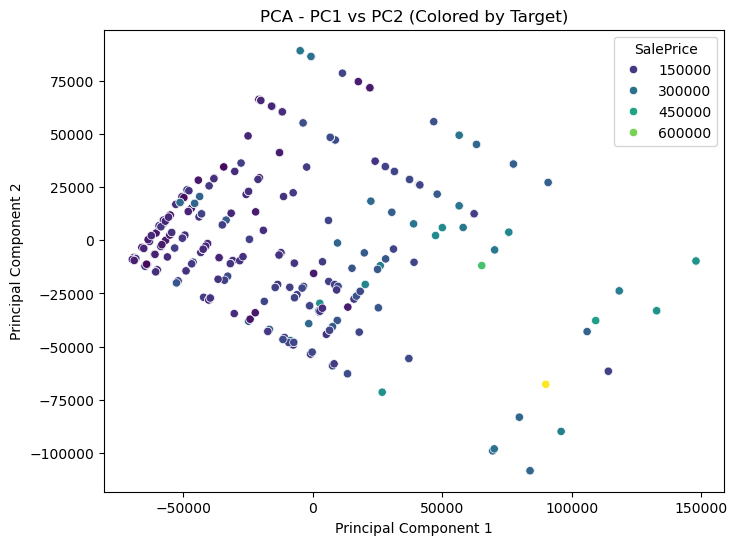

In [115]:
y_train_series = pd.Series(y_train, index=X_train_pca_df.index)

plt.figure(figsize=(8,6))
sns.scatterplot(x='pca_1', y='pca_2', data=X_train_pca_df, hue=y_train_series, palette='viridis')
plt.title("PCA - PC1 vs PC2 (Colored by Target)")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title='SalePrice')
plt.show()

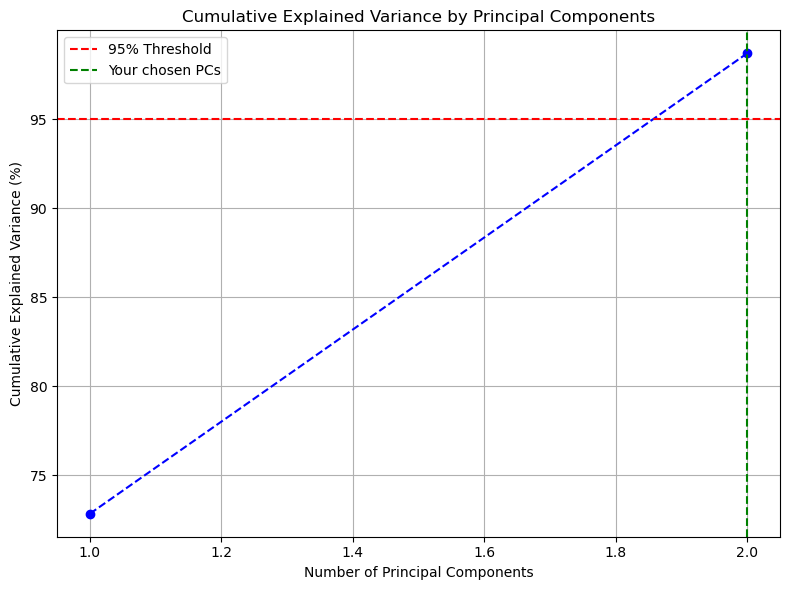

In [116]:
# Cumulative explained variance
cumulative_variance = np.cumsum(pca.explained_variance_ratio_) * 100  # in percentage

# Plot
plt.figure(figsize=(8,6))
plt.plot(range(1, len(cumulative_variance)+1), cumulative_variance, marker='o', linestyle='--', color='b')
plt.title('Cumulative Explained Variance by Principal Components')
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance (%)')
plt.grid(True)
plt.axhline(y=95, color='r', linestyle='--', label='95% Threshold')
plt.axvline(x=2, color='g', linestyle='--', label='Your chosen PCs')
plt.legend()
plt.tight_layout()
plt.show()

## Observations from PCA
- Just **2** Principal Components are sufficient to explain **98.7%** of the total variance in the dataset.
- The dataset has **high variability** among its features, with a significant degree of **multicollinearity** between them.
- **Neighborhood** has a dominant influence on the First Principal Component, indicating its **substantial** contribution to the overall variance captured by **PCA**.

# Training Models

### A. Tree-Based Model

- Training XGBoost Model for making Prediction which is a Tree-Based Model, since EDA has revealed Right-Skewness in the Data of most Features and Tree-Based models are known to Handle Skewness in the Data well without the need of any Transformation (like Log Transformation)
- Since Grid Search CV takes a lot of time to run we have written our own code to find the Optimal Parameters
- Additionally, we have used the same Parameters for all XGBoost Models to ensure Consistency

#### 1. Training XGBoost Model using All Features

In [117]:
# Define param options
param_grid = {
    'n_estimators': [30, 40, 50, 75, 100],
    'max_depth': [3, 5, 7],
    'learning_rate': [0.01, 0.05, 0.1],
    'subsample': [0.8, 1.0]
}

best_score = float("inf")
best_model = None
best_params = {}

# Manual tuning loop
for n in param_grid['n_estimators']:
    for d in param_grid['max_depth']:
        for lr in param_grid['learning_rate']:
            for sub in param_grid['subsample']:
                model = xgb.XGBRegressor(
                    n_estimators=n,
                    max_depth=d,
                    learning_rate=lr,
                    subsample=sub,
                    objective='reg:squarederror',
                    random_state=42,
                    verbosity=0
                )
                model.fit(X_train_final_tree, y_train)
                preds = model.predict(X_test_final_tree)
                mse = mean_squared_error(y_test, preds)
                
                if mse < best_score:
                    best_score = mse
                    best_model = model
                    best_params = {
                        'n_estimators': n,
                        'max_depth': d,
                        'learning_rate': lr,
                        'subsample': sub
                    }

print("Best Params:", best_params)
print("Best MSE:", best_score)

Best Params: {'n_estimators': 100, 'max_depth': 3, 'learning_rate': 0.1, 'subsample': 0.8}
Best MSE: 747573440.0


In [118]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np

# Predict
y_pred = best_model.predict(X_test_final_tree)

# Evaluation metrics
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

print("XGBoost with ALL Features:")
print(f"MSE:  {mse:.2f}")
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R²:   {r2:.4f}")

XGBoost with ALL Features:
MSE:  747573440.00
MAE:  16466.93
RMSE: 27341.79
R²:   0.9025


<Figure size 1000x800 with 0 Axes>

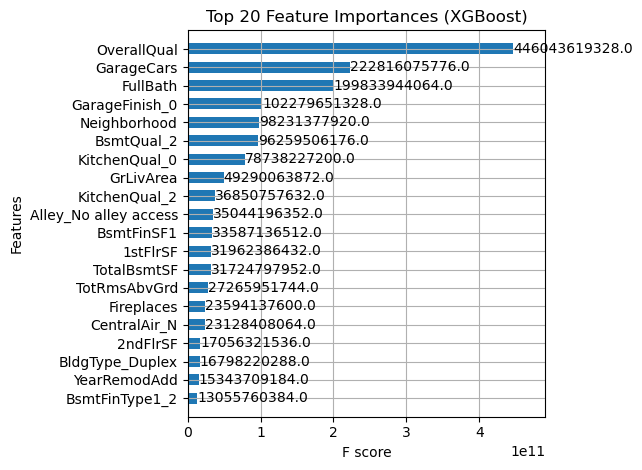

In [119]:
from xgboost import plot_importance
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 8))
plot_importance(best_model, max_num_features=20, height=0.6, importance_type='gain')
plt.title("Top 20 Feature Importances (XGBoost)")
plt.tight_layout()
plt.show()

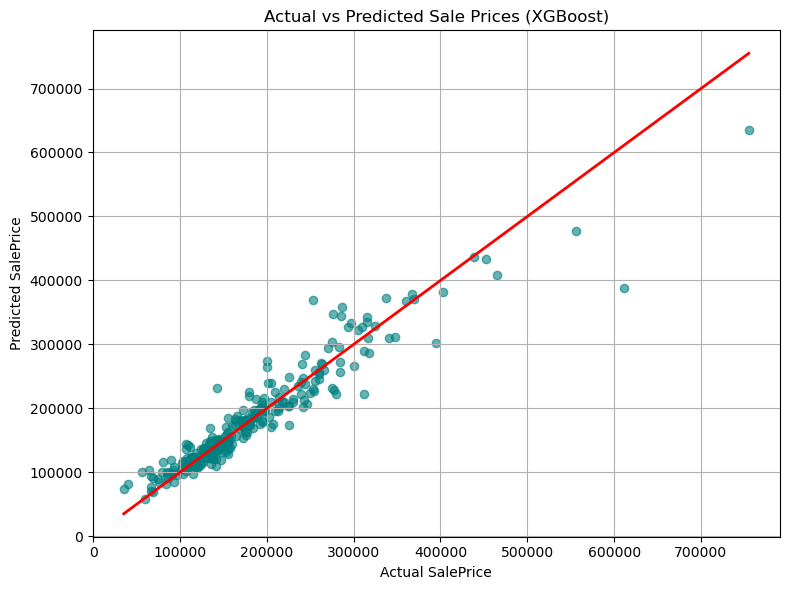

In [120]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred, alpha=0.6, color='teal')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', lw=2)
plt.xlabel("Actual SalePrice")
plt.ylabel("Predicted SalePrice")
plt.title("Actual vs Predicted Sale Prices (XGBoost)")
plt.grid(True)
plt.tight_layout()
plt.show()

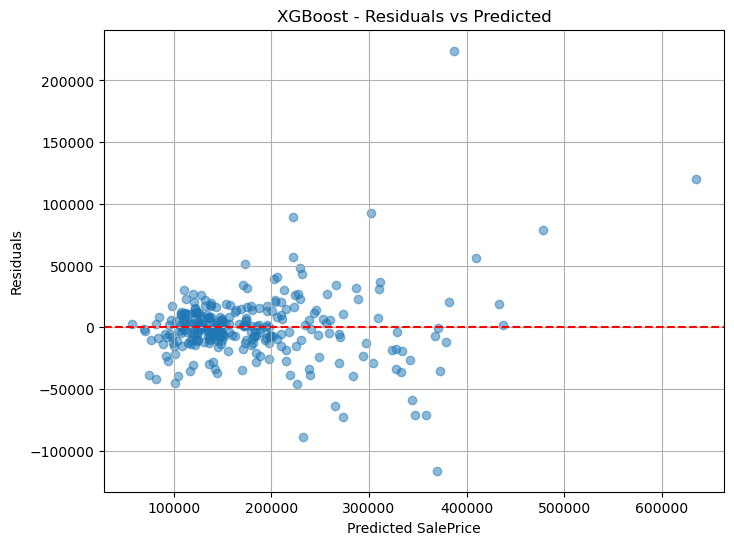

In [121]:
residuals = y_test - y_pred

plt.figure(figsize=(8, 6))
plt.scatter(y_pred, residuals, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted SalePrice")
plt.ylabel("Residuals")
plt.title("XGBoost - Residuals vs Predicted")
plt.grid(True)
plt.show()

#### 2. Training XGBoost after only removing the Most Dominating Feature (i.e. OverallQual)

In [122]:
# 1. Drop OverallQual from tree-based dataset
X_train_tree_wo_qual = X_train_final_tree.drop(columns=['OverallQual'])
X_test_tree_wo_qual = X_test_final_tree.drop(columns=['OverallQual'])

In [123]:
# 2. Train model using known best params
xgb1 = xgb.XGBRegressor(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.1,
    subsample=0.8,
    objective='reg:squarederror',
    random_state=42,
    verbosity=0
)

xgb1.fit(X_train_tree_wo_qual, y_train)

AttributeError: 'super' object has no attribute '__sklearn_tags__'

AttributeError: 'super' object has no attribute '__sklearn_tags__'

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=42,
             reg_alpha=0, reg_lambda=1, ...)

In [124]:
# 3. Predictions and Evaluation
y_pred_xgb1 = xgb1.predict(X_test_tree_wo_qual)

mse = mean_squared_error(y_test, y_pred_xgb1)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred_xgb1)
r2 = r2_score(y_test, y_pred_xgb1)

print("XGBoost Performance WITHOUT OverallQual:")
print(f"MSE:  {mse:.2f}")
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R²:   {r2:.4f}")

XGBoost Performance WITHOUT OverallQual:
MSE:  853205120.00
MAE:  17363.67
RMSE: 29209.68
R²:   0.8888


<Figure size 1000x600 with 0 Axes>

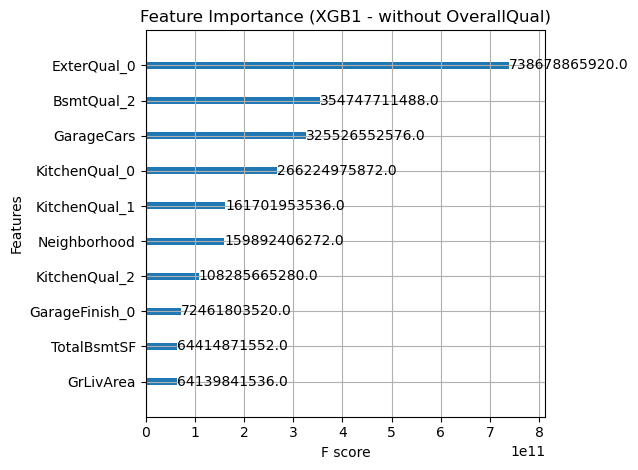

In [125]:
import matplotlib.pyplot as plt
from xgboost import plot_importance

plt.figure(figsize=(10, 6))
plot_importance(xgb1, max_num_features=10, importance_type='gain')
plt.title("Feature Importance (XGB1 - without OverallQual)")
plt.tight_layout()
plt.show()

#### 3. Training XGBoost after only removing Neighborhood

In [126]:
# 1. Drop Neighborhood
X_train_tree_wo_nbhd = X_train_final_tree.drop(columns=['Neighborhood'])
X_test_tree_wo_nbhd = X_test_final_tree.drop(columns=['Neighborhood'])

In [127]:
# 2. Train with same best params
xgb2 = xgb.XGBRegressor(
    n_estimators=100,
    max_depth=3,
    learning_rate=0.1,
    subsample=0.8,
    objective='reg:squarederror',
    random_state=42,
    verbosity=0
)
xgb2.fit(X_train_tree_wo_nbhd, y_train)

AttributeError: 'super' object has no attribute '__sklearn_tags__'

AttributeError: 'super' object has no attribute '__sklearn_tags__'

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=42,
             reg_alpha=0, reg_lambda=1, ...)

In [128]:
# 3. Evaluate
y_pred_xgb2 = xgb2.predict(X_test_tree_wo_nbhd)

mse = mean_squared_error(y_test, y_pred_xgb2)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred_xgb2)
r2 = r2_score(y_test, y_pred_xgb2)

print("XGBoost WITHOUT Neighborhood:")
print(f"MSE:  {mse:.2f}")
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R²:   {r2:.4f}")

XGBoost WITHOUT Neighborhood:
MSE:  856801024.00
MAE:  17808.14
RMSE: 29271.16
R²:   0.8883


<Figure size 1000x600 with 0 Axes>

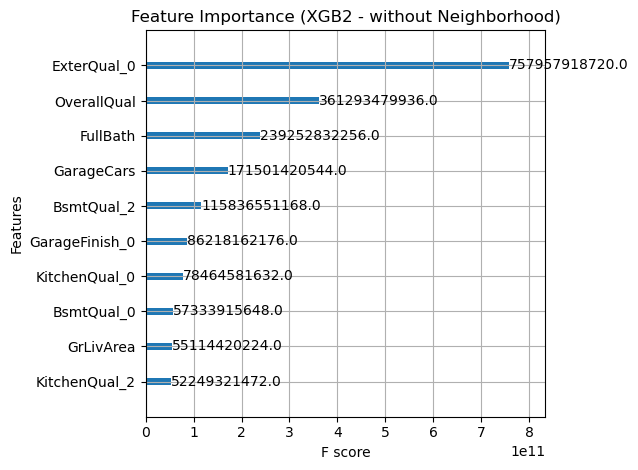

In [129]:
plt.figure(figsize=(10, 6))
plot_importance(xgb2, max_num_features=10, importance_type='gain')
plt.title("Feature Importance (XGB2 - without Neighborhood)")
plt.tight_layout()
plt.show()

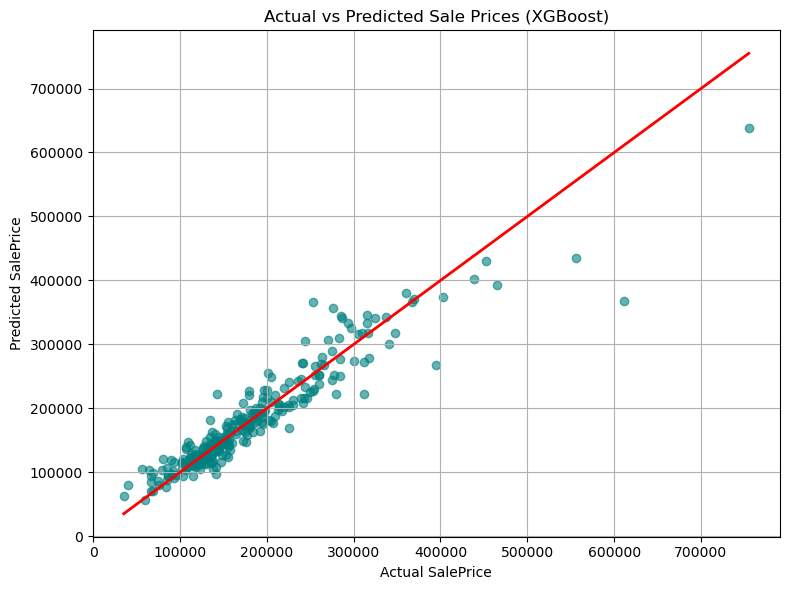

In [130]:
import matplotlib.pyplot as plt

plt.figure(figsize=(8, 6))
plt.scatter(y_test, y_pred_xgb2, alpha=0.6, color='teal')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], color='red', lw=2)
plt.xlabel("Actual SalePrice")
plt.ylabel("Predicted SalePrice")
plt.title("Actual vs Predicted Sale Prices (XGBoost)")
plt.grid(True)
plt.tight_layout()
plt.show()

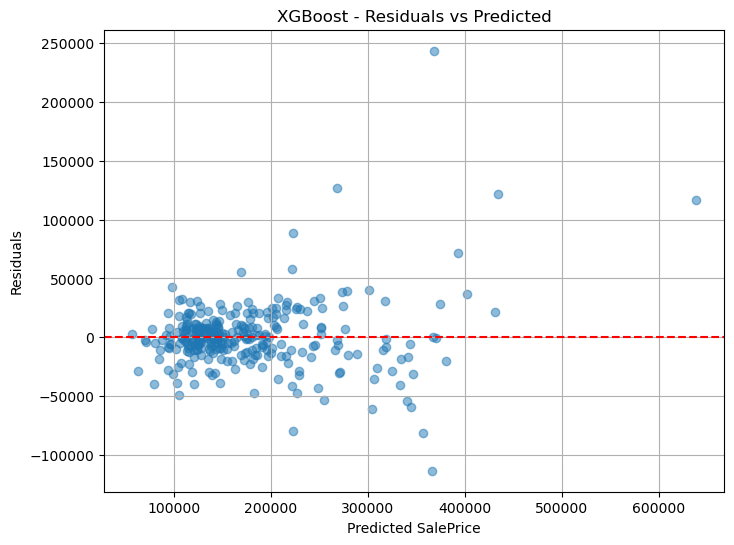

In [131]:
residuals = y_test - y_pred_xgb2

plt.figure(figsize=(8, 6))
plt.scatter(y_pred_xgb2, residuals, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted SalePrice")
plt.ylabel("Residuals")
plt.title("XGBoost - Residuals vs Predicted")
plt.grid(True)
plt.show()

#### 4. Training XGBoost with PCA Applied Set

In [132]:
# Train XGBoost on PCA features
xgb_pca = xgb.XGBRegressor(
    objective='reg:squarederror',
    n_estimators=100,
    max_depth=3,
    learning_rate=0.1,
    subsample=0.8,
    random_state=42,
    verbosity=0
)

xgb_pca.fit(X_train_pca, y_train)

AttributeError: 'super' object has no attribute '__sklearn_tags__'

AttributeError: 'super' object has no attribute '__sklearn_tags__'

XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
             colsample_bylevel=1, colsample_bynode=1, colsample_bytree=1,
             early_stopping_rounds=None, enable_categorical=False,
             eval_metric=None, gamma=0, gpu_id=-1, grow_policy='depthwise',
             importance_type=None, interaction_constraints='',
             learning_rate=0.1, max_bin=256, max_cat_to_onehot=4,
             max_delta_step=0, max_depth=3, max_leaves=0, min_child_weight=1,
             missing=nan, monotone_constraints='()', n_estimators=100, n_jobs=0,
             num_parallel_tree=1, predictor='auto', random_state=42,
             reg_alpha=0, reg_lambda=1, ...)

In [133]:
# Prediction
y_pred_pca = xgb_pca.predict(X_test_pca)

# Evaluation
mse = mean_squared_error(y_test, y_pred_pca)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred_pca)
r2 = r2_score(y_test, y_pred_pca)

print("XGBoost on PCA Features:")
print(f"MSE:  {mse:.2f}")
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R²:   {r2:.4f}")

XGBoost on PCA Features:
MSE:  3507161088.00
MAE:  36209.86
RMSE: 59221.29
R²:   0.5428


<Figure size 1000x600 with 0 Axes>

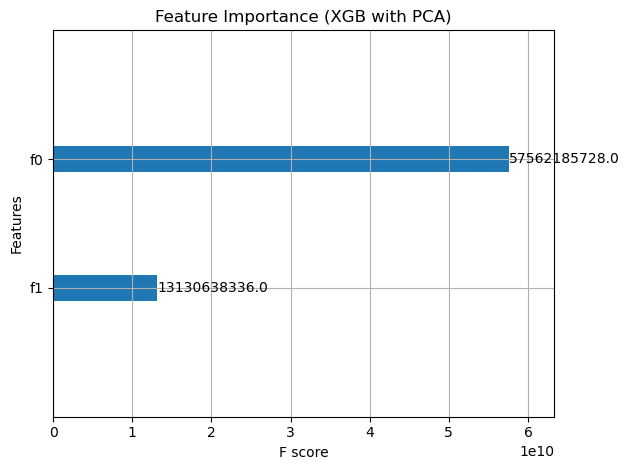

In [134]:
plt.figure(figsize=(10, 6))
plot_importance(xgb_pca, max_num_features=10, importance_type='gain')
plt.title("Feature Importance (XGB with PCA)")
plt.tight_layout()
plt.show()

### Observations from Tree-Based Model (XGBoost)
- According to the Feature Importance Plot, **Neighborhood** is consistently ranked among the Top Contributors. This indicates that **Neighborhood** is a **strong** standalone feature.
 
- Although **OverallQual** ranks higher than **Neighborhood** in the feature importance plot, the removal of **Neighborhood** results in a **greater drop** in model performance (as measured by **MAE**, **RMSE**, and **R²**). This suggests that **Neighborhood** is relatively more **critical** to model performance than **OverallQual**.

- **ExterQual_0** isn't very important when all features are used, but when key features like **Neighborhood** or **OverallQual** are removed, it steps up and becomes one of the top contributors. This shows that it's **not** strong on its own and is **correlated** to other features, however, it becomes useful when other important features are missing.

### B. Linear Model

- Training a linear model (Lasso) to compare and evaluate the findings with that of the Tree Based Model (XGBoost).
- The reason behind choosing Lasso is that Lasso has co-efficient skrinkage mechanism. So if a feature is not contributing significantly to model performance it gets a co-efficient 0.
- This basically means that if Neighborhood doesn't have a co-efficient of 0 then it is indeed contributing positively to the model performance.

#### 1. Training Lasso with All Features

In [135]:
# Applying Log Transformation since the Target Variable is Right-Skewed
y_train_log = np.log1p(y_train)
y_test_log = np.log1p(y_test)

In [136]:
lasso = LassoCV(cv=5, random_state=42)
lasso.fit(X_train_final_linear, y_train_log)

print("Best Alpha:", lasso.alpha_)

Best Alpha: 82.71304370360282


In [137]:
y_pred_log = lasso.predict(X_test_final_linear)
y_pred = np.expm1(y_pred_log)  # inverse of log1p

In [138]:
mse = mean_squared_error(y_test, y_pred)
mae = mean_absolute_error(y_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_test, y_pred))
r2 = r2_score(y_test, y_pred)

print(f"LASSO with ALL Features:")
print(f"MSE:  {mse:.2f}")
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R²:   {r2:.4f}")

LASSO with ALL Features:
MSE:  3506681112.14
MAE:  37526.96
RMSE: 59217.24
R²:   0.5428


In [139]:
# Get non-zero coefficients
coef_series = pd.Series(lasso.coef_, index=X_train_final_linear.columns)
non_zero_coefs = coef_series[coef_series != 0].sort_values(key=abs, ascending=False)

print("Top Features Selected by Lasso:")
print(non_zero_coefs.head(10))

Top Features Selected by Lasso:
Neighborhood    0.000005
Exterior1st     0.000002
dtype: float64


C:\Users\reign\AppData\Local\Temp\ipykernel_1772\2017988451.py:2: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.barplot(x=non_zero_coefs.values, y=non_zero_coefs.index, palette="viridis")


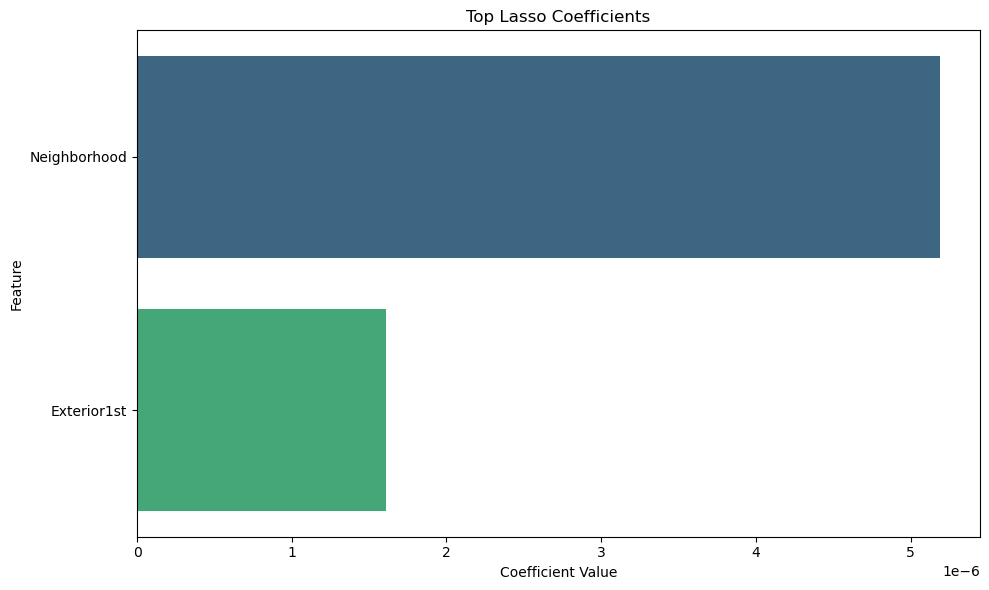

In [140]:
plt.figure(figsize=(10, 6))
sns.barplot(x=non_zero_coefs.values, y=non_zero_coefs.index, palette="viridis")
plt.title("Top Lasso Coefficients")
plt.xlabel("Coefficient Value")
plt.ylabel("Feature")
plt.tight_layout()
plt.show()

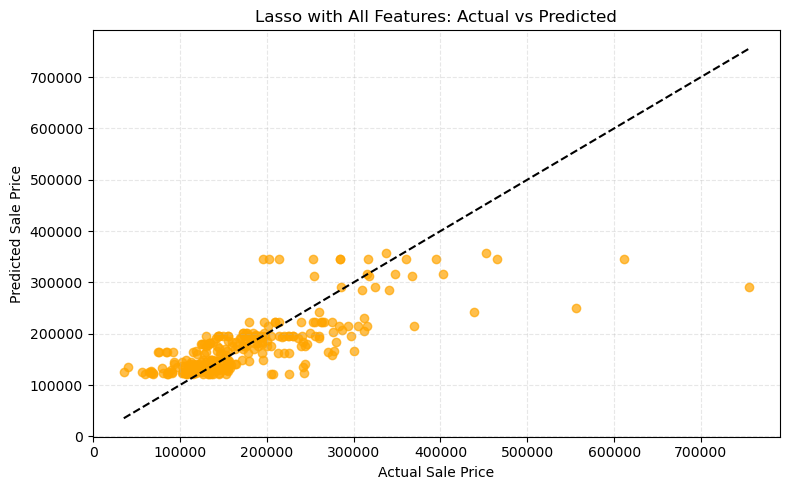

In [141]:
plt.figure(figsize=(8, 5))
plt.scatter(y_test, y_pred, alpha=0.7, color='orange')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--', color='black')
plt.xlabel("Actual Sale Price")
plt.ylabel("Predicted Sale Price")
plt.title("Lasso with All Features: Actual vs Predicted")
plt.grid(True, linestyle="--", alpha=0.3)
plt.tight_layout()
plt.show()

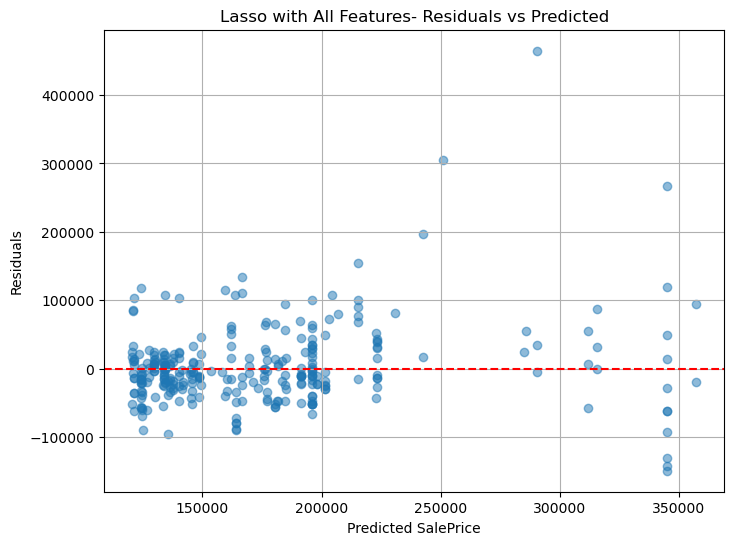

In [142]:
residuals = y_test - y_pred

plt.figure(figsize=(8, 6))
plt.scatter(y_pred, residuals, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted SalePrice")
plt.ylabel("Residuals")
plt.title("Lasso with All Features- Residuals vs Predicted")
plt.grid(True)
plt.show()

#### 2. Training Lasso after only removing Neighborhood

In [143]:
# Remove Neighborhood
X_train_lasso1 = X_train_final_linear.drop(columns=['Neighborhood'], errors='ignore')
X_test_lasso1 = X_test_final_linear.drop(columns=['Neighborhood'], errors='ignore')

In [144]:
def run_lasso(X_train, X_test, y_train, y_test, label):
    lasso = LassoCV(cv=5, random_state=42)
    lasso.fit(X_train, np.log1p(y_train))

    y_pred_log = lasso.predict(X_test)
    y_pred = np.expm1(y_pred_log)

    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    rmse = np.sqrt(mean_squared_error(y_test, y_pred))
    r2 = r2_score(y_test, y_pred)

    print(f"----- {label} -----")
    print(f"Best Alpha: {lasso.alpha_:.5f}")
    print(f"MSE:        {mse:.2f}")
    print(f"MAE:        {mae:.2f}")
    print(f"RMSE:       {rmse:.2f}")
    print(f"R²:         {r2:.4f}")

    # Coefficients
    coef_series = pd.Series(lasso.coef_, index=X_train.columns)
    non_zero_coefs = coef_series[coef_series != 0].sort_values(key=abs, ascending=False)
    print("\nTop Features Selected:")
    print(non_zero_coefs.head(10))

    return lasso, y_pred

In [145]:
def plot_lasso_importance(model, feature_names, title="Lasso Feature Importance", top_n=10):
    # Get coefficients
    coef_series = pd.Series(model.coef_, index=feature_names)
    non_zero_coefs = coef_series[coef_series != 0].sort_values(key=abs, ascending=False)

    # Take top n features
    top_features = non_zero_coefs.head(top_n)

    # Plot
    plt.figure(figsize=(10, 6))
    top_features.plot(kind='barh', color='skyblue')
    plt.title(title)
    plt.xlabel("Coefficient Value (Absolute)")
    plt.gca().invert_yaxis()
    plt.grid(True, axis='x', linestyle='--', alpha=0.5)
    plt.tight_layout()
    plt.show()

In [146]:
lasso1, y_pred_1 = run_lasso(X_train_lasso1, X_test_lasso1, y_train, y_test, label="Lasso without Neighborhood")

----- Lasso without Neighborhood -----
Best Alpha: 9.35306
MSE:        6932390677.23
MAE:        54209.92
RMSE:       83260.98
R²:         0.0962

Top Features Selected:
Exterior1st    0.000004
Exterior2nd    0.000002
dtype: float64


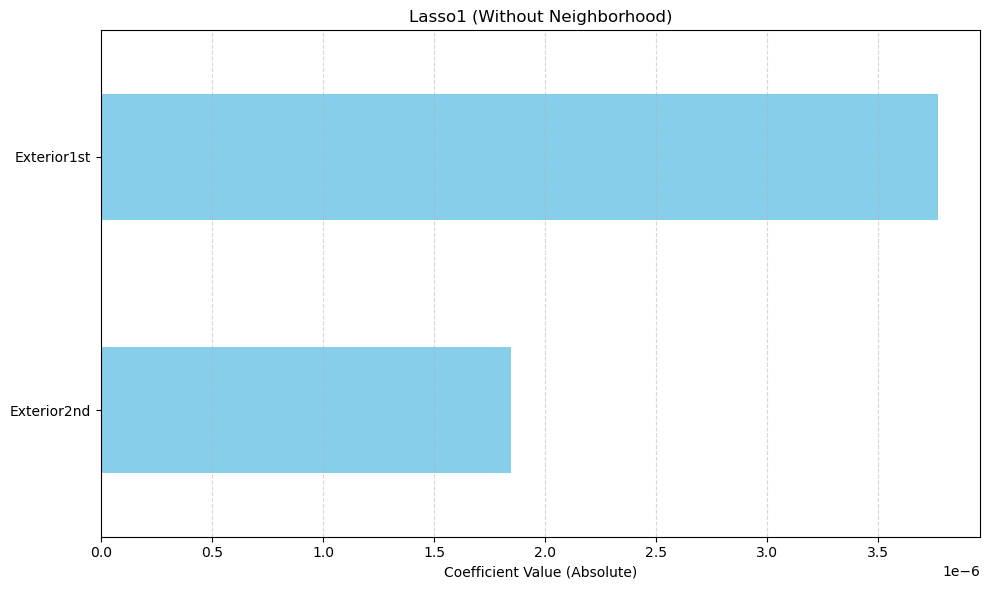

In [147]:
plot_lasso_importance(lasso1, X_train_lasso1.columns, title="Lasso1 (Without Neighborhood)")

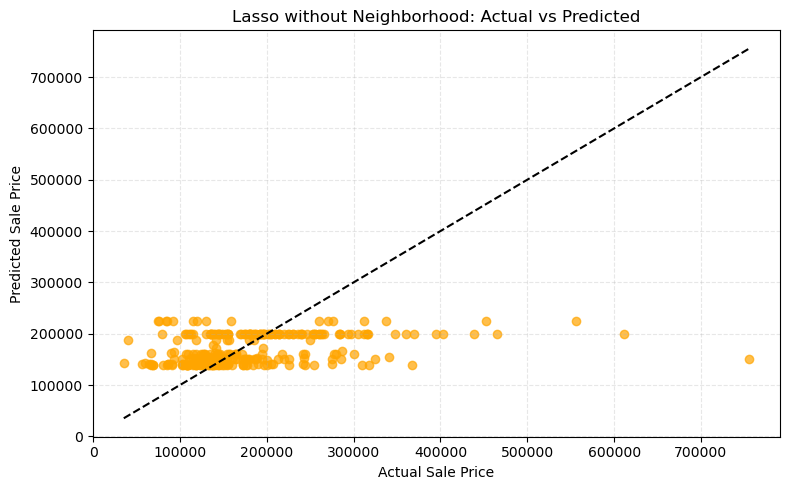

In [148]:
plt.figure(figsize=(8, 5))
plt.scatter(y_test, y_pred_1, alpha=0.7, color='orange')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], '--', color='black')
plt.xlabel("Actual Sale Price")
plt.ylabel("Predicted Sale Price")
plt.title("Lasso without Neighborhood: Actual vs Predicted")
plt.grid(True, linestyle="--", alpha=0.3)
plt.tight_layout()
plt.show()

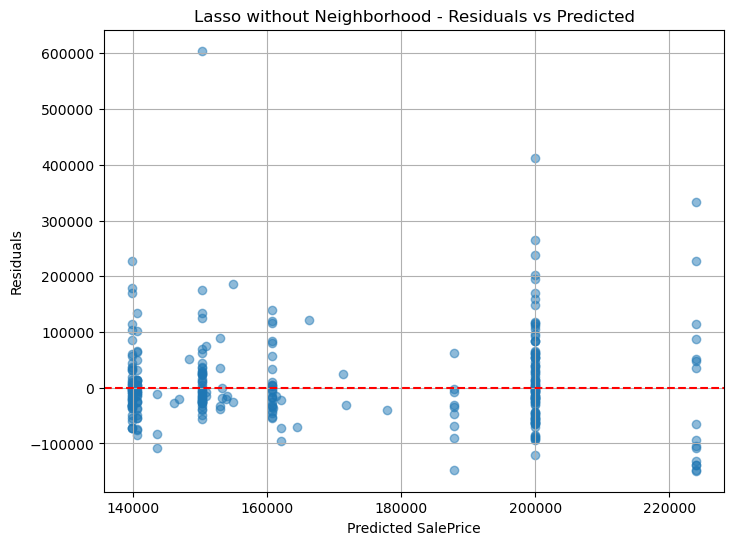

In [149]:
residuals = y_test - y_pred_1

plt.figure(figsize=(8, 6))
plt.scatter(y_pred_1, residuals, alpha=0.5)
plt.axhline(0, color='red', linestyle='--')
plt.xlabel("Predicted SalePrice")
plt.ylabel("Residuals")
plt.title("Lasso without Neighborhood - Residuals vs Predicted")
plt.grid(True)
plt.show()

#### 3. Training Lasso after only removing Exterior1st

In [150]:
# Remove Exterior1st
X_train_lasso2 = X_train_final_linear.drop(columns=['Exterior1st'], errors='ignore')
X_test_lasso2 = X_test_final_linear.drop(columns=['Exterior1st'], errors='ignore')

In [151]:
lasso2, y_pred_2 = run_lasso(X_train_lasso2, X_test_lasso2, y_train, y_test, label="Lasso without Exterior1st")

----- Lasso without Exterior1st -----
Best Alpha: 13.48017
MSE:        3500775213.26
MAE:        37525.51
RMSE:       59167.35
R²:         0.5436

Top Features Selected:
Neighborhood    0.000005
Exterior2nd     0.000001
dtype: float64


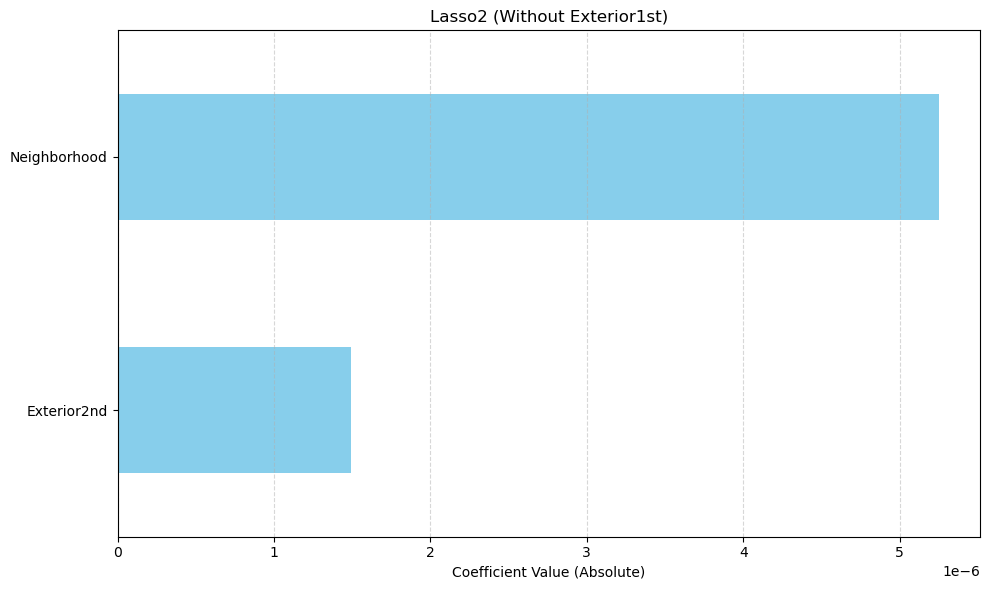

In [152]:
plot_lasso_importance(lasso2, X_train_lasso2.columns, title="Lasso2 (Without Exterior1st)")

#### 4. Training Lasso with PCA Applied Set

In [153]:
# Train LASSO
lasso_pca = LassoCV(cv=5, random_state=42)
lasso_pca.fit(X_train_pca, y_train)

LassoCV(cv=5, random_state=42)

In [154]:
# Make Predictions
y_pred_pca = lasso_pca.predict(X_test_pca)

In [155]:
mse = mean_squared_error(y_test, y_pred_pca)
mae = mean_absolute_error(y_test, y_pred_pca)
rmse = np.sqrt(mse)
r2 = r2_score(y_test, y_pred_pca)

print(f"LASSO on PCA Features:")
print(f"MSE:  {mse:.2f}")
print(f"MAE:  {mae:.2f}")
print(f"RMSE: {rmse:.2f}")
print(f"R²:   {r2:.4f}")

LASSO on PCA Features:
MSE:  3537600454.36
MAE:  39253.03
RMSE: 59477.73
R²:   0.5388


In [156]:
# If you don't need to convert and already have column names
coef_series = pd.Series(lasso_pca.coef_, index=[f'PC{i+1}' for i in range(len(lasso_pca.coef_))])
non_zero_coefs = coef_series[coef_series != 0].sort_values(key=abs, ascending=False)

print("Top Features Selected by Lasso:")
print(non_zero_coefs.head(10))

Top Features Selected by Lasso:
PC1    0.983668
PC2   -0.387516
dtype: float64


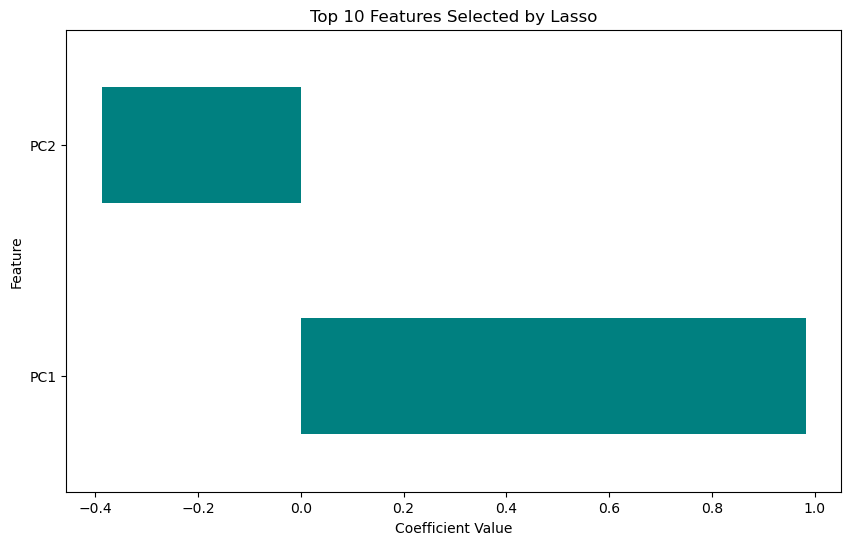

In [157]:
# Plot the top features selected by Lasso
plt.figure(figsize=(10, 6))
non_zero_coefs.head(10).plot(kind='barh', color='teal')

plt.title('Top 10 Features Selected by Lasso')
plt.xlabel('Coefficient Value')
plt.ylabel('Feature')
plt.show()

### Observations from Linear Model (LASSO)
- **Neighborhood** clearly stands out as the **most** impactful feature in terms of model performance.

- Removing **Neighborhood** leads to a sharp increase in **MAE** and **RMSE**, and a significant drop in **R²**, indicating that it not only has **strong** predictive power but also captures substantial **variance** in the data.

- Despite being ranked **second** in the feature importance plot, **Exterior1st** does not appear to be a truly **useful** feature. This is because its **removal** actually leads to **improved** model performance, suggesting its contribution may be more noise than signal.

# Comparison of Model Performance

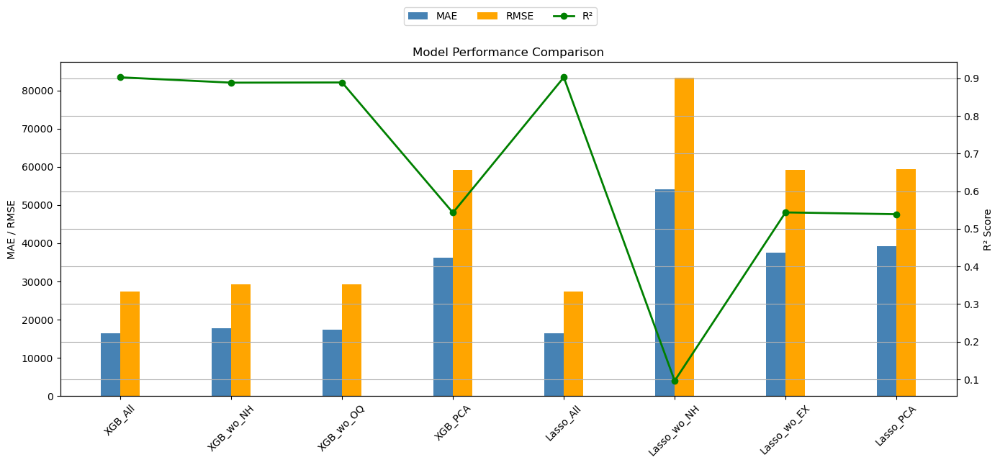

In [158]:
import matplotlib.pyplot as plt
import numpy as np

models = ['XGB_All', 'XGB_wo_NH', 'XGB_wo_OQ', 'XGB_PCA', 'Lasso_All', 'Lasso_wo_NH', 'Lasso_wo_EX', 'Lasso_PCA']
mae =   [16467, 17808, 17364, 36209, 16467, 54209, 37525, 39253]
rmse =  [27342, 29271, 29210, 59221, 27342, 83261, 59167, 59477]
r2 =    [0.9025, 0.8883, 0.8888, 0.5428, 0.9025, 0.0962, 0.5436, 0.5388]

x = np.arange(len(models))
width = 0.35

fig, ax1 = plt.subplots(figsize=(14, 6))

# MAE and RMSE (left axis)
ax1.bar(x - width/4, mae, width/2, label='MAE', color='steelblue')
ax1.bar(x + width/4, rmse, width/2, label='RMSE', color='orange')
ax1.set_ylabel("MAE / RMSE")
ax1.tick_params(axis='y')
ax1.set_xticks(x)
ax1.set_xticklabels(models, rotation=45)

# R2 (right axis)
ax2 = ax1.twinx()
ax2.plot(x, r2, label='R²', color='green', marker='o', linewidth=2)
ax2.set_ylabel("R² Score")

# Legends and title
fig.legend(loc='upper center', ncol=3, bbox_to_anchor=(0.5, 1.08))
plt.title("Model Performance Comparison")
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()

# Conclusion
- This coursework set out to explore the **influence** of **Neighborhood** on **house prices** using both tree-based (XGBoost) and linear (Lasso) models. Through a combination of exploratory data analysis (EDA), PCA, and model interpretation, we found **strong** and **consistent evidence** that **Neighborhood** is one of the **most** influential features in predicting **house prices**.

    - Principal Component Analysis **(PCA)** revealed that **Neighborhood** dominated the **first** principal component, contributing significantly to the overall variance in the dataset. This early indication pointed toward its structural importance.

    - In the **XGBoost** model, removing **Neighborhood** led to a **considerable** drop in performance, more so than the removal of features ranked higher in feature importance (e.g., **OverallQual**). This suggests that while other features might appear important on the surface, **Neighborhood** plays a unique and irreplaceable role in prediction.
 
    - The **Lasso** model, despite its simplicity, reinforced these insights. **Neighborhood** was one of the few features with non-zero coefficients, and removing it caused a **sharp** decline in R² and increase in **MAE** and **RMSE**.

- These findings show that **Neighborhood** is not just a supporting feature, it holds deep **structural** and **predictive** significance and plays a **major** role in determining **house prices**. That’s probably because it captures important things like how nice the area is, how close it is to schools, parks, or shops, and even how people feel about living there, things that aren't directly given in the dataset but still matter a lot.

# Saving the Model

In [160]:
import joblib

joblib.dump(best_model, "house_price_model.joblib")

['house_price_model.joblib']

# THE END